In [13]:
from qiskit import *
from qiskit import QuantumRegister, ClassicalRegister, QuantumCircuit
from qiskit import IBMQ, Aer, execute,assemble,QuantumCircuit, aqua
from qiskit.visualization import plot_histogram, plot_bloch_vector, plot_bloch_multivector
from qiskit.quantum_info import Statevector
from qiskit.extensions import *
provider = IBMQ.load_account()

from qiskit.quantum_info import random_unitary

import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import math
from math import pi, sqrt
from qiskit.circuit import Parameter

from random import seed
from random import random
import cmath

C:\Users\Saesun Kim\anaconda3\envs\name_of_my_env\lib\site-packages\qiskit\providers\ibmq\ibmqfactory.py:192: UserWarning: Timestamps in IBMQ backend properties, jobs, and job results are all now in local time instead of UTC.
  warnings.warn('Timestamps in IBMQ backend properties, jobs, and job results '
ibmqfactory.load_account:WARNING:2021-03-26 03:03:15,458: Credentials are already in use. The existing account in the session will be replaced.


In [14]:
import numpy as np
import matplotlib.pyplot as plt

import torch
from torch.autograd import Function
from torchvision import datasets, transforms
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import random

import qiskit
from qiskit import transpile, assemble
from qiskit.visualization import *

In [15]:
import random
from random import seed
from random import random

import numpy as np
import matplotlib.pyplot as plt

from numpy import where
from collections import Counter
from sklearn.datasets import make_blobs
from matplotlib import pyplot

import numpy as np
import matplotlib.pyplot as plt
from sklearn import mixture
from sklearn.neighbors import KernelDensity

import random

In [16]:
import sys
import numpy
numpy.set_printoptions(threshold=sys.maxsize)

def readfile(name):
    f = open (name , 'r')
    l = []
    l = [line.split() for line in f]
    l = np.array(l)
    return l

def strtoeval1(file):
    tt=[]
    for i in range(len(file)):
        tt.append([eval(file[i][0]),eval(file[i][1])])
    return tt

def strtoeval2(file):
    tt=[]
    for i in range(len(file)):
        tt.append(int(eval(file[i][0])))
    return tt

In [17]:
import sys
import numpy
numpy.set_printoptions(threshold=sys.maxsize)

data1a = np.array(strtoeval1(readfile(r'C:\Users\Saesun Kim\Documents\GitHub\Quantum_Machine_Learning_Express\dataset\data1a.txt')))
data1alabel = np.array(strtoeval2(readfile(r'C:\Users\Saesun Kim\Documents\GitHub\Quantum_Machine_Learning_Express\dataset\data1alabel.txt')))
ct=Counter(data1alabel)


from sklearn.utils import shuffle

a_shuffled, b_shuffled = shuffle(data1a, data1alabel)
a_shuffled[0]

array([0.45, 0.5 ])

In [18]:
def cN(eqs,string):
    if string in eqs:
        return eqs[string]   
    else:
        return 0

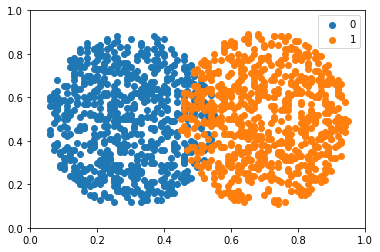

In [19]:
def my_plot(data,lab,counter):
    #This function generate the plot of the labeled data
    
    for label, _ in counter.items():
        row_ix = where(lab == label)[0]
        pyplot.scatter(data[row_ix, 0], data[row_ix, 1], label=str(label))
    pyplot.legend()
    pyplot.xlim([0, 1])
    pyplot.ylim([0, 1])
    pyplot.show()
    

my_plot(data1a,data1alabel,ct)

In [20]:
from qiskit.providers.aer import QasmSimulator, StatevectorSimulator, UnitarySimulator


backend = Aer.get_backend('qasm_simulator')
def lossCal2qubit(i,theta,nshot):    
    #i th data
    #parameter
    #return loss

    qr = QuantumRegister(2)
    cr = ClassicalRegister(2)
    qc = QuantumCircuit(qr,cr)

    qc.rx(a_shuffled[i][0],qr[0])
    qc.rx(a_shuffled[i][1],qr[1])
    
    qc.ry(pi/4,qr[:])
    qc.rz(pi/4,qr[:])
    
    qc.cz(qr[0],qr[1])
    qc.ry(pi/4,qr[:])
    qc.rz(pi/4,qr[:])
    
    count=0;
    for i in range(2):
        qc.rx(theta[count],qr[i])
        count=count+1
    for i in range(2):
        qc.rz(theta[count],qr[i])
        count=count+1   

    qc.measure(qr[:],cr[:])
    job = execute(qc, backend, shots=nshot)
    result = job.result()
    count =result.get_counts()
    lm=-1*(cN(count,'00')+cN(count,'01'))
    lp=1*(cN(count,'10')+cN(count,'11'))

    loss1=abs(
        (lm+lp)/nshot
        -2*(b_shuffled[i]-0.5)
    )
    loss2=((lm+lp)/nshot-2*(b_shuffled[i]-0.5))**2

    return loss1
lossCal2qubit(8,[1,1,1,1],10)

1.6

## SPAS method

$$ \frac{\partial L}{\partial \theta_j}= \frac{L(\theta_j+c)-L(\theta_j+c)}{2 \Delta}$$

In [21]:
#
def SPSA(i,th,c1,delta,nshot):
    sp=[]
    c=[]
    for x1 in range(4):
        c.append(c1)
    for x1 in range(4):
        sp.append((lossCal2qubit(i,th+np.array(c),nshot)-lossCal2qubit(i,th-np.array(c),nshot))/(2*delta))

    return sp

SPSA(1,theta,1,10,1)

[0.0, 0.1, 0.1, 0.0]

In [ ]:
progress=[];

thdata=[];
theta=[0,0,0,0];
c1=0.1;   
delta=6;
nshot=100;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(4000):
    delta=random.random()+0.2
    theta=theta-SPSA(1,theta,c1,delta,nshot)
    print(ep,"th iteration L=",lossCal2qubit(1,theta,nshot))
    progress.append(lossCal2qubit(1,theta,nshot))
    thdata.append(theta)


0 th iteration L= 1.16
1 th iteration L= 1.2
2 th iteration L= 1.52
3 th iteration L= 1.56
4 th iteration L= 1.44
5 th iteration L= 1.32
6 th iteration L= 1.34
7 th iteration L= 1.22
8 th iteration L= 1.3599999999999999
9 th iteration L= 1.5
10 th iteration L= 1.32
11 th iteration L= 1.18
12 th iteration L= 1.34
13 th iteration L= 1.02
14 th iteration L= 1.1
15 th iteration L= 1.0
16 th iteration L= 1.12
17 th iteration L= 1.08
18 th iteration L= 1.12
19 th iteration L= 0.88
20 th iteration L= 0.86
21 th iteration L= 1.02
22 th iteration L= 0.76
23 th iteration L= 0.8200000000000001
24 th iteration L= 0.8200000000000001
25 th iteration L= 0.86
26 th iteration L= 1.08
27 th iteration L= 0.72
28 th iteration L= 0.86
29 th iteration L= 0.8
30 th iteration L= 0.8200000000000001
31 th iteration L= 0.86
32 th iteration L= 0.8200000000000001
33 th iteration L= 0.8200000000000001
34 th iteration L= 0.62
35 th iteration L= 0.6799999999999999
36 th iteration L= 0.48
37 th iteration L= 0.56
38 th

313 th iteration L= 1.54
314 th iteration L= 1.62
315 th iteration L= 1.54
316 th iteration L= 1.72
317 th iteration L= 1.6600000000000001
318 th iteration L= 1.78
319 th iteration L= 1.7
320 th iteration L= 1.6600000000000001
321 th iteration L= 1.6400000000000001
322 th iteration L= 1.5
323 th iteration L= 1.6800000000000002
324 th iteration L= 1.74
325 th iteration L= 1.74
326 th iteration L= 1.7
327 th iteration L= 1.6600000000000001
328 th iteration L= 1.52
329 th iteration L= 1.7
330 th iteration L= 1.6800000000000002
331 th iteration L= 1.6
332 th iteration L= 1.72
333 th iteration L= 1.62
334 th iteration L= 1.78
335 th iteration L= 1.6
336 th iteration L= 1.74
337 th iteration L= 1.6600000000000001
338 th iteration L= 1.6800000000000002
339 th iteration L= 1.62
340 th iteration L= 1.62
341 th iteration L= 1.6600000000000001
342 th iteration L= 1.48
343 th iteration L= 1.58
344 th iteration L= 1.6600000000000001
345 th iteration L= 1.62
346 th iteration L= 1.78
347 th iteration

614 th iteration L= 0.96
615 th iteration L= 1.02
616 th iteration L= 0.9
617 th iteration L= 0.84
618 th iteration L= 0.96
619 th iteration L= 0.96
620 th iteration L= 0.96
621 th iteration L= 0.74
622 th iteration L= 0.9
623 th iteration L= 0.88
624 th iteration L= 0.6799999999999999
625 th iteration L= 0.38
626 th iteration L= 0.31999999999999995
627 th iteration L= 0.56
628 th iteration L= 0.31999999999999995
629 th iteration L= 0.4
630 th iteration L= 0.6
631 th iteration L= 0.62
632 th iteration L= 0.48
633 th iteration L= 0.4
634 th iteration L= 0.48
635 th iteration L= 0.45999999999999996
636 th iteration L= 0.26
637 th iteration L= 0.38
638 th iteration L= 0.24
639 th iteration L= 0.48
640 th iteration L= 0.38
641 th iteration L= 0.36
642 th iteration L= 0.33999999999999997
643 th iteration L= 0.31999999999999995
644 th iteration L= 0.30000000000000004
645 th iteration L= 0.38
646 th iteration L= 0.31999999999999995
647 th iteration L= 0.26
648 th iteration L= 0.43999999999999

905 th iteration L= 1.46
906 th iteration L= 1.62
907 th iteration L= 1.56
908 th iteration L= 1.62
909 th iteration L= 1.6
910 th iteration L= 1.44
911 th iteration L= 1.4
912 th iteration L= 1.4
913 th iteration L= 1.6
914 th iteration L= 1.48
915 th iteration L= 1.44
916 th iteration L= 1.42
917 th iteration L= 1.52
918 th iteration L= 1.4
919 th iteration L= 1.34
920 th iteration L= 1.24
921 th iteration L= 1.28
922 th iteration L= 1.42
923 th iteration L= 1.5
924 th iteration L= 1.42
925 th iteration L= 1.42
926 th iteration L= 1.42
927 th iteration L= 1.58
928 th iteration L= 1.44
929 th iteration L= 1.3
930 th iteration L= 1.46
931 th iteration L= 1.48
932 th iteration L= 1.52
933 th iteration L= 1.74
934 th iteration L= 1.58
935 th iteration L= 1.56
936 th iteration L= 1.4
937 th iteration L= 1.5
938 th iteration L= 1.58
939 th iteration L= 1.3599999999999999
940 th iteration L= 1.42
941 th iteration L= 1.3
942 th iteration L= 1.46
943 th iteration L= 1.6400000000000001
944 th 

1177 th iteration L= 0.38
1178 th iteration L= 0.33999999999999997
1179 th iteration L= 0.36
1180 th iteration L= 0.43999999999999995
1181 th iteration L= 0.54
1182 th iteration L= 0.30000000000000004
1183 th iteration L= 0.28
1184 th iteration L= 0.42000000000000004
1185 th iteration L= 0.5800000000000001
1186 th iteration L= 0.5800000000000001
1187 th iteration L= 0.36
1188 th iteration L= 0.5
1189 th iteration L= 0.4
1190 th iteration L= 0.5
1191 th iteration L= 0.48
1192 th iteration L= 0.48
1193 th iteration L= 0.5
1194 th iteration L= 0.33999999999999997
1195 th iteration L= 0.4
1196 th iteration L= 0.30000000000000004
1197 th iteration L= 0.24
1198 th iteration L= 0.30000000000000004
1199 th iteration L= 0.38
1200 th iteration L= 0.42000000000000004
1201 th iteration L= 0.52
1202 th iteration L= 0.31999999999999995
1203 th iteration L= 0.36
1204 th iteration L= 0.33999999999999997
1205 th iteration L= 0.33999999999999997
1206 th iteration L= 0.36
1207 th iteration L= 0.319999999

In [60]:
progress=[];

thdata=[];
theta=[0,0,0,0];
c1=0.05;   
delta=6;
nshot=1000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(4000):
    delta=random.random()+0.3
    theta=theta-SPSA(1,theta,c1,delta,nshot)
    print(ep,"th iteration L=",lossCal2qubit(1,theta,nshot))
    progress.append(lossCal2qubit(1,theta,nshot))
    thdata.append(theta)


0 th iteration L= 1.284
1 th iteration L= 1.198
2 th iteration L= 1.228
3 th iteration L= 1.2
4 th iteration L= 1.19
5 th iteration L= 1.238
6 th iteration L= 1.22
7 th iteration L= 1.142
8 th iteration L= 1.216
9 th iteration L= 1.2
10 th iteration L= 1.23
11 th iteration L= 1.198
12 th iteration L= 1.162
13 th iteration L= 1.2
14 th iteration L= 1.17
15 th iteration L= 1.216
16 th iteration L= 1.25
17 th iteration L= 1.282
18 th iteration L= 1.328
19 th iteration L= 1.322
20 th iteration L= 1.3719999999999999
21 th iteration L= 1.27
22 th iteration L= 1.296
23 th iteration L= 1.354
24 th iteration L= 1.38
25 th iteration L= 1.33
26 th iteration L= 1.4060000000000001
27 th iteration L= 1.326
28 th iteration L= 1.314
29 th iteration L= 1.316
30 th iteration L= 1.324
31 th iteration L= 1.292
32 th iteration L= 1.268
33 th iteration L= 1.3479999999999999
34 th iteration L= 1.306
35 th iteration L= 1.316
36 th iteration L= 1.3719999999999999
37 th iteration L= 1.328
38 th iteration L= 1.3

303 th iteration L= 1.032
304 th iteration L= 1.05
305 th iteration L= 1.046
306 th iteration L= 0.99
307 th iteration L= 1.006
308 th iteration L= 0.952
309 th iteration L= 0.948
310 th iteration L= 0.996
311 th iteration L= 0.94
312 th iteration L= 1.012
313 th iteration L= 0.958
314 th iteration L= 0.97
315 th iteration L= 0.95
316 th iteration L= 1.006
317 th iteration L= 1.086
318 th iteration L= 1.06
319 th iteration L= 1.064
320 th iteration L= 1.022
321 th iteration L= 0.97
322 th iteration L= 1.048
323 th iteration L= 1.05
324 th iteration L= 0.914
325 th iteration L= 0.902
326 th iteration L= 0.854
327 th iteration L= 0.9319999999999999
328 th iteration L= 0.838
329 th iteration L= 0.866
330 th iteration L= 0.866
331 th iteration L= 0.9
332 th iteration L= 0.898
333 th iteration L= 0.86
334 th iteration L= 0.844
335 th iteration L= 0.858
336 th iteration L= 0.852
337 th iteration L= 0.864
338 th iteration L= 0.846
339 th iteration L= 0.882
340 th iteration L= 0.892
341 th ite

611 th iteration L= 1.058
612 th iteration L= 1.152
613 th iteration L= 1.1280000000000001
614 th iteration L= 1.222
615 th iteration L= 1.152
616 th iteration L= 1.144
617 th iteration L= 1.144
618 th iteration L= 1.1360000000000001
619 th iteration L= 1.184
620 th iteration L= 1.152
621 th iteration L= 1.148
622 th iteration L= 1.184
623 th iteration L= 1.198
624 th iteration L= 1.218
625 th iteration L= 1.248
626 th iteration L= 1.184
627 th iteration L= 1.226
628 th iteration L= 1.17
629 th iteration L= 1.274
630 th iteration L= 1.226
631 th iteration L= 1.28
632 th iteration L= 1.294
633 th iteration L= 1.202
634 th iteration L= 1.236
635 th iteration L= 1.198
636 th iteration L= 1.208
637 th iteration L= 1.228
638 th iteration L= 1.192
639 th iteration L= 1.188
640 th iteration L= 1.164
641 th iteration L= 1.1400000000000001
642 th iteration L= 1.134
643 th iteration L= 1.134
644 th iteration L= 1.042
645 th iteration L= 1.04
646 th iteration L= 1.126
647 th iteration L= 1.104
64

904 th iteration L= 1.3900000000000001
905 th iteration L= 1.35
906 th iteration L= 1.314
907 th iteration L= 1.284
908 th iteration L= 1.272
909 th iteration L= 1.316
910 th iteration L= 1.226
911 th iteration L= 1.232
912 th iteration L= 1.25
913 th iteration L= 1.24
914 th iteration L= 1.248
915 th iteration L= 1.272
916 th iteration L= 1.296
917 th iteration L= 1.26
918 th iteration L= 1.212
919 th iteration L= 1.226
920 th iteration L= 1.264
921 th iteration L= 1.26
922 th iteration L= 1.272
923 th iteration L= 1.226
924 th iteration L= 1.21
925 th iteration L= 1.184
926 th iteration L= 1.21
927 th iteration L= 1.206
928 th iteration L= 1.174
929 th iteration L= 1.22
930 th iteration L= 1.178
931 th iteration L= 1.196
932 th iteration L= 1.15
933 th iteration L= 1.164
934 th iteration L= 1.186
935 th iteration L= 1.1400000000000001
936 th iteration L= 1.13
937 th iteration L= 1.098
938 th iteration L= 1.1280000000000001
939 th iteration L= 1.17
940 th iteration L= 1.16
941 th iter

1205 th iteration L= 1.172
1206 th iteration L= 1.242
1207 th iteration L= 1.238
1208 th iteration L= 1.22
1209 th iteration L= 1.238
1210 th iteration L= 1.224
1211 th iteration L= 1.244
1212 th iteration L= 1.13
1213 th iteration L= 1.168
1214 th iteration L= 1.224
1215 th iteration L= 1.164
1216 th iteration L= 1.158
1217 th iteration L= 1.19
1218 th iteration L= 1.176
1219 th iteration L= 1.166
1220 th iteration L= 1.126
1221 th iteration L= 1.142
1222 th iteration L= 1.192
1223 th iteration L= 1.09
1224 th iteration L= 1.156
1225 th iteration L= 1.164
1226 th iteration L= 1.204
1227 th iteration L= 1.154
1228 th iteration L= 1.144
1229 th iteration L= 1.196
1230 th iteration L= 1.214
1231 th iteration L= 1.164
1232 th iteration L= 1.256
1233 th iteration L= 1.256
1234 th iteration L= 1.216
1235 th iteration L= 1.236
1236 th iteration L= 1.222
1237 th iteration L= 1.1320000000000001
1238 th iteration L= 1.208
1239 th iteration L= 1.162
1240 th iteration L= 1.17
1241 th iteration L=

1507 th iteration L= 1.16
1508 th iteration L= 1.202
1509 th iteration L= 1.1400000000000001
1510 th iteration L= 1.096
1511 th iteration L= 1.084
1512 th iteration L= 1.108
1513 th iteration L= 1.1179999999999999
1514 th iteration L= 1.182
1515 th iteration L= 1.102
1516 th iteration L= 1.146
1517 th iteration L= 1.148
1518 th iteration L= 1.104
1519 th iteration L= 1.124
1520 th iteration L= 1.124
1521 th iteration L= 1.138
1522 th iteration L= 1.156
1523 th iteration L= 1.178
1524 th iteration L= 1.154
1525 th iteration L= 1.19
1526 th iteration L= 1.198
1527 th iteration L= 1.176
1528 th iteration L= 1.116
1529 th iteration L= 1.208
1530 th iteration L= 1.25
1531 th iteration L= 1.228
1532 th iteration L= 1.286
1533 th iteration L= 1.29
1534 th iteration L= 1.274
1535 th iteration L= 1.254
1536 th iteration L= 1.26
1537 th iteration L= 1.232
1538 th iteration L= 1.266
1539 th iteration L= 1.248
1540 th iteration L= 1.238
1541 th iteration L= 1.208
1542 th iteration L= 1.252
1543 th

1806 th iteration L= 0.732
1807 th iteration L= 0.706
1808 th iteration L= 0.77
1809 th iteration L= 0.71
1810 th iteration L= 0.624
1811 th iteration L= 0.6659999999999999
1812 th iteration L= 0.656
1813 th iteration L= 0.594
1814 th iteration L= 0.5880000000000001
1815 th iteration L= 0.626
1816 th iteration L= 0.628
1817 th iteration L= 0.6639999999999999
1818 th iteration L= 0.62
1819 th iteration L= 0.622
1820 th iteration L= 0.606
1821 th iteration L= 0.6719999999999999
1822 th iteration L= 0.622
1823 th iteration L= 0.612
1824 th iteration L= 0.6819999999999999
1825 th iteration L= 0.6639999999999999
1826 th iteration L= 0.602
1827 th iteration L= 0.71
1828 th iteration L= 0.6679999999999999
1829 th iteration L= 0.618
1830 th iteration L= 0.63
1831 th iteration L= 0.628
1832 th iteration L= 0.616
1833 th iteration L= 0.7
1834 th iteration L= 0.702
1835 th iteration L= 0.6859999999999999
1836 th iteration L= 0.6779999999999999
1837 th iteration L= 0.7
1838 th iteration L= 0.66399

2087 th iteration L= 0.772
2088 th iteration L= 0.788
2089 th iteration L= 0.772
2090 th iteration L= 0.738
2091 th iteration L= 0.778
2092 th iteration L= 0.786
2093 th iteration L= 0.764
2094 th iteration L= 0.772
2095 th iteration L= 0.628
2096 th iteration L= 0.708
2097 th iteration L= 0.78
2098 th iteration L= 0.778
2099 th iteration L= 0.77
2100 th iteration L= 0.778
2101 th iteration L= 0.784
2102 th iteration L= 0.8240000000000001
2103 th iteration L= 0.906
2104 th iteration L= 0.788
2105 th iteration L= 0.862
2106 th iteration L= 0.878
2107 th iteration L= 0.784
2108 th iteration L= 0.8160000000000001
2109 th iteration L= 0.796
2110 th iteration L= 0.878
2111 th iteration L= 0.842
2112 th iteration L= 0.886
2113 th iteration L= 0.898
2114 th iteration L= 0.906
2115 th iteration L= 0.944
2116 th iteration L= 0.952
2117 th iteration L= 1.002
2118 th iteration L= 0.996
2119 th iteration L= 0.962
2120 th iteration L= 0.952
2121 th iteration L= 0.9359999999999999
2122 th iteration 

2388 th iteration L= 0.864
2389 th iteration L= 0.844
2390 th iteration L= 0.9
2391 th iteration L= 0.948
2392 th iteration L= 0.902
2393 th iteration L= 0.844
2394 th iteration L= 0.876
2395 th iteration L= 0.868
2396 th iteration L= 0.894
2397 th iteration L= 0.872
2398 th iteration L= 0.89
2399 th iteration L= 0.882
2400 th iteration L= 0.886
2401 th iteration L= 0.9299999999999999
2402 th iteration L= 0.89
2403 th iteration L= 0.9
2404 th iteration L= 0.782
2405 th iteration L= 0.878
2406 th iteration L= 0.858
2407 th iteration L= 0.84
2408 th iteration L= 0.886
2409 th iteration L= 0.892
2410 th iteration L= 0.894
2411 th iteration L= 0.8240000000000001
2412 th iteration L= 0.874
2413 th iteration L= 0.834
2414 th iteration L= 0.756
2415 th iteration L= 0.802
2416 th iteration L= 0.8180000000000001
2417 th iteration L= 0.772
2418 th iteration L= 0.79
2419 th iteration L= 0.81
2420 th iteration L= 0.848
2421 th iteration L= 0.812
2422 th iteration L= 0.77
2423 th iteration L= 0.792

2682 th iteration L= 0.806
2683 th iteration L= 0.84
2684 th iteration L= 0.8140000000000001
2685 th iteration L= 0.808
2686 th iteration L= 0.854
2687 th iteration L= 0.806
2688 th iteration L= 0.718
2689 th iteration L= 0.764
2690 th iteration L= 0.718
2691 th iteration L= 0.724
2692 th iteration L= 0.738
2693 th iteration L= 0.866
2694 th iteration L= 0.77
2695 th iteration L= 0.794
2696 th iteration L= 0.77
2697 th iteration L= 0.8240000000000001
2698 th iteration L= 0.806
2699 th iteration L= 0.758
2700 th iteration L= 0.77
2701 th iteration L= 0.732
2702 th iteration L= 0.766
2703 th iteration L= 0.772
2704 th iteration L= 0.656
2705 th iteration L= 0.618
2706 th iteration L= 0.636
2707 th iteration L= 0.6639999999999999
2708 th iteration L= 0.604
2709 th iteration L= 0.6799999999999999
2710 th iteration L= 0.6679999999999999
2711 th iteration L= 0.71
2712 th iteration L= 0.6639999999999999
2713 th iteration L= 0.6739999999999999
2714 th iteration L= 0.718
2715 th iteration L= 0.

2949 th iteration L= 0.372
2950 th iteration L= 0.344
2951 th iteration L= 0.364
2952 th iteration L= 0.33199999999999996
2953 th iteration L= 0.386
2954 th iteration L= 0.376
2955 th iteration L= 0.378
2956 th iteration L= 0.31599999999999995
2957 th iteration L= 0.364
2958 th iteration L= 0.372
2959 th iteration L= 0.376
2960 th iteration L= 0.32999999999999996
2961 th iteration L= 0.356
2962 th iteration L= 0.368
2963 th iteration L= 0.32799999999999996
2964 th iteration L= 0.29600000000000004
2965 th iteration L= 0.362
2966 th iteration L= 0.29000000000000004
2967 th iteration L= 0.366
2968 th iteration L= 0.33199999999999996
2969 th iteration L= 0.398
2970 th iteration L= 0.356
2971 th iteration L= 0.366
2972 th iteration L= 0.346
2973 th iteration L= 0.35
2974 th iteration L= 0.32599999999999996
2975 th iteration L= 0.344
2976 th iteration L= 0.372
2977 th iteration L= 0.37
2978 th iteration L= 0.37
2979 th iteration L= 0.33199999999999996
2980 th iteration L= 0.37
2981 th iterat

3216 th iteration L= 0.37
3217 th iteration L= 0.33399999999999996
3218 th iteration L= 0.356
3219 th iteration L= 0.354
3220 th iteration L= 0.354
3221 th iteration L= 0.4
3222 th iteration L= 0.362
3223 th iteration L= 0.33199999999999996
3224 th iteration L= 0.36
3225 th iteration L= 0.31799999999999995
3226 th iteration L= 0.31000000000000005
3227 th iteration L= 0.33799999999999997
3228 th iteration L= 0.364
3229 th iteration L= 0.33599999999999997
3230 th iteration L= 0.33599999999999997
3231 th iteration L= 0.356
3232 th iteration L= 0.36
3233 th iteration L= 0.402
3234 th iteration L= 0.33399999999999996
3235 th iteration L= 0.358
3236 th iteration L= 0.37
3237 th iteration L= 0.358
3238 th iteration L= 0.346
3239 th iteration L= 0.362
3240 th iteration L= 0.33199999999999996
3241 th iteration L= 0.32199999999999995
3242 th iteration L= 0.31200000000000006
3243 th iteration L= 0.33999999999999997
3244 th iteration L= 0.30800000000000005
3245 th iteration L= 0.36
3246 th iterati

3476 th iteration L= 0.352
3477 th iteration L= 0.388
3478 th iteration L= 0.354
3479 th iteration L= 0.36
3480 th iteration L= 0.378
3481 th iteration L= 0.32399999999999995
3482 th iteration L= 0.37
3483 th iteration L= 0.34199999999999997
3484 th iteration L= 0.37
3485 th iteration L= 0.348
3486 th iteration L= 0.376
3487 th iteration L= 0.35
3488 th iteration L= 0.392
3489 th iteration L= 0.33199999999999996
3490 th iteration L= 0.32599999999999996
3491 th iteration L= 0.398
3492 th iteration L= 0.364
3493 th iteration L= 0.372
3494 th iteration L= 0.33399999999999996
3495 th iteration L= 0.32599999999999996
3496 th iteration L= 0.388
3497 th iteration L= 0.32999999999999996
3498 th iteration L= 0.33399999999999996
3499 th iteration L= 0.348
3500 th iteration L= 0.37
3501 th iteration L= 0.32799999999999996
3502 th iteration L= 0.384
3503 th iteration L= 0.30800000000000005
3504 th iteration L= 0.392
3505 th iteration L= 0.30800000000000005
3506 th iteration L= 0.372
3507 th iterat

3747 th iteration L= 0.42600000000000005
3748 th iteration L= 0.406
3749 th iteration L= 0.41800000000000004
3750 th iteration L= 0.398
3751 th iteration L= 0.43799999999999994
3752 th iteration L= 0.376
3753 th iteration L= 0.394
3754 th iteration L= 0.41800000000000004
3755 th iteration L= 0.40800000000000003
3756 th iteration L= 0.392
3757 th iteration L= 0.41600000000000004
3758 th iteration L= 0.43600000000000005
3759 th iteration L= 0.42200000000000004
3760 th iteration L= 0.42400000000000004
3761 th iteration L= 0.388
3762 th iteration L= 0.40800000000000003
3763 th iteration L= 0.46199999999999997
3764 th iteration L= 0.45799999999999996
3765 th iteration L= 0.44399999999999995
3766 th iteration L= 0.49
3767 th iteration L= 0.44199999999999995
3768 th iteration L= 0.51
3769 th iteration L= 0.43200000000000005
3770 th iteration L= 0.478
3771 th iteration L= 0.43000000000000005
3772 th iteration L= 0.516
3773 th iteration L= 0.46599999999999997
3774 th iteration L= 0.461999999999

After 1000 iteration we have theta = [   2.40276137   -0.9683728  -142.32169401    2.54624589]


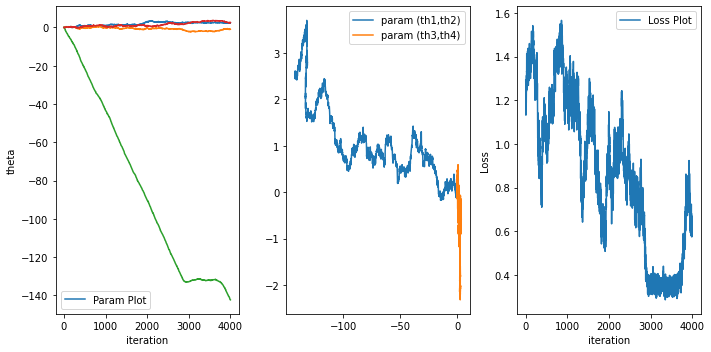

In [61]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()    

After 1000 iteration we have theta = [ 6.84735881  5.29761561  5.34645288 16.1308515 ]


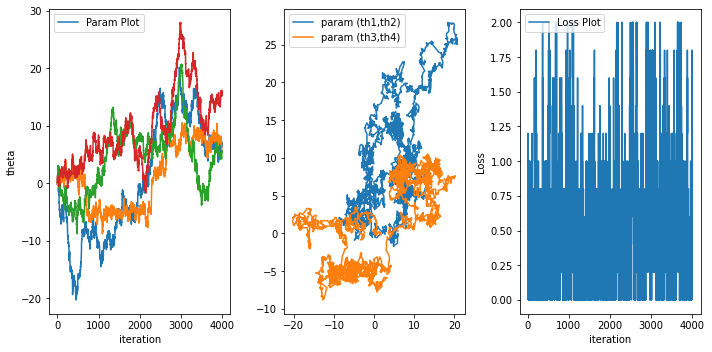

In [147]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()    

In [148]:
progress=[];

thdata=[];
theta=[0,0,0,0];
c1=0.05;   
delta=6;
nshot=100;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(4000):
    delta=random.random()+0.3
    theta=theta-SPSA(1,theta,c1,delta,nshot)
    print(ep,"th iteration L=",lossCal2qubit(1,theta,nshot))
    progress.append(lossCal2qubit(1,theta,nshot))
    thdata.append(theta)

0 th iteration L= 0.92
1 th iteration L= 0.9
2 th iteration L= 0.7
3 th iteration L= 0.6599999999999999
4 th iteration L= 0.64
5 th iteration L= 0.5
6 th iteration L= 0.7
7 th iteration L= 0.7
8 th iteration L= 0.52
9 th iteration L= 0.88
10 th iteration L= 0.74
11 th iteration L= 0.76
12 th iteration L= 0.62
13 th iteration L= 0.30000000000000004
14 th iteration L= 0.24
15 th iteration L= 0.38
16 th iteration L= 0.18000000000000005
17 th iteration L= 0.14
18 th iteration L= 0.24
19 th iteration L= 0.21999999999999997
20 th iteration L= 0.31999999999999995
21 th iteration L= 0.31999999999999995
22 th iteration L= 0.21999999999999997
23 th iteration L= 0.30000000000000004
24 th iteration L= 0.26
25 th iteration L= 0.36
26 th iteration L= 0.36
27 th iteration L= 0.28
28 th iteration L= 0.33999999999999997
29 th iteration L= 0.30000000000000004
30 th iteration L= 0.24
31 th iteration L= 0.28
32 th iteration L= 0.19999999999999996
33 th iteration L= 0.28
34 th iteration L= 0.45999999999999

253 th iteration L= 0.28
254 th iteration L= 0.18000000000000005
255 th iteration L= 0.19999999999999996
256 th iteration L= 0.24
257 th iteration L= 0.19999999999999996
258 th iteration L= 0.21999999999999997
259 th iteration L= 0.21999999999999997
260 th iteration L= 0.09999999999999998
261 th iteration L= 0.30000000000000004
262 th iteration L= 0.18000000000000005
263 th iteration L= 0.18000000000000005
264 th iteration L= 0.24
265 th iteration L= 0.26
266 th iteration L= 0.26
267 th iteration L= 0.16000000000000003
268 th iteration L= 0.30000000000000004
269 th iteration L= 0.33999999999999997
270 th iteration L= 0.42000000000000004
271 th iteration L= 0.36
272 th iteration L= 0.31999999999999995
273 th iteration L= 0.24
274 th iteration L= 0.38
275 th iteration L= 0.43999999999999995
276 th iteration L= 0.33999999999999997
277 th iteration L= 0.33999999999999997
278 th iteration L= 0.26
279 th iteration L= 0.36
280 th iteration L= 0.45999999999999996
281 th iteration L= 0.26
282 t

504 th iteration L= 0.21999999999999997
505 th iteration L= 0.31999999999999995
506 th iteration L= 0.31999999999999995
507 th iteration L= 0.26
508 th iteration L= 0.28
509 th iteration L= 0.33999999999999997
510 th iteration L= 0.24
511 th iteration L= 0.19999999999999996
512 th iteration L= 0.19999999999999996
513 th iteration L= 0.33999999999999997
514 th iteration L= 0.16000000000000003
515 th iteration L= 0.26
516 th iteration L= 0.30000000000000004
517 th iteration L= 0.31999999999999995
518 th iteration L= 0.21999999999999997
519 th iteration L= 0.38
520 th iteration L= 0.16000000000000003
521 th iteration L= 0.26
522 th iteration L= 0.24
523 th iteration L= 0.31999999999999995
524 th iteration L= 0.30000000000000004
525 th iteration L= 0.36
526 th iteration L= 0.24
527 th iteration L= 0.30000000000000004
528 th iteration L= 0.28
529 th iteration L= 0.24
530 th iteration L= 0.21999999999999997
531 th iteration L= 0.14
532 th iteration L= 0.24
533 th iteration L= 0.1800000000000

757 th iteration L= 0.14
758 th iteration L= 0.21999999999999997
759 th iteration L= 0.19999999999999996
760 th iteration L= 0.30000000000000004
761 th iteration L= 0.30000000000000004
762 th iteration L= 0.19999999999999996
763 th iteration L= 0.26
764 th iteration L= 0.24
765 th iteration L= 0.19999999999999996
766 th iteration L= 0.4
767 th iteration L= 0.24
768 th iteration L= 0.24
769 th iteration L= 0.36
770 th iteration L= 0.36
771 th iteration L= 0.26
772 th iteration L= 0.38
773 th iteration L= 0.26
774 th iteration L= 0.33999999999999997
775 th iteration L= 0.30000000000000004
776 th iteration L= 0.21999999999999997
777 th iteration L= 0.21999999999999997
778 th iteration L= 0.38
779 th iteration L= 0.31999999999999995
780 th iteration L= 0.18000000000000005
781 th iteration L= 0.28
782 th iteration L= 0.33999999999999997
783 th iteration L= 0.24
784 th iteration L= 0.38
785 th iteration L= 0.38
786 th iteration L= 0.33999999999999997
787 th iteration L= 0.42000000000000004
7

1010 th iteration L= 0.14
1011 th iteration L= 0.30000000000000004
1012 th iteration L= 0.28
1013 th iteration L= 0.19999999999999996
1014 th iteration L= 0.33999999999999997
1015 th iteration L= 0.19999999999999996
1016 th iteration L= 0.24
1017 th iteration L= 0.24
1018 th iteration L= 0.18000000000000005
1019 th iteration L= 0.21999999999999997
1020 th iteration L= 0.24
1021 th iteration L= 0.28
1022 th iteration L= 0.18000000000000005
1023 th iteration L= 0.14
1024 th iteration L= 0.18000000000000005
1025 th iteration L= 0.16000000000000003
1026 th iteration L= 0.28
1027 th iteration L= 0.16000000000000003
1028 th iteration L= 0.28
1029 th iteration L= 0.26
1030 th iteration L= 0.26
1031 th iteration L= 0.36
1032 th iteration L= 0.24
1033 th iteration L= 0.24
1034 th iteration L= 0.36
1035 th iteration L= 0.24
1036 th iteration L= 0.26
1037 th iteration L= 0.24
1038 th iteration L= 0.26
1039 th iteration L= 0.19999999999999996
1040 th iteration L= 0.18000000000000005
1041 th iterat

1251 th iteration L= 0.31999999999999995
1252 th iteration L= 0.18000000000000005
1253 th iteration L= 0.36
1254 th iteration L= 0.19999999999999996
1255 th iteration L= 0.19999999999999996
1256 th iteration L= 0.09999999999999998
1257 th iteration L= 0.24
1258 th iteration L= 0.19999999999999996
1259 th iteration L= 0.16000000000000003
1260 th iteration L= 0.18000000000000005
1261 th iteration L= 0.12
1262 th iteration L= 0.30000000000000004
1263 th iteration L= 0.42000000000000004
1264 th iteration L= 0.19999999999999996
1265 th iteration L= 0.26
1266 th iteration L= 0.19999999999999996
1267 th iteration L= 0.28
1268 th iteration L= 0.33999999999999997
1269 th iteration L= 0.31999999999999995
1270 th iteration L= 0.33999999999999997
1271 th iteration L= 0.14
1272 th iteration L= 0.33999999999999997
1273 th iteration L= 0.30000000000000004
1274 th iteration L= 0.28
1275 th iteration L= 0.24
1276 th iteration L= 0.18000000000000005
1277 th iteration L= 0.28
1278 th iteration L= 0.24
12

1486 th iteration L= 0.4
1487 th iteration L= 0.33999999999999997
1488 th iteration L= 0.42000000000000004
1489 th iteration L= 0.24
1490 th iteration L= 0.18000000000000005
1491 th iteration L= 0.48
1492 th iteration L= 0.26
1493 th iteration L= 0.30000000000000004
1494 th iteration L= 0.33999999999999997
1495 th iteration L= 0.33999999999999997
1496 th iteration L= 0.26
1497 th iteration L= 0.19999999999999996
1498 th iteration L= 0.26
1499 th iteration L= 0.26
1500 th iteration L= 0.26
1501 th iteration L= 0.30000000000000004
1502 th iteration L= 0.16000000000000003
1503 th iteration L= 0.18000000000000005
1504 th iteration L= 0.31999999999999995
1505 th iteration L= 0.30000000000000004
1506 th iteration L= 0.28
1507 th iteration L= 0.30000000000000004
1508 th iteration L= 0.26
1509 th iteration L= 0.19999999999999996
1510 th iteration L= 0.28
1511 th iteration L= 0.19999999999999996
1512 th iteration L= 0.24
1513 th iteration L= 0.33999999999999997
1514 th iteration L= 0.14
1515 th

1728 th iteration L= 0.24
1729 th iteration L= 0.43999999999999995
1730 th iteration L= 0.31999999999999995
1731 th iteration L= 0.54
1732 th iteration L= 0.38
1733 th iteration L= 0.38
1734 th iteration L= 0.45999999999999996
1735 th iteration L= 0.45999999999999996
1736 th iteration L= 0.4
1737 th iteration L= 0.56
1738 th iteration L= 0.5800000000000001
1739 th iteration L= 0.38
1740 th iteration L= 0.42000000000000004
1741 th iteration L= 0.31999999999999995
1742 th iteration L= 0.42000000000000004
1743 th iteration L= 0.48
1744 th iteration L= 0.42000000000000004
1745 th iteration L= 0.43999999999999995
1746 th iteration L= 0.45999999999999996
1747 th iteration L= 0.33999999999999997
1748 th iteration L= 0.36
1749 th iteration L= 0.36
1750 th iteration L= 0.31999999999999995
1751 th iteration L= 0.28
1752 th iteration L= 0.21999999999999997
1753 th iteration L= 0.42000000000000004
1754 th iteration L= 0.19999999999999996
1755 th iteration L= 0.28
1756 th iteration L= 0.28
1757 th 

1972 th iteration L= 0.52
1973 th iteration L= 0.56
1974 th iteration L= 0.48
1975 th iteration L= 0.38
1976 th iteration L= 0.31999999999999995
1977 th iteration L= 0.45999999999999996
1978 th iteration L= 0.36
1979 th iteration L= 0.5800000000000001
1980 th iteration L= 0.38
1981 th iteration L= 0.36
1982 th iteration L= 0.30000000000000004
1983 th iteration L= 0.48
1984 th iteration L= 0.36
1985 th iteration L= 0.36
1986 th iteration L= 0.42000000000000004
1987 th iteration L= 0.31999999999999995
1988 th iteration L= 0.52
1989 th iteration L= 0.48
1990 th iteration L= 0.43999999999999995
1991 th iteration L= 0.56
1992 th iteration L= 0.43999999999999995
1993 th iteration L= 0.42000000000000004
1994 th iteration L= 0.64
1995 th iteration L= 0.54
1996 th iteration L= 0.42000000000000004
1997 th iteration L= 0.6
1998 th iteration L= 0.5800000000000001
1999 th iteration L= 0.31999999999999995
2000 th iteration L= 0.5800000000000001
2001 th iteration L= 0.6599999999999999
2002 th iterati

2215 th iteration L= 0.38
2216 th iteration L= 0.12
2217 th iteration L= 0.30000000000000004
2218 th iteration L= 0.26
2219 th iteration L= 0.33999999999999997
2220 th iteration L= 0.18000000000000005
2221 th iteration L= 0.14
2222 th iteration L= 0.18000000000000005
2223 th iteration L= 0.33999999999999997
2224 th iteration L= 0.21999999999999997
2225 th iteration L= 0.19999999999999996
2226 th iteration L= 0.19999999999999996
2227 th iteration L= 0.19999999999999996
2228 th iteration L= 0.33999999999999997
2229 th iteration L= 0.19999999999999996
2230 th iteration L= 0.30000000000000004
2231 th iteration L= 0.28
2232 th iteration L= 0.24
2233 th iteration L= 0.26
2234 th iteration L= 0.19999999999999996
2235 th iteration L= 0.21999999999999997
2236 th iteration L= 0.30000000000000004
2237 th iteration L= 0.36
2238 th iteration L= 0.4
2239 th iteration L= 0.16000000000000003
2240 th iteration L= 0.19999999999999996
2241 th iteration L= 0.38
2242 th iteration L= 0.31999999999999995
224

2462 th iteration L= 0.31999999999999995
2463 th iteration L= 0.31999999999999995
2464 th iteration L= 0.28
2465 th iteration L= 0.16000000000000003
2466 th iteration L= 0.24
2467 th iteration L= 0.24
2468 th iteration L= 0.19999999999999996
2469 th iteration L= 0.48
2470 th iteration L= 0.21999999999999997
2471 th iteration L= 0.21999999999999997
2472 th iteration L= 0.31999999999999995
2473 th iteration L= 0.26
2474 th iteration L= 0.33999999999999997
2475 th iteration L= 0.24
2476 th iteration L= 0.38
2477 th iteration L= 0.16000000000000003
2478 th iteration L= 0.4
2479 th iteration L= 0.36
2480 th iteration L= 0.38
2481 th iteration L= 0.21999999999999997
2482 th iteration L= 0.24
2483 th iteration L= 0.36
2484 th iteration L= 0.30000000000000004
2485 th iteration L= 0.30000000000000004
2486 th iteration L= 0.30000000000000004
2487 th iteration L= 0.33999999999999997
2488 th iteration L= 0.24
2489 th iteration L= 0.31999999999999995
2490 th iteration L= 0.28
2491 th iteration L= 0

2711 th iteration L= 0.36
2712 th iteration L= 0.18000000000000005
2713 th iteration L= 0.31999999999999995
2714 th iteration L= 0.19999999999999996
2715 th iteration L= 0.28
2716 th iteration L= 0.26
2717 th iteration L= 0.30000000000000004
2718 th iteration L= 0.19999999999999996
2719 th iteration L= 0.16000000000000003
2720 th iteration L= 0.16000000000000003
2721 th iteration L= 0.26
2722 th iteration L= 0.24
2723 th iteration L= 0.38
2724 th iteration L= 0.19999999999999996
2725 th iteration L= 0.18000000000000005
2726 th iteration L= 0.36
2727 th iteration L= 0.16000000000000003
2728 th iteration L= 0.24
2729 th iteration L= 0.24
2730 th iteration L= 0.28
2731 th iteration L= 0.28
2732 th iteration L= 0.26
2733 th iteration L= 0.09999999999999998
2734 th iteration L= 0.21999999999999997
2735 th iteration L= 0.4
2736 th iteration L= 0.21999999999999997
2737 th iteration L= 0.31999999999999995
2738 th iteration L= 0.19999999999999996
2739 th iteration L= 0.26
2740 th iteration L= 0

2954 th iteration L= 0.18000000000000005
2955 th iteration L= 0.36
2956 th iteration L= 0.28
2957 th iteration L= 0.24
2958 th iteration L= 0.31999999999999995
2959 th iteration L= 0.31999999999999995
2960 th iteration L= 0.18000000000000005
2961 th iteration L= 0.18000000000000005
2962 th iteration L= 0.12
2963 th iteration L= 0.28
2964 th iteration L= 0.24
2965 th iteration L= 0.30000000000000004
2966 th iteration L= 0.28
2967 th iteration L= 0.28
2968 th iteration L= 0.31999999999999995
2969 th iteration L= 0.28
2970 th iteration L= 0.30000000000000004
2971 th iteration L= 0.36
2972 th iteration L= 0.18000000000000005
2973 th iteration L= 0.21999999999999997
2974 th iteration L= 0.18000000000000005
2975 th iteration L= 0.21999999999999997
2976 th iteration L= 0.26
2977 th iteration L= 0.38
2978 th iteration L= 0.19999999999999996
2979 th iteration L= 0.30000000000000004
2980 th iteration L= 0.26
2981 th iteration L= 0.26
2982 th iteration L= 0.28
2983 th iteration L= 0.2199999999999

3209 th iteration L= 0.54
3210 th iteration L= 0.4
3211 th iteration L= 0.4
3212 th iteration L= 0.31999999999999995
3213 th iteration L= 0.38
3214 th iteration L= 0.33999999999999997
3215 th iteration L= 0.31999999999999995
3216 th iteration L= 0.19999999999999996
3217 th iteration L= 0.33999999999999997
3218 th iteration L= 0.31999999999999995
3219 th iteration L= 0.19999999999999996
3220 th iteration L= 0.19999999999999996
3221 th iteration L= 0.18000000000000005
3222 th iteration L= 0.30000000000000004
3223 th iteration L= 0.21999999999999997
3224 th iteration L= 0.24
3225 th iteration L= 0.30000000000000004
3226 th iteration L= 0.26
3227 th iteration L= 0.19999999999999996
3228 th iteration L= 0.36
3229 th iteration L= 0.31999999999999995
3230 th iteration L= 0.4
3231 th iteration L= 0.19999999999999996
3232 th iteration L= 0.31999999999999995
3233 th iteration L= 0.30000000000000004
3234 th iteration L= 0.21999999999999997
3235 th iteration L= 0.26
3236 th iteration L= 0.42000000

3449 th iteration L= 0.24
3450 th iteration L= 0.24
3451 th iteration L= 0.30000000000000004
3452 th iteration L= 0.28
3453 th iteration L= 0.21999999999999997
3454 th iteration L= 0.28
3455 th iteration L= 0.31999999999999995
3456 th iteration L= 0.26
3457 th iteration L= 0.26
3458 th iteration L= 0.30000000000000004
3459 th iteration L= 0.5
3460 th iteration L= 0.4
3461 th iteration L= 0.26
3462 th iteration L= 0.12
3463 th iteration L= 0.18000000000000005
3464 th iteration L= 0.33999999999999997
3465 th iteration L= 0.36
3466 th iteration L= 0.21999999999999997
3467 th iteration L= 0.18000000000000005
3468 th iteration L= 0.26
3469 th iteration L= 0.30000000000000004
3470 th iteration L= 0.12
3471 th iteration L= 0.21999999999999997
3472 th iteration L= 0.21999999999999997
3473 th iteration L= 0.18000000000000005
3474 th iteration L= 0.36
3475 th iteration L= 0.36
3476 th iteration L= 0.24
3477 th iteration L= 0.21999999999999997
3478 th iteration L= 0.19999999999999996
3479 th iter

3689 th iteration L= 0.33999999999999997
3690 th iteration L= 0.30000000000000004
3691 th iteration L= 0.43999999999999995
3692 th iteration L= 0.38
3693 th iteration L= 0.26
3694 th iteration L= 0.18000000000000005
3695 th iteration L= 0.24
3696 th iteration L= 0.31999999999999995
3697 th iteration L= 0.19999999999999996
3698 th iteration L= 0.24
3699 th iteration L= 0.19999999999999996
3700 th iteration L= 0.26
3701 th iteration L= 0.33999999999999997
3702 th iteration L= 0.28
3703 th iteration L= 0.24
3704 th iteration L= 0.19999999999999996
3705 th iteration L= 0.36
3706 th iteration L= 0.24
3707 th iteration L= 0.36
3708 th iteration L= 0.21999999999999997
3709 th iteration L= 0.26
3710 th iteration L= 0.21999999999999997
3711 th iteration L= 0.21999999999999997
3712 th iteration L= 0.26
3713 th iteration L= 0.21999999999999997
3714 th iteration L= 0.21999999999999997
3715 th iteration L= 0.33999999999999997
3716 th iteration L= 0.21999999999999997
3717 th iteration L= 0.24
3718 t

3933 th iteration L= 0.30000000000000004
3934 th iteration L= 0.19999999999999996
3935 th iteration L= 0.19999999999999996
3936 th iteration L= 0.19999999999999996
3937 th iteration L= 0.26
3938 th iteration L= 0.26
3939 th iteration L= 0.26
3940 th iteration L= 0.14
3941 th iteration L= 0.33999999999999997
3942 th iteration L= 0.24
3943 th iteration L= 0.19999999999999996
3944 th iteration L= 0.18000000000000005
3945 th iteration L= 0.16000000000000003
3946 th iteration L= 0.30000000000000004
3947 th iteration L= 0.28
3948 th iteration L= 0.33999999999999997
3949 th iteration L= 0.26
3950 th iteration L= 0.21999999999999997
3951 th iteration L= 0.26
3952 th iteration L= 0.24
3953 th iteration L= 0.19999999999999996
3954 th iteration L= 0.43999999999999995
3955 th iteration L= 0.33999999999999997
3956 th iteration L= 0.19999999999999996
3957 th iteration L= 0.36
3958 th iteration L= 0.54
3959 th iteration L= 0.31999999999999995
3960 th iteration L= 0.31999999999999995
3961 th iteration

After 1000 iteration we have theta = [13.74779733  1.50920861 13.16816042 10.99575777]


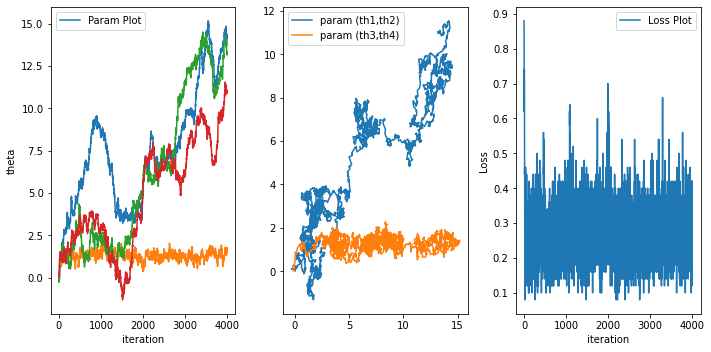

In [149]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()    

In [150]:
progress=[];

thdata=[];
theta=[0,0,0,0];
c1=0.05;   
delta=6;
nshot=1000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(4000):
    delta=random.random()+0.3
    theta=theta-SPSA(1,theta,c1,delta,nshot)
    print(ep,"th iteration L=",lossCal2qubit(1,theta,nshot))
    progress.append(lossCal2qubit(1,theta,nshot))
    thdata.append(theta)

0 th iteration L= 0.83
1 th iteration L= 0.858
2 th iteration L= 0.812
3 th iteration L= 0.746
4 th iteration L= 0.722
5 th iteration L= 0.6719999999999999
6 th iteration L= 0.644
7 th iteration L= 0.608
8 th iteration L= 0.532
9 th iteration L= 0.55
10 th iteration L= 0.5700000000000001
11 th iteration L= 0.488
12 th iteration L= 0.486
13 th iteration L= 0.42000000000000004
14 th iteration L= 0.43000000000000005
15 th iteration L= 0.392
16 th iteration L= 0.35
17 th iteration L= 0.33999999999999997
18 th iteration L= 0.33599999999999997
19 th iteration L= 0.32999999999999996
20 th iteration L= 0.30000000000000004
21 th iteration L= 0.29800000000000004
22 th iteration L= 0.258
23 th iteration L= 0.30200000000000005
24 th iteration L= 0.30000000000000004
25 th iteration L= 0.31999999999999995
26 th iteration L= 0.28800000000000003
27 th iteration L= 0.29800000000000004
28 th iteration L= 0.30400000000000005
29 th iteration L= 0.254
30 th iteration L= 0.264
31 th iteration L= 0.248
32 th

282 th iteration L= 0.266
283 th iteration L= 0.248
284 th iteration L= 0.258
285 th iteration L= 0.22199999999999998
286 th iteration L= 0.242
287 th iteration L= 0.244
288 th iteration L= 0.27
289 th iteration L= 0.236
290 th iteration L= 0.21999999999999997
291 th iteration L= 0.238
292 th iteration L= 0.29000000000000004
293 th iteration L= 0.29800000000000004
294 th iteration L= 0.252
295 th iteration L= 0.242
296 th iteration L= 0.23399999999999999
297 th iteration L= 0.248
298 th iteration L= 0.252
299 th iteration L= 0.252
300 th iteration L= 0.262
301 th iteration L= 0.22799999999999998
302 th iteration L= 0.25
303 th iteration L= 0.24
304 th iteration L= 0.266
305 th iteration L= 0.22399999999999998
306 th iteration L= 0.256
307 th iteration L= 0.278
308 th iteration L= 0.278
309 th iteration L= 0.246
310 th iteration L= 0.268
311 th iteration L= 0.254
312 th iteration L= 0.264
313 th iteration L= 0.20599999999999996
314 th iteration L= 0.266
315 th iteration L= 0.254
316 th 

558 th iteration L= 0.264
559 th iteration L= 0.236
560 th iteration L= 0.272
561 th iteration L= 0.278
562 th iteration L= 0.276
563 th iteration L= 0.31200000000000006
564 th iteration L= 0.252
565 th iteration L= 0.23399999999999999
566 th iteration L= 0.236
567 th iteration L= 0.28
568 th iteration L= 0.278
569 th iteration L= 0.256
570 th iteration L= 0.256
571 th iteration L= 0.272
572 th iteration L= 0.21599999999999997
573 th iteration L= 0.19999999999999996
574 th iteration L= 0.246
575 th iteration L= 0.24
576 th iteration L= 0.29200000000000004
577 th iteration L= 0.262
578 th iteration L= 0.272
579 th iteration L= 0.252
580 th iteration L= 0.254
581 th iteration L= 0.25
582 th iteration L= 0.21799999999999997
583 th iteration L= 0.258
584 th iteration L= 0.26
585 th iteration L= 0.21599999999999997
586 th iteration L= 0.22799999999999998
587 th iteration L= 0.24
588 th iteration L= 0.22799999999999998
589 th iteration L= 0.22399999999999998
590 th iteration L= 0.21199999999

831 th iteration L= 0.20199999999999996
832 th iteration L= 0.22999999999999998
833 th iteration L= 0.29000000000000004
834 th iteration L= 0.276
835 th iteration L= 0.24
836 th iteration L= 0.28
837 th iteration L= 0.244
838 th iteration L= 0.23199999999999998
839 th iteration L= 0.22799999999999998
840 th iteration L= 0.242
841 th iteration L= 0.29200000000000004
842 th iteration L= 0.28400000000000003
843 th iteration L= 0.244
844 th iteration L= 0.20999999999999996
845 th iteration L= 0.24
846 th iteration L= 0.29600000000000004
847 th iteration L= 0.22199999999999998
848 th iteration L= 0.20999999999999996
849 th iteration L= 0.27
850 th iteration L= 0.276
851 th iteration L= 0.268
852 th iteration L= 0.22199999999999998
853 th iteration L= 0.268
854 th iteration L= 0.246
855 th iteration L= 0.25
856 th iteration L= 0.248
857 th iteration L= 0.236
858 th iteration L= 0.22999999999999998
859 th iteration L= 0.252
860 th iteration L= 0.30400000000000005
861 th iteration L= 0.256
862

1098 th iteration L= 0.254
1099 th iteration L= 0.24
1100 th iteration L= 0.252
1101 th iteration L= 0.272
1102 th iteration L= 0.266
1103 th iteration L= 0.248
1104 th iteration L= 0.22399999999999998
1105 th iteration L= 0.23399999999999999
1106 th iteration L= 0.254
1107 th iteration L= 0.28200000000000003
1108 th iteration L= 0.252
1109 th iteration L= 0.254
1110 th iteration L= 0.22399999999999998
1111 th iteration L= 0.21799999999999997
1112 th iteration L= 0.272
1113 th iteration L= 0.252
1114 th iteration L= 0.20599999999999996
1115 th iteration L= 0.258
1116 th iteration L= 0.248
1117 th iteration L= 0.264
1118 th iteration L= 0.22199999999999998
1119 th iteration L= 0.21799999999999997
1120 th iteration L= 0.264
1121 th iteration L= 0.256
1122 th iteration L= 0.254
1123 th iteration L= 0.256
1124 th iteration L= 0.22199999999999998
1125 th iteration L= 0.24
1126 th iteration L= 0.244
1127 th iteration L= 0.21599999999999997
1128 th iteration L= 0.23199999999999998
1129 th ite

1360 th iteration L= 0.27
1361 th iteration L= 0.26
1362 th iteration L= 0.246
1363 th iteration L= 0.29200000000000004
1364 th iteration L= 0.266
1365 th iteration L= 0.266
1366 th iteration L= 0.26
1367 th iteration L= 0.21399999999999997
1368 th iteration L= 0.264
1369 th iteration L= 0.20599999999999996
1370 th iteration L= 0.28200000000000003
1371 th iteration L= 0.258
1372 th iteration L= 0.256
1373 th iteration L= 0.244
1374 th iteration L= 0.22599999999999998
1375 th iteration L= 0.23399999999999999
1376 th iteration L= 0.23399999999999999
1377 th iteration L= 0.258
1378 th iteration L= 0.262
1379 th iteration L= 0.268
1380 th iteration L= 0.248
1381 th iteration L= 0.266
1382 th iteration L= 0.20199999999999996
1383 th iteration L= 0.25
1384 th iteration L= 0.238
1385 th iteration L= 0.262
1386 th iteration L= 0.22999999999999998
1387 th iteration L= 0.266
1388 th iteration L= 0.236
1389 th iteration L= 0.276
1390 th iteration L= 0.268
1391 th iteration L= 0.254
1392 th iterat

1627 th iteration L= 0.242
1628 th iteration L= 0.266
1629 th iteration L= 0.248
1630 th iteration L= 0.278
1631 th iteration L= 0.268
1632 th iteration L= 0.21199999999999997
1633 th iteration L= 0.30000000000000004
1634 th iteration L= 0.21999999999999997
1635 th iteration L= 0.248
1636 th iteration L= 0.29200000000000004
1637 th iteration L= 0.258
1638 th iteration L= 0.272
1639 th iteration L= 0.21999999999999997
1640 th iteration L= 0.22999999999999998
1641 th iteration L= 0.22399999999999998
1642 th iteration L= 0.258
1643 th iteration L= 0.254
1644 th iteration L= 0.26
1645 th iteration L= 0.256
1646 th iteration L= 0.252
1647 th iteration L= 0.268
1648 th iteration L= 0.244
1649 th iteration L= 0.248
1650 th iteration L= 0.28600000000000003
1651 th iteration L= 0.23399999999999999
1652 th iteration L= 0.268
1653 th iteration L= 0.236
1654 th iteration L= 0.23199999999999998
1655 th iteration L= 0.246
1656 th iteration L= 0.262
1657 th iteration L= 0.21799999999999997
1658 th it

1886 th iteration L= 0.278
1887 th iteration L= 0.248
1888 th iteration L= 0.268
1889 th iteration L= 0.23399999999999999
1890 th iteration L= 0.30200000000000005
1891 th iteration L= 0.264
1892 th iteration L= 0.28
1893 th iteration L= 0.25
1894 th iteration L= 0.27
1895 th iteration L= 0.22799999999999998
1896 th iteration L= 0.256
1897 th iteration L= 0.21999999999999997
1898 th iteration L= 0.256
1899 th iteration L= 0.22999999999999998
1900 th iteration L= 0.252
1901 th iteration L= 0.256
1902 th iteration L= 0.21599999999999997
1903 th iteration L= 0.238
1904 th iteration L= 0.25
1905 th iteration L= 0.274
1906 th iteration L= 0.22199999999999998
1907 th iteration L= 0.278
1908 th iteration L= 0.256
1909 th iteration L= 0.24
1910 th iteration L= 0.25
1911 th iteration L= 0.22199999999999998
1912 th iteration L= 0.242
1913 th iteration L= 0.256
1914 th iteration L= 0.27
1915 th iteration L= 0.25
1916 th iteration L= 0.264
1917 th iteration L= 0.22999999999999998
1918 th iteration 

2154 th iteration L= 0.21799999999999997
2155 th iteration L= 0.28600000000000003
2156 th iteration L= 0.254
2157 th iteration L= 0.21599999999999997
2158 th iteration L= 0.238
2159 th iteration L= 0.24
2160 th iteration L= 0.22399999999999998
2161 th iteration L= 0.22199999999999998
2162 th iteration L= 0.246
2163 th iteration L= 0.19599999999999995
2164 th iteration L= 0.23199999999999998
2165 th iteration L= 0.25
2166 th iteration L= 0.242
2167 th iteration L= 0.254
2168 th iteration L= 0.238
2169 th iteration L= 0.28
2170 th iteration L= 0.258
2171 th iteration L= 0.248
2172 th iteration L= 0.21599999999999997
2173 th iteration L= 0.25
2174 th iteration L= 0.26
2175 th iteration L= 0.22799999999999998
2176 th iteration L= 0.23199999999999998
2177 th iteration L= 0.22999999999999998
2178 th iteration L= 0.254
2179 th iteration L= 0.254
2180 th iteration L= 0.26
2181 th iteration L= 0.22599999999999998
2182 th iteration L= 0.274
2183 th iteration L= 0.268
2184 th iteration L= 0.22199

2413 th iteration L= 0.28400000000000003
2414 th iteration L= 0.22599999999999998
2415 th iteration L= 0.238
2416 th iteration L= 0.22399999999999998
2417 th iteration L= 0.278
2418 th iteration L= 0.23399999999999999
2419 th iteration L= 0.22599999999999998
2420 th iteration L= 0.29000000000000004
2421 th iteration L= 0.242
2422 th iteration L= 0.25
2423 th iteration L= 0.276
2424 th iteration L= 0.27
2425 th iteration L= 0.252
2426 th iteration L= 0.248
2427 th iteration L= 0.252
2428 th iteration L= 0.236
2429 th iteration L= 0.244
2430 th iteration L= 0.264
2431 th iteration L= 0.256
2432 th iteration L= 0.20799999999999996
2433 th iteration L= 0.256
2434 th iteration L= 0.246
2435 th iteration L= 0.276
2436 th iteration L= 0.244
2437 th iteration L= 0.22599999999999998
2438 th iteration L= 0.24
2439 th iteration L= 0.28
2440 th iteration L= 0.248
2441 th iteration L= 0.248
2442 th iteration L= 0.28200000000000003
2443 th iteration L= 0.21599999999999997
2444 th iteration L= 0.2319

2681 th iteration L= 0.264
2682 th iteration L= 0.248
2683 th iteration L= 0.21799999999999997
2684 th iteration L= 0.264
2685 th iteration L= 0.262
2686 th iteration L= 0.266
2687 th iteration L= 0.266
2688 th iteration L= 0.274
2689 th iteration L= 0.236
2690 th iteration L= 0.262
2691 th iteration L= 0.272
2692 th iteration L= 0.238
2693 th iteration L= 0.266
2694 th iteration L= 0.21999999999999997
2695 th iteration L= 0.26
2696 th iteration L= 0.248
2697 th iteration L= 0.256
2698 th iteration L= 0.236
2699 th iteration L= 0.30000000000000004
2700 th iteration L= 0.23399999999999999
2701 th iteration L= 0.27
2702 th iteration L= 0.25
2703 th iteration L= 0.26
2704 th iteration L= 0.22799999999999998
2705 th iteration L= 0.242
2706 th iteration L= 0.268
2707 th iteration L= 0.254
2708 th iteration L= 0.236
2709 th iteration L= 0.28600000000000003
2710 th iteration L= 0.28800000000000003
2711 th iteration L= 0.26
2712 th iteration L= 0.242
2713 th iteration L= 0.242
2714 th iteratio

2947 th iteration L= 0.25
2948 th iteration L= 0.21599999999999997
2949 th iteration L= 0.26
2950 th iteration L= 0.29000000000000004
2951 th iteration L= 0.25
2952 th iteration L= 0.264
2953 th iteration L= 0.236
2954 th iteration L= 0.262
2955 th iteration L= 0.254
2956 th iteration L= 0.244
2957 th iteration L= 0.252
2958 th iteration L= 0.266
2959 th iteration L= 0.22999999999999998
2960 th iteration L= 0.272
2961 th iteration L= 0.21799999999999997
2962 th iteration L= 0.20999999999999996
2963 th iteration L= 0.252
2964 th iteration L= 0.248
2965 th iteration L= 0.24
2966 th iteration L= 0.26
2967 th iteration L= 0.22799999999999998
2968 th iteration L= 0.258
2969 th iteration L= 0.27
2970 th iteration L= 0.24
2971 th iteration L= 0.248
2972 th iteration L= 0.25
2973 th iteration L= 0.254
2974 th iteration L= 0.256
2975 th iteration L= 0.258
2976 th iteration L= 0.24
2977 th iteration L= 0.22799999999999998
2978 th iteration L= 0.256
2979 th iteration L= 0.262
2980 th iteration L=

3215 th iteration L= 0.24
3216 th iteration L= 0.21799999999999997
3217 th iteration L= 0.236
3218 th iteration L= 0.264
3219 th iteration L= 0.248
3220 th iteration L= 0.26
3221 th iteration L= 0.236
3222 th iteration L= 0.27
3223 th iteration L= 0.262
3224 th iteration L= 0.238
3225 th iteration L= 0.24
3226 th iteration L= 0.28
3227 th iteration L= 0.26
3228 th iteration L= 0.276
3229 th iteration L= 0.278
3230 th iteration L= 0.25
3231 th iteration L= 0.242
3232 th iteration L= 0.246
3233 th iteration L= 0.30000000000000004
3234 th iteration L= 0.262
3235 th iteration L= 0.272
3236 th iteration L= 0.25
3237 th iteration L= 0.262
3238 th iteration L= 0.258
3239 th iteration L= 0.254
3240 th iteration L= 0.266
3241 th iteration L= 0.19799999999999995
3242 th iteration L= 0.22999999999999998
3243 th iteration L= 0.25
3244 th iteration L= 0.21799999999999997
3245 th iteration L= 0.28200000000000003
3246 th iteration L= 0.236
3247 th iteration L= 0.252
3248 th iteration L= 0.25
3249 th 

3483 th iteration L= 0.21799999999999997
3484 th iteration L= 0.254
3485 th iteration L= 0.28200000000000003
3486 th iteration L= 0.21199999999999997
3487 th iteration L= 0.262
3488 th iteration L= 0.268
3489 th iteration L= 0.238
3490 th iteration L= 0.19999999999999996
3491 th iteration L= 0.26
3492 th iteration L= 0.246
3493 th iteration L= 0.29000000000000004
3494 th iteration L= 0.264
3495 th iteration L= 0.272
3496 th iteration L= 0.242
3497 th iteration L= 0.24
3498 th iteration L= 0.242
3499 th iteration L= 0.25
3500 th iteration L= 0.256
3501 th iteration L= 0.254
3502 th iteration L= 0.31799999999999995
3503 th iteration L= 0.29600000000000004
3504 th iteration L= 0.236
3505 th iteration L= 0.262
3506 th iteration L= 0.268
3507 th iteration L= 0.28200000000000003
3508 th iteration L= 0.23399999999999999
3509 th iteration L= 0.24
3510 th iteration L= 0.25
3511 th iteration L= 0.26
3512 th iteration L= 0.22399999999999998
3513 th iteration L= 0.244
3514 th iteration L= 0.24
351

3748 th iteration L= 0.274
3749 th iteration L= 0.21399999999999997
3750 th iteration L= 0.242
3751 th iteration L= 0.252
3752 th iteration L= 0.236
3753 th iteration L= 0.23399999999999999
3754 th iteration L= 0.25
3755 th iteration L= 0.268
3756 th iteration L= 0.22599999999999998
3757 th iteration L= 0.246
3758 th iteration L= 0.236
3759 th iteration L= 0.244
3760 th iteration L= 0.30400000000000005
3761 th iteration L= 0.24
3762 th iteration L= 0.30200000000000005
3763 th iteration L= 0.23399999999999999
3764 th iteration L= 0.264
3765 th iteration L= 0.236
3766 th iteration L= 0.21599999999999997
3767 th iteration L= 0.21599999999999997
3768 th iteration L= 0.29600000000000004
3769 th iteration L= 0.276
3770 th iteration L= 0.27
3771 th iteration L= 0.256
3772 th iteration L= 0.24
3773 th iteration L= 0.248
3774 th iteration L= 0.22399999999999998
3775 th iteration L= 0.272
3776 th iteration L= 0.266
3777 th iteration L= 0.26
3778 th iteration L= 0.276
3779 th iteration L= 0.22999

After 1000 iteration we have theta = [3.2337141  1.45204308 4.41097163 2.32219504]


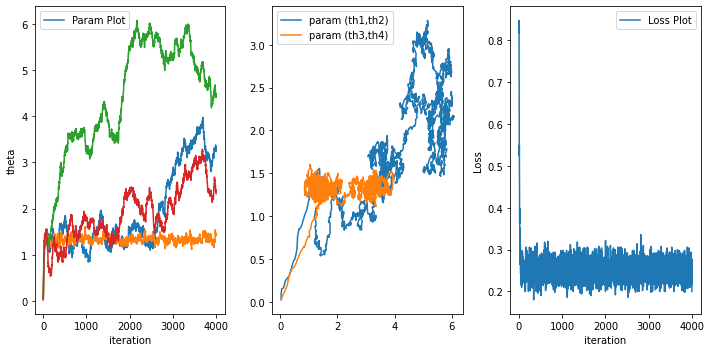

In [151]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()    

In [152]:
progress=[];

thdata=[];
theta=[0,0,0,0];
c1=0.05;   
delta=6;
nshot=10000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(4000):
    delta=random.random()+0.3
    theta=theta-SPSA(1,theta,c1,delta,nshot)
    print(ep,"th iteration L=",lossCal2qubit(1,theta,nshot))
    progress.append(lossCal2qubit(1,theta,nshot))
    thdata.append(theta)

0 th iteration L= 0.7842
1 th iteration L= 0.787
2 th iteration L= 0.7562
3 th iteration L= 0.7274
4 th iteration L= 0.679
5 th iteration L= 0.6232
6 th iteration L= 0.5836
7 th iteration L= 0.5292
8 th iteration L= 0.4828
9 th iteration L= 0.4918
10 th iteration L= 0.4586
11 th iteration L= 0.4346
12 th iteration L= 0.43779999999999997
13 th iteration L= 0.41479999999999995
14 th iteration L= 0.40980000000000005
15 th iteration L= 0.38060000000000005
16 th iteration L= 0.3668
17 th iteration L= 0.33919999999999995
18 th iteration L= 0.35419999999999996
19 th iteration L= 0.3456
20 th iteration L= 0.33620000000000005
21 th iteration L= 0.31499999999999995
22 th iteration L= 0.31200000000000006
23 th iteration L= 0.31179999999999997
24 th iteration L= 0.3086
25 th iteration L= 0.3106
26 th iteration L= 0.3002
27 th iteration L= 0.30779999999999996
28 th iteration L= 0.29100000000000004
29 th iteration L= 0.29200000000000004
30 th iteration L= 0.28059999999999996
31 th iteration L= 0.269

240 th iteration L= 0.253
241 th iteration L= 0.24439999999999995
242 th iteration L= 0.24919999999999998
243 th iteration L= 0.24839999999999995
244 th iteration L= 0.24919999999999998
245 th iteration L= 0.24319999999999997
246 th iteration L= 0.235
247 th iteration L= 0.2512
248 th iteration L= 0.24819999999999998
249 th iteration L= 0.2518
250 th iteration L= 0.25539999999999996
251 th iteration L= 0.24360000000000004
252 th iteration L= 0.2548
253 th iteration L= 0.24280000000000002
254 th iteration L= 0.25139999999999996
255 th iteration L= 0.24519999999999997
256 th iteration L= 0.25139999999999996
257 th iteration L= 0.246
258 th iteration L= 0.2522
259 th iteration L= 0.24580000000000002
260 th iteration L= 0.24580000000000002
261 th iteration L= 0.2528
262 th iteration L= 0.243
263 th iteration L= 0.24339999999999995
264 th iteration L= 0.2622
265 th iteration L= 0.25139999999999996
266 th iteration L= 0.24319999999999997
267 th iteration L= 0.25360000000000005
268 th iterati

472 th iteration L= 0.24939999999999996
473 th iteration L= 0.244
474 th iteration L= 0.2538
475 th iteration L= 0.24280000000000002
476 th iteration L= 0.24519999999999997
477 th iteration L= 0.246
478 th iteration L= 0.23460000000000003
479 th iteration L= 0.24239999999999995
480 th iteration L= 0.2602
481 th iteration L= 0.24480000000000002
482 th iteration L= 0.24680000000000002
483 th iteration L= 0.24460000000000004
484 th iteration L= 0.24019999999999997
485 th iteration L= 0.24619999999999997
486 th iteration L= 0.26080000000000003
487 th iteration L= 0.24080000000000001
488 th iteration L= 0.24339999999999995
489 th iteration L= 0.25039999999999996
490 th iteration L= 0.24039999999999995
491 th iteration L= 0.2518
492 th iteration L= 0.24480000000000002
493 th iteration L= 0.2388
494 th iteration L= 0.25360000000000005
495 th iteration L= 0.25439999999999996
496 th iteration L= 0.25239999999999996
497 th iteration L= 0.24639999999999995
498 th iteration L= 0.25260000000000005


704 th iteration L= 0.24919999999999998
705 th iteration L= 0.24719999999999998
706 th iteration L= 0.24380000000000002
707 th iteration L= 0.24160000000000004
708 th iteration L= 0.254
709 th iteration L= 0.2508
710 th iteration L= 0.24160000000000004
711 th iteration L= 0.25560000000000005
712 th iteration L= 0.23919999999999997
713 th iteration L= 0.24039999999999995
714 th iteration L= 0.24639999999999995
715 th iteration L= 0.24260000000000004
716 th iteration L= 0.2512
717 th iteration L= 0.2378
718 th iteration L= 0.246
719 th iteration L= 0.24860000000000004
720 th iteration L= 0.24719999999999998
721 th iteration L= 0.24319999999999997
722 th iteration L= 0.24660000000000004
723 th iteration L= 0.24539999999999995
724 th iteration L= 0.2518
725 th iteration L= 0.2518
726 th iteration L= 0.24319999999999997
727 th iteration L= 0.2632
728 th iteration L= 0.24739999999999995
729 th iteration L= 0.24680000000000002
730 th iteration L= 0.25339999999999996
731 th iteration L= 0.2536

934 th iteration L= 0.25360000000000005
935 th iteration L= 0.2518
936 th iteration L= 0.23240000000000005
937 th iteration L= 0.24160000000000004
938 th iteration L= 0.2532
939 th iteration L= 0.2532
940 th iteration L= 0.24439999999999995
941 th iteration L= 0.254
942 th iteration L= 0.2512
943 th iteration L= 0.24
944 th iteration L= 0.24680000000000002
945 th iteration L= 0.24539999999999995
946 th iteration L= 0.23960000000000004
947 th iteration L= 0.242
948 th iteration L= 0.25780000000000003
949 th iteration L= 0.24619999999999997
950 th iteration L= 0.23440000000000005
951 th iteration L= 0.24719999999999998
952 th iteration L= 0.26060000000000005
953 th iteration L= 0.24639999999999995
954 th iteration L= 0.237
955 th iteration L= 0.248
956 th iteration L= 0.24680000000000002
957 th iteration L= 0.24639999999999995
958 th iteration L= 0.2522
959 th iteration L= 0.24860000000000004
960 th iteration L= 0.24639999999999995
961 th iteration L= 0.24619999999999997
962 th iteration

1157 th iteration L= 0.24760000000000004
1158 th iteration L= 0.251
1159 th iteration L= 0.26039999999999996
1160 th iteration L= 0.23860000000000003
1161 th iteration L= 0.24819999999999998
1162 th iteration L= 0.23939999999999995
1163 th iteration L= 0.244
1164 th iteration L= 0.2512
1165 th iteration L= 0.235
1166 th iteration L= 0.2512
1167 th iteration L= 0.24819999999999998
1168 th iteration L= 0.24160000000000004
1169 th iteration L= 0.25139999999999996
1170 th iteration L= 0.24980000000000002
1171 th iteration L= 0.24439999999999995
1172 th iteration L= 0.264
1173 th iteration L= 0.247
1174 th iteration L= 0.25460000000000005
1175 th iteration L= 0.24419999999999997
1176 th iteration L= 0.24960000000000004
1177 th iteration L= 0.25539999999999996
1178 th iteration L= 0.25060000000000004
1179 th iteration L= 0.25
1180 th iteration L= 0.2632
1181 th iteration L= 0.25460000000000005
1182 th iteration L= 0.25560000000000005
1183 th iteration L= 0.24360000000000004
1184 th iteration

1385 th iteration L= 0.24819999999999998
1386 th iteration L= 0.24619999999999997
1387 th iteration L= 0.24580000000000002
1388 th iteration L= 0.255
1389 th iteration L= 0.256
1390 th iteration L= 0.255
1391 th iteration L= 0.25339999999999996
1392 th iteration L= 0.26439999999999997
1393 th iteration L= 0.2528
1394 th iteration L= 0.24260000000000004
1395 th iteration L= 0.24919999999999998
1396 th iteration L= 0.254
1397 th iteration L= 0.2502
1398 th iteration L= 0.2542
1399 th iteration L= 0.2702
1400 th iteration L= 0.256
1401 th iteration L= 0.2532
1402 th iteration L= 0.25
1403 th iteration L= 0.24180000000000001
1404 th iteration L= 0.24580000000000002
1405 th iteration L= 0.24019999999999997
1406 th iteration L= 0.24060000000000004
1407 th iteration L= 0.24
1408 th iteration L= 0.2518
1409 th iteration L= 0.24939999999999996
1410 th iteration L= 0.24560000000000004
1411 th iteration L= 0.2548
1412 th iteration L= 0.24560000000000004
1413 th iteration L= 0.23560000000000003
14

1618 th iteration L= 0.2358
1619 th iteration L= 0.249
1620 th iteration L= 0.2558
1621 th iteration L= 0.24939999999999996
1622 th iteration L= 0.254
1623 th iteration L= 0.24960000000000004
1624 th iteration L= 0.256
1625 th iteration L= 0.2378
1626 th iteration L= 0.26659999999999995
1627 th iteration L= 0.2508
1628 th iteration L= 0.24339999999999995
1629 th iteration L= 0.24539999999999995
1630 th iteration L= 0.24760000000000004
1631 th iteration L= 0.2512
1632 th iteration L= 0.24760000000000004
1633 th iteration L= 0.251
1634 th iteration L= 0.25739999999999996
1635 th iteration L= 0.25360000000000005
1636 th iteration L= 0.25260000000000005
1637 th iteration L= 0.25039999999999996
1638 th iteration L= 0.261
1639 th iteration L= 0.24339999999999995
1640 th iteration L= 0.25460000000000005
1641 th iteration L= 0.24139999999999995
1642 th iteration L= 0.24519999999999997
1643 th iteration L= 0.24480000000000002
1644 th iteration L= 0.24439999999999995
1645 th iteration L= 0.24960

1849 th iteration L= 0.2522
1850 th iteration L= 0.251
1851 th iteration L= 0.24639999999999995
1852 th iteration L= 0.24880000000000002
1853 th iteration L= 0.24780000000000002
1854 th iteration L= 0.247
1855 th iteration L= 0.24719999999999998
1856 th iteration L= 0.24419999999999997
1857 th iteration L= 0.25160000000000005
1858 th iteration L= 0.24160000000000004
1859 th iteration L= 0.2538
1860 th iteration L= 0.254
1861 th iteration L= 0.25239999999999996
1862 th iteration L= 0.255
1863 th iteration L= 0.243
1864 th iteration L= 0.247
1865 th iteration L= 0.242
1866 th iteration L= 0.23560000000000003
1867 th iteration L= 0.243
1868 th iteration L= 0.2512
1869 th iteration L= 0.24639999999999995
1870 th iteration L= 0.24439999999999995
1871 th iteration L= 0.2562
1872 th iteration L= 0.263
1873 th iteration L= 0.254
1874 th iteration L= 0.24480000000000002
1875 th iteration L= 0.25339999999999996
1876 th iteration L= 0.2532
1877 th iteration L= 0.255
1878 th iteration L= 0.2483999

2081 th iteration L= 0.24519999999999997
2082 th iteration L= 0.25160000000000005
2083 th iteration L= 0.25739999999999996
2084 th iteration L= 0.247
2085 th iteration L= 0.24560000000000004
2086 th iteration L= 0.25680000000000003
2087 th iteration L= 0.2532
2088 th iteration L= 0.24719999999999998
2089 th iteration L= 0.24719999999999998
2090 th iteration L= 0.24739999999999995
2091 th iteration L= 0.25339999999999996
2092 th iteration L= 0.24919999999999998
2093 th iteration L= 0.24
2094 th iteration L= 0.24539999999999995
2095 th iteration L= 0.24139999999999995
2096 th iteration L= 0.24619999999999997
2097 th iteration L= 0.24839999999999995
2098 th iteration L= 0.24080000000000001
2099 th iteration L= 0.24539999999999995
2100 th iteration L= 0.24239999999999995
2101 th iteration L= 0.2348
2102 th iteration L= 0.26139999999999997
2103 th iteration L= 0.25560000000000005
2104 th iteration L= 0.248
2105 th iteration L= 0.24139999999999995
2106 th iteration L= 0.24180000000000001
210

2308 th iteration L= 0.24660000000000004
2309 th iteration L= 0.23560000000000003
2310 th iteration L= 0.25039999999999996
2311 th iteration L= 0.24719999999999998
2312 th iteration L= 0.24860000000000004
2313 th iteration L= 0.24839999999999995
2314 th iteration L= 0.25039999999999996
2315 th iteration L= 0.2512
2316 th iteration L= 0.24960000000000004
2317 th iteration L= 0.243
2318 th iteration L= 0.2368
2319 th iteration L= 0.24919999999999998
2320 th iteration L= 0.2512
2321 th iteration L= 0.251
2322 th iteration L= 0.256
2323 th iteration L= 0.25139999999999996
2324 th iteration L= 0.24039999999999995
2325 th iteration L= 0.2502
2326 th iteration L= 0.251
2327 th iteration L= 0.257
2328 th iteration L= 0.24639999999999995
2329 th iteration L= 0.25880000000000003
2330 th iteration L= 0.24939999999999996
2331 th iteration L= 0.256
2332 th iteration L= 0.244
2333 th iteration L= 0.258
2334 th iteration L= 0.25160000000000005
2335 th iteration L= 0.2502
2336 th iteration L= 0.244399

2538 th iteration L= 0.24219999999999997
2539 th iteration L= 0.25160000000000005
2540 th iteration L= 0.2558
2541 th iteration L= 0.24060000000000004
2542 th iteration L= 0.26139999999999997
2543 th iteration L= 0.252
2544 th iteration L= 0.25
2545 th iteration L= 0.24539999999999995
2546 th iteration L= 0.25439999999999996
2547 th iteration L= 0.24919999999999998
2548 th iteration L= 0.23919999999999997
2549 th iteration L= 0.252
2550 th iteration L= 0.24760000000000004
2551 th iteration L= 0.247
2552 th iteration L= 0.24780000000000002
2553 th iteration L= 0.26739999999999997
2554 th iteration L= 0.239
2555 th iteration L= 0.25139999999999996
2556 th iteration L= 0.24439999999999995
2557 th iteration L= 0.24160000000000004
2558 th iteration L= 0.25680000000000003
2559 th iteration L= 0.2512
2560 th iteration L= 0.24460000000000004
2561 th iteration L= 0.24739999999999995
2562 th iteration L= 0.2552
2563 th iteration L= 0.25039999999999996
2564 th iteration L= 0.24819999999999998
256

2766 th iteration L= 0.24339999999999995
2767 th iteration L= 0.253
2768 th iteration L= 0.24819999999999998
2769 th iteration L= 0.23619999999999997
2770 th iteration L= 0.25039999999999996
2771 th iteration L= 0.252
2772 th iteration L= 0.24960000000000004
2773 th iteration L= 0.24919999999999998
2774 th iteration L= 0.2518
2775 th iteration L= 0.24760000000000004
2776 th iteration L= 0.25339999999999996
2777 th iteration L= 0.25060000000000004
2778 th iteration L= 0.24460000000000004
2779 th iteration L= 0.24419999999999997
2780 th iteration L= 0.25160000000000005
2781 th iteration L= 0.2542
2782 th iteration L= 0.254
2783 th iteration L= 0.24139999999999995
2784 th iteration L= 0.24719999999999998
2785 th iteration L= 0.25880000000000003
2786 th iteration L= 0.2388
2787 th iteration L= 0.25980000000000003
2788 th iteration L= 0.24819999999999998
2789 th iteration L= 0.2642
2790 th iteration L= 0.2508
2791 th iteration L= 0.24180000000000001
2792 th iteration L= 0.24460000000000004


2996 th iteration L= 0.24060000000000004
2997 th iteration L= 0.25339999999999996
2998 th iteration L= 0.24660000000000004
2999 th iteration L= 0.25160000000000005
3000 th iteration L= 0.246
3001 th iteration L= 0.244
3002 th iteration L= 0.24319999999999997
3003 th iteration L= 0.25839999999999996
3004 th iteration L= 0.241
3005 th iteration L= 0.24339999999999995
3006 th iteration L= 0.24760000000000004
3007 th iteration L= 0.24819999999999998
3008 th iteration L= 0.24539999999999995
3009 th iteration L= 0.247
3010 th iteration L= 0.25060000000000004
3011 th iteration L= 0.244
3012 th iteration L= 0.25760000000000005
3013 th iteration L= 0.24760000000000004
3014 th iteration L= 0.24980000000000002
3015 th iteration L= 0.2512
3016 th iteration L= 0.25
3017 th iteration L= 0.24239999999999995
3018 th iteration L= 0.23960000000000004
3019 th iteration L= 0.246
3020 th iteration L= 0.2512
3021 th iteration L= 0.24560000000000004
3022 th iteration L= 0.235
3023 th iteration L= 0.250600000

3219 th iteration L= 0.252
3220 th iteration L= 0.24260000000000004
3221 th iteration L= 0.24880000000000002
3222 th iteration L= 0.2522
3223 th iteration L= 0.2518
3224 th iteration L= 0.242
3225 th iteration L= 0.24480000000000002
3226 th iteration L= 0.251
3227 th iteration L= 0.24980000000000002
3228 th iteration L= 0.2582
3229 th iteration L= 0.24019999999999997
3230 th iteration L= 0.24960000000000004
3231 th iteration L= 0.2358
3232 th iteration L= 0.2538
3233 th iteration L= 0.25539999999999996
3234 th iteration L= 0.25039999999999996
3235 th iteration L= 0.24980000000000002
3236 th iteration L= 0.24939999999999996
3237 th iteration L= 0.24919999999999998
3238 th iteration L= 0.259
3239 th iteration L= 0.26239999999999997
3240 th iteration L= 0.25539999999999996
3241 th iteration L= 0.25660000000000005
3242 th iteration L= 0.24619999999999997
3243 th iteration L= 0.251
3244 th iteration L= 0.2502
3245 th iteration L= 0.24580000000000002
3246 th iteration L= 0.2558
3247 th itera

3449 th iteration L= 0.252
3450 th iteration L= 0.25039999999999996
3451 th iteration L= 0.25860000000000005
3452 th iteration L= 0.24280000000000002
3453 th iteration L= 0.26259999999999994
3454 th iteration L= 0.24160000000000004
3455 th iteration L= 0.2522
3456 th iteration L= 0.24660000000000004
3457 th iteration L= 0.23719999999999997
3458 th iteration L= 0.23760000000000003
3459 th iteration L= 0.24380000000000002
3460 th iteration L= 0.24439999999999995
3461 th iteration L= 0.23719999999999997
3462 th iteration L= 0.2502
3463 th iteration L= 0.25439999999999996
3464 th iteration L= 0.23919999999999997
3465 th iteration L= 0.26139999999999997
3466 th iteration L= 0.23819999999999997
3467 th iteration L= 0.25439999999999996
3468 th iteration L= 0.24480000000000002
3469 th iteration L= 0.2502
3470 th iteration L= 0.24960000000000004
3471 th iteration L= 0.25639999999999996
3472 th iteration L= 0.24119999999999997
3473 th iteration L= 0.264
3474 th iteration L= 0.249
3475 th iterati

3681 th iteration L= 0.25680000000000003
3682 th iteration L= 0.24619999999999997
3683 th iteration L= 0.2548
3684 th iteration L= 0.25260000000000005
3685 th iteration L= 0.2558
3686 th iteration L= 0.24980000000000002
3687 th iteration L= 0.24680000000000002
3688 th iteration L= 0.25739999999999996
3689 th iteration L= 0.25060000000000004
3690 th iteration L= 0.24439999999999995
3691 th iteration L= 0.25560000000000005
3692 th iteration L= 0.256
3693 th iteration L= 0.2612
3694 th iteration L= 0.24839999999999995
3695 th iteration L= 0.2512
3696 th iteration L= 0.26039999999999996
3697 th iteration L= 0.23860000000000003
3698 th iteration L= 0.2528
3699 th iteration L= 0.25839999999999996
3700 th iteration L= 0.24880000000000002
3701 th iteration L= 0.241
3702 th iteration L= 0.24380000000000002
3703 th iteration L= 0.25980000000000003
3704 th iteration L= 0.2582
3705 th iteration L= 0.256
3706 th iteration L= 0.24219999999999997
3707 th iteration L= 0.2672
3708 th iteration L= 0.25


3909 th iteration L= 0.25060000000000004
3910 th iteration L= 0.24580000000000002
3911 th iteration L= 0.24219999999999997
3912 th iteration L= 0.24739999999999995
3913 th iteration L= 0.2562
3914 th iteration L= 0.248
3915 th iteration L= 0.23839999999999995
3916 th iteration L= 0.24980000000000002
3917 th iteration L= 0.24919999999999998
3918 th iteration L= 0.23819999999999997
3919 th iteration L= 0.25439999999999996
3920 th iteration L= 0.26139999999999997
3921 th iteration L= 0.24780000000000002
3922 th iteration L= 0.25539999999999996
3923 th iteration L= 0.24860000000000004
3924 th iteration L= 0.244
3925 th iteration L= 0.2508
3926 th iteration L= 0.2572
3927 th iteration L= 0.24539999999999995
3928 th iteration L= 0.25260000000000005
3929 th iteration L= 0.24619999999999997
3930 th iteration L= 0.25439999999999996
3931 th iteration L= 0.24180000000000001
3932 th iteration L= 0.25139999999999996
3933 th iteration L= 0.24
3934 th iteration L= 0.241
3935 th iteration L= 0.2366000

After 1000 iteration we have theta = [2.55509446 1.32001425 1.78747532 2.89177541]


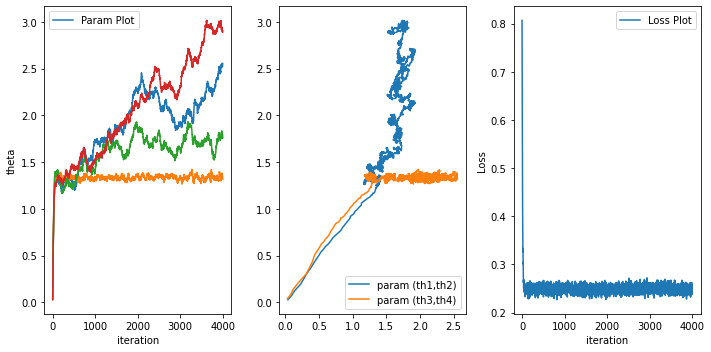

In [153]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()    

## Two Qubit single data point

### c1=0.01(small movement) delta=0.3+ (small fluctuation)

In [154]:
progress=[];

thdata=[];
theta=[0,0,0,0];
c1=0.01   
delta=6
nshot=3000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(4000):
    delta=random.random()+0.3
    theta=theta-SPSA(1,theta,c1,delta,nshot)
    print(ep,"th iteration L=",lossCal2qubit(1,theta,nshot))
    progress.append(lossCal2qubit(1,theta,nshot))
    thdata.append(theta)

0 th iteration L= 0.8506666666666667
1 th iteration L= 0.798
2 th iteration L= 0.78
3 th iteration L= 0.79
4 th iteration L= 0.7846666666666666
5 th iteration L= 0.7366666666666667
6 th iteration L= 0.7373333333333334
7 th iteration L= 0.7166666666666667
8 th iteration L= 0.742
9 th iteration L= 0.75
10 th iteration L= 0.734
11 th iteration L= 0.6973333333333334
12 th iteration L= 0.722
13 th iteration L= 0.7506666666666667
14 th iteration L= 0.6926666666666667
15 th iteration L= 0.6733333333333333
16 th iteration L= 0.6786666666666666
17 th iteration L= 0.6646666666666667
18 th iteration L= 0.6593333333333333
19 th iteration L= 0.5853333333333333
20 th iteration L= 0.5386666666666666
21 th iteration L= 0.5760000000000001
22 th iteration L= 0.5353333333333333
23 th iteration L= 0.5386666666666666
24 th iteration L= 0.552
25 th iteration L= 0.554
26 th iteration L= 0.5446666666666666
27 th iteration L= 0.5293333333333333
28 th iteration L= 0.5106666666666666
29 th iteration L= 0.5153333

221 th iteration L= 0.28933333333333333
222 th iteration L= 0.30600000000000005
223 th iteration L= 0.28600000000000003
224 th iteration L= 0.28800000000000003
225 th iteration L= 0.2826666666666666
226 th iteration L= 0.29400000000000004
227 th iteration L= 0.2626666666666667
228 th iteration L= 0.28
229 th iteration L= 0.28933333333333333
230 th iteration L= 0.2786666666666666
231 th iteration L= 0.29600000000000004
232 th iteration L= 0.29733333333333334
233 th iteration L= 0.278
234 th iteration L= 0.29400000000000004
235 th iteration L= 0.2833333333333333
236 th iteration L= 0.29600000000000004
237 th iteration L= 0.2773333333333333
238 th iteration L= 0.272
239 th iteration L= 0.30000000000000004
240 th iteration L= 0.268
241 th iteration L= 0.28200000000000003
242 th iteration L= 0.29000000000000004
243 th iteration L= 0.29266666666666663
244 th iteration L= 0.2813333333333333
245 th iteration L= 0.2706666666666667
246 th iteration L= 0.2886666666666666
247 th iteration L= 0.292

450 th iteration L= 0.2593333333333333
451 th iteration L= 0.23333333333333328
452 th iteration L= 0.258
453 th iteration L= 0.2506666666666667
454 th iteration L= 0.2393333333333333
455 th iteration L= 0.242
456 th iteration L= 0.2586666666666667
457 th iteration L= 0.2653333333333333
458 th iteration L= 0.2513333333333333
459 th iteration L= 0.256
460 th iteration L= 0.244
461 th iteration L= 0.2693333333333333
462 th iteration L= 0.23533333333333328
463 th iteration L= 0.2486666666666667
464 th iteration L= 0.2553333333333333
465 th iteration L= 0.2526666666666667
466 th iteration L= 0.2653333333333333
467 th iteration L= 0.2346666666666667
468 th iteration L= 0.2513333333333333
469 th iteration L= 0.244
470 th iteration L= 0.2473333333333333
471 th iteration L= 0.252
472 th iteration L= 0.2453333333333333
473 th iteration L= 0.2653333333333333
474 th iteration L= 0.2433333333333333
475 th iteration L= 0.2446666666666667
476 th iteration L= 0.242
477 th iteration L= 0.24333333333333

680 th iteration L= 0.248
681 th iteration L= 0.256
682 th iteration L= 0.2366666666666667
683 th iteration L= 0.2466666666666667
684 th iteration L= 0.26
685 th iteration L= 0.24
686 th iteration L= 0.2673333333333333
687 th iteration L= 0.256
688 th iteration L= 0.2386666666666667
689 th iteration L= 0.258
690 th iteration L= 0.24
691 th iteration L= 0.2413333333333333
692 th iteration L= 0.2613333333333333
693 th iteration L= 0.2426666666666667
694 th iteration L= 0.266
695 th iteration L= 0.2513333333333333
696 th iteration L= 0.2713333333333333
697 th iteration L= 0.2546666666666667
698 th iteration L= 0.258
699 th iteration L= 0.25
700 th iteration L= 0.2386666666666667
701 th iteration L= 0.2493333333333333
702 th iteration L= 0.2466666666666667
703 th iteration L= 0.2573333333333333
704 th iteration L= 0.2573333333333333
705 th iteration L= 0.2726666666666666
706 th iteration L= 0.252
707 th iteration L= 0.2486666666666667
708 th iteration L= 0.252
709 th iteration L= 0.2466666

916 th iteration L= 0.2693333333333333
917 th iteration L= 0.2646666666666667
918 th iteration L= 0.2493333333333333
919 th iteration L= 0.2473333333333333
920 th iteration L= 0.2426666666666667
921 th iteration L= 0.2553333333333333
922 th iteration L= 0.2506666666666667
923 th iteration L= 0.23733333333333329
924 th iteration L= 0.2453333333333333
925 th iteration L= 0.2326666666666667
926 th iteration L= 0.24
927 th iteration L= 0.2526666666666667
928 th iteration L= 0.2406666666666667
929 th iteration L= 0.246
930 th iteration L= 0.21599999999999997
931 th iteration L= 0.2673333333333333
932 th iteration L= 0.2413333333333333
933 th iteration L= 0.25
934 th iteration L= 0.2586666666666667
935 th iteration L= 0.2386666666666667
936 th iteration L= 0.252
937 th iteration L= 0.2613333333333333
938 th iteration L= 0.2553333333333333
939 th iteration L= 0.2626666666666667
940 th iteration L= 0.264
941 th iteration L= 0.246
942 th iteration L= 0.2633333333333333
943 th iteration L= 0.251

1150 th iteration L= 0.2406666666666667
1151 th iteration L= 0.2426666666666667
1152 th iteration L= 0.2553333333333333
1153 th iteration L= 0.2393333333333333
1154 th iteration L= 0.2553333333333333
1155 th iteration L= 0.23133333333333328
1156 th iteration L= 0.23133333333333328
1157 th iteration L= 0.2593333333333333
1158 th iteration L= 0.2566666666666667
1159 th iteration L= 0.2606666666666667
1160 th iteration L= 0.272
1161 th iteration L= 0.2526666666666667
1162 th iteration L= 0.2346666666666667
1163 th iteration L= 0.2453333333333333
1164 th iteration L= 0.2506666666666667
1165 th iteration L= 0.252
1166 th iteration L= 0.2726666666666666
1167 th iteration L= 0.256
1168 th iteration L= 0.2546666666666667
1169 th iteration L= 0.246
1170 th iteration L= 0.2646666666666667
1171 th iteration L= 0.254
1172 th iteration L= 0.2666666666666667
1173 th iteration L= 0.244
1174 th iteration L= 0.2533333333333333
1175 th iteration L= 0.2653333333333333
1176 th iteration L= 0.242
1177 th i

1379 th iteration L= 0.2573333333333333
1380 th iteration L= 0.2653333333333333
1381 th iteration L= 0.2566666666666667
1382 th iteration L= 0.2653333333333333
1383 th iteration L= 0.2506666666666667
1384 th iteration L= 0.2753333333333333
1385 th iteration L= 0.2493333333333333
1386 th iteration L= 0.2826666666666666
1387 th iteration L= 0.2573333333333333
1388 th iteration L= 0.2486666666666667
1389 th iteration L= 0.2533333333333333
1390 th iteration L= 0.2653333333333333
1391 th iteration L= 0.2653333333333333
1392 th iteration L= 0.26
1393 th iteration L= 0.2633333333333333
1394 th iteration L= 0.252
1395 th iteration L= 0.2633333333333333
1396 th iteration L= 0.22399999999999998
1397 th iteration L= 0.2506666666666667
1398 th iteration L= 0.2493333333333333
1399 th iteration L= 0.2513333333333333
1400 th iteration L= 0.2513333333333333
1401 th iteration L= 0.246
1402 th iteration L= 0.23399999999999999
1403 th iteration L= 0.2666666666666667
1404 th iteration L= 0.239333333333333

1607 th iteration L= 0.2513333333333333
1608 th iteration L= 0.2526666666666667
1609 th iteration L= 0.2533333333333333
1610 th iteration L= 0.2486666666666667
1611 th iteration L= 0.2693333333333333
1612 th iteration L= 0.2473333333333333
1613 th iteration L= 0.2766666666666666
1614 th iteration L= 0.2493333333333333
1615 th iteration L= 0.24
1616 th iteration L= 0.2586666666666667
1617 th iteration L= 0.2446666666666667
1618 th iteration L= 0.246
1619 th iteration L= 0.2533333333333333
1620 th iteration L= 0.264
1621 th iteration L= 0.244
1622 th iteration L= 0.256
1623 th iteration L= 0.2613333333333333
1624 th iteration L= 0.2766666666666666
1625 th iteration L= 0.268
1626 th iteration L= 0.238
1627 th iteration L= 0.23333333333333328
1628 th iteration L= 0.22666666666666668
1629 th iteration L= 0.248
1630 th iteration L= 0.2566666666666667
1631 th iteration L= 0.2733333333333333
1632 th iteration L= 0.2786666666666666
1633 th iteration L= 0.23399999999999999
1634 th iteration L= 0

1840 th iteration L= 0.2413333333333333
1841 th iteration L= 0.2566666666666667
1842 th iteration L= 0.2493333333333333
1843 th iteration L= 0.26
1844 th iteration L= 0.2626666666666667
1845 th iteration L= 0.2393333333333333
1846 th iteration L= 0.2453333333333333
1847 th iteration L= 0.2393333333333333
1848 th iteration L= 0.264
1849 th iteration L= 0.2513333333333333
1850 th iteration L= 0.2553333333333333
1851 th iteration L= 0.2493333333333333
1852 th iteration L= 0.254
1853 th iteration L= 0.25
1854 th iteration L= 0.2433333333333333
1855 th iteration L= 0.2393333333333333
1856 th iteration L= 0.23533333333333328
1857 th iteration L= 0.23333333333333328
1858 th iteration L= 0.2533333333333333
1859 th iteration L= 0.2646666666666667
1860 th iteration L= 0.2593333333333333
1861 th iteration L= 0.2386666666666667
1862 th iteration L= 0.2493333333333333
1863 th iteration L= 0.2453333333333333
1864 th iteration L= 0.2446666666666667
1865 th iteration L= 0.258
1866 th iteration L= 0.24

2062 th iteration L= 0.248
2063 th iteration L= 0.2473333333333333
2064 th iteration L= 0.21999999999999997
2065 th iteration L= 0.2326666666666667
2066 th iteration L= 0.262
2067 th iteration L= 0.256
2068 th iteration L= 0.2513333333333333
2069 th iteration L= 0.246
2070 th iteration L= 0.2486666666666667
2071 th iteration L= 0.248
2072 th iteration L= 0.2446666666666667
2073 th iteration L= 0.244
2074 th iteration L= 0.274
2075 th iteration L= 0.236
2076 th iteration L= 0.266
2077 th iteration L= 0.2773333333333333
2078 th iteration L= 0.2406666666666667
2079 th iteration L= 0.2506666666666667
2080 th iteration L= 0.2513333333333333
2081 th iteration L= 0.2586666666666667
2082 th iteration L= 0.244
2083 th iteration L= 0.2726666666666666
2084 th iteration L= 0.2526666666666667
2085 th iteration L= 0.2533333333333333
2086 th iteration L= 0.2513333333333333
2087 th iteration L= 0.2533333333333333
2088 th iteration L= 0.22933333333333328
2089 th iteration L= 0.2646666666666667
2090 th 

2291 th iteration L= 0.2426666666666667
2292 th iteration L= 0.278
2293 th iteration L= 0.244
2294 th iteration L= 0.246
2295 th iteration L= 0.2573333333333333
2296 th iteration L= 0.2533333333333333
2297 th iteration L= 0.268
2298 th iteration L= 0.2746666666666666
2299 th iteration L= 0.2393333333333333
2300 th iteration L= 0.2606666666666667
2301 th iteration L= 0.274
2302 th iteration L= 0.25
2303 th iteration L= 0.2746666666666666
2304 th iteration L= 0.24
2305 th iteration L= 0.2606666666666667
2306 th iteration L= 0.2593333333333333
2307 th iteration L= 0.2566666666666667
2308 th iteration L= 0.2633333333333333
2309 th iteration L= 0.2593333333333333
2310 th iteration L= 0.2586666666666667
2311 th iteration L= 0.2546666666666667
2312 th iteration L= 0.242
2313 th iteration L= 0.2453333333333333
2314 th iteration L= 0.2393333333333333
2315 th iteration L= 0.2366666666666667
2316 th iteration L= 0.2433333333333333
2317 th iteration L= 0.2433333333333333
2318 th iteration L= 0.235

2520 th iteration L= 0.268
2521 th iteration L= 0.2666666666666667
2522 th iteration L= 0.268
2523 th iteration L= 0.2686666666666667
2524 th iteration L= 0.274
2525 th iteration L= 0.2573333333333333
2526 th iteration L= 0.2566666666666667
2527 th iteration L= 0.2686666666666667
2528 th iteration L= 0.23333333333333328
2529 th iteration L= 0.25
2530 th iteration L= 0.2693333333333333
2531 th iteration L= 0.2566666666666667
2532 th iteration L= 0.2526666666666667
2533 th iteration L= 0.2733333333333333
2534 th iteration L= 0.2466666666666667
2535 th iteration L= 0.2526666666666667
2536 th iteration L= 0.2606666666666667
2537 th iteration L= 0.2453333333333333
2538 th iteration L= 0.2533333333333333
2539 th iteration L= 0.2493333333333333
2540 th iteration L= 0.23399999999999999
2541 th iteration L= 0.2433333333333333
2542 th iteration L= 0.2633333333333333
2543 th iteration L= 0.2493333333333333
2544 th iteration L= 0.2413333333333333
2545 th iteration L= 0.254
2546 th iteration L= 0.2

2750 th iteration L= 0.23333333333333328
2751 th iteration L= 0.2533333333333333
2752 th iteration L= 0.2406666666666667
2753 th iteration L= 0.244
2754 th iteration L= 0.2553333333333333
2755 th iteration L= 0.2386666666666667
2756 th iteration L= 0.2433333333333333
2757 th iteration L= 0.21933333333333338
2758 th iteration L= 0.2633333333333333
2759 th iteration L= 0.2473333333333333
2760 th iteration L= 0.2646666666666667
2761 th iteration L= 0.2473333333333333
2762 th iteration L= 0.25
2763 th iteration L= 0.2473333333333333
2764 th iteration L= 0.264
2765 th iteration L= 0.2346666666666667
2766 th iteration L= 0.266
2767 th iteration L= 0.2446666666666667
2768 th iteration L= 0.2453333333333333
2769 th iteration L= 0.2413333333333333
2770 th iteration L= 0.2453333333333333
2771 th iteration L= 0.2493333333333333
2772 th iteration L= 0.2686666666666667
2773 th iteration L= 0.256
2774 th iteration L= 0.248
2775 th iteration L= 0.2693333333333333
2776 th iteration L= 0.264
2777 th it

2978 th iteration L= 0.22799999999999998
2979 th iteration L= 0.23133333333333328
2980 th iteration L= 0.2466666666666667
2981 th iteration L= 0.268
2982 th iteration L= 0.2526666666666667
2983 th iteration L= 0.254
2984 th iteration L= 0.2453333333333333
2985 th iteration L= 0.2806666666666666
2986 th iteration L= 0.2646666666666667
2987 th iteration L= 0.2546666666666667
2988 th iteration L= 0.2513333333333333
2989 th iteration L= 0.2653333333333333
2990 th iteration L= 0.2746666666666666
2991 th iteration L= 0.252
2992 th iteration L= 0.2626666666666667
2993 th iteration L= 0.2706666666666667
2994 th iteration L= 0.2686666666666667
2995 th iteration L= 0.2586666666666667
2996 th iteration L= 0.258
2997 th iteration L= 0.2393333333333333
2998 th iteration L= 0.254
2999 th iteration L= 0.2573333333333333
3000 th iteration L= 0.2706666666666667
3001 th iteration L= 0.23199999999999998
3002 th iteration L= 0.2806666666666666
3003 th iteration L= 0.2686666666666667
3004 th iteration L= 0

3202 th iteration L= 0.22999999999999998
3203 th iteration L= 0.2426666666666667
3204 th iteration L= 0.2413333333333333
3205 th iteration L= 0.2366666666666667
3206 th iteration L= 0.23733333333333329
3207 th iteration L= 0.2593333333333333
3208 th iteration L= 0.2526666666666667
3209 th iteration L= 0.23399999999999999
3210 th iteration L= 0.2673333333333333
3211 th iteration L= 0.252
3212 th iteration L= 0.22799999999999998
3213 th iteration L= 0.254
3214 th iteration L= 0.248
3215 th iteration L= 0.2486666666666667
3216 th iteration L= 0.262
3217 th iteration L= 0.26
3218 th iteration L= 0.2526666666666667
3219 th iteration L= 0.242
3220 th iteration L= 0.246
3221 th iteration L= 0.2406666666666667
3222 th iteration L= 0.2726666666666666
3223 th iteration L= 0.2533333333333333
3224 th iteration L= 0.2666666666666667
3225 th iteration L= 0.238
3226 th iteration L= 0.2693333333333333
3227 th iteration L= 0.2546666666666667
3228 th iteration L= 0.2666666666666667
3229 th iteration L= 

3428 th iteration L= 0.246
3429 th iteration L= 0.22866666666666668
3430 th iteration L= 0.2553333333333333
3431 th iteration L= 0.2513333333333333
3432 th iteration L= 0.238
3433 th iteration L= 0.2446666666666667
3434 th iteration L= 0.2646666666666667
3435 th iteration L= 0.256
3436 th iteration L= 0.244
3437 th iteration L= 0.254
3438 th iteration L= 0.2473333333333333
3439 th iteration L= 0.23533333333333328
3440 th iteration L= 0.2546666666666667
3441 th iteration L= 0.252
3442 th iteration L= 0.2446666666666667
3443 th iteration L= 0.262
3444 th iteration L= 0.21599999999999997
3445 th iteration L= 0.23199999999999998
3446 th iteration L= 0.238
3447 th iteration L= 0.2546666666666667
3448 th iteration L= 0.2613333333333333
3449 th iteration L= 0.2566666666666667
3450 th iteration L= 0.2573333333333333
3451 th iteration L= 0.2426666666666667
3452 th iteration L= 0.246
3453 th iteration L= 0.2586666666666667
3454 th iteration L= 0.2726666666666666
3455 th iteration L= 0.252
3456 t

3659 th iteration L= 0.2453333333333333
3660 th iteration L= 0.26
3661 th iteration L= 0.2606666666666667
3662 th iteration L= 0.27
3663 th iteration L= 0.256
3664 th iteration L= 0.2593333333333333
3665 th iteration L= 0.2573333333333333
3666 th iteration L= 0.2666666666666667
3667 th iteration L= 0.2506666666666667
3668 th iteration L= 0.21666666666666667
3669 th iteration L= 0.2586666666666667
3670 th iteration L= 0.2653333333333333
3671 th iteration L= 0.2526666666666667
3672 th iteration L= 0.248
3673 th iteration L= 0.2486666666666667
3674 th iteration L= 0.2653333333333333
3675 th iteration L= 0.262
3676 th iteration L= 0.2486666666666667
3677 th iteration L= 0.256
3678 th iteration L= 0.2273333333333334
3679 th iteration L= 0.25
3680 th iteration L= 0.2546666666666667
3681 th iteration L= 0.246
3682 th iteration L= 0.2493333333333333
3683 th iteration L= 0.2493333333333333
3684 th iteration L= 0.28
3685 th iteration L= 0.25
3686 th iteration L= 0.2713333333333333
3687 th iterat

3890 th iteration L= 0.266
3891 th iteration L= 0.2626666666666667
3892 th iteration L= 0.266
3893 th iteration L= 0.2346666666666667
3894 th iteration L= 0.2626666666666667
3895 th iteration L= 0.252
3896 th iteration L= 0.2506666666666667
3897 th iteration L= 0.2433333333333333
3898 th iteration L= 0.252
3899 th iteration L= 0.252
3900 th iteration L= 0.2553333333333333
3901 th iteration L= 0.25
3902 th iteration L= 0.26
3903 th iteration L= 0.22066666666666668
3904 th iteration L= 0.2426666666666667
3905 th iteration L= 0.2646666666666667
3906 th iteration L= 0.2413333333333333
3907 th iteration L= 0.26
3908 th iteration L= 0.23733333333333329
3909 th iteration L= 0.2326666666666667
3910 th iteration L= 0.2486666666666667
3911 th iteration L= 0.2466666666666667
3912 th iteration L= 0.2486666666666667
3913 th iteration L= 0.2453333333333333
3914 th iteration L= 0.2506666666666667
3915 th iteration L= 0.2626666666666667
3916 th iteration L= 0.2566666666666667
3917 th iteration L= 0.25

After 1000 iteration we have theta = [4.14721825 1.24662886 2.08787782 1.6280941 ]


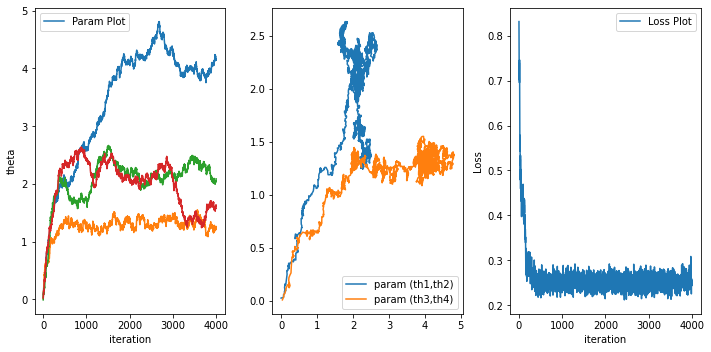

In [155]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()

### c1=0.01(small movement) delta=0.1+ (medium fluctuation)

In [158]:
progress=[];
theta=[0,0,0,0];
thdata=[];

c1=0.01   
delta=6
nshot=3000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(4000):
    delta=random.random()+0.1
    theta=theta-SPSA(1,theta,c1,delta,nshot)
    print(ep,"th iteration L=",lossCal2qubit(1,theta,nshot))
    progress.append(lossCal2qubit(1,theta,nshot))
    thdata.append(theta)

0 th iteration L= 0.768
1 th iteration L= 0.694
2 th iteration L= 0.7106666666666667
3 th iteration L= 0.6993333333333334
4 th iteration L= 0.6893333333333334
5 th iteration L= 0.6926666666666667
6 th iteration L= 0.646
7 th iteration L= 0.6859999999999999
8 th iteration L= 0.612
9 th iteration L= 0.5920000000000001
10 th iteration L= 0.5946666666666667
11 th iteration L= 0.5966666666666667
12 th iteration L= 0.6346666666666667
13 th iteration L= 0.6046666666666667
14 th iteration L= 0.56
15 th iteration L= 0.5693333333333334
16 th iteration L= 0.6073333333333333
17 th iteration L= 0.6273333333333333
18 th iteration L= 0.6086666666666667
19 th iteration L= 0.608
20 th iteration L= 0.62
21 th iteration L= 0.598
22 th iteration L= 0.5346666666666666
23 th iteration L= 0.5553333333333333
24 th iteration L= 0.5806666666666667
25 th iteration L= 0.5233333333333333
26 th iteration L= 0.5413333333333333
27 th iteration L= 0.532
28 th iteration L= 0.494
29 th iteration L= 0.4946666666666667
30

228 th iteration L= 0.2406666666666667
229 th iteration L= 0.256
230 th iteration L= 0.2746666666666666
231 th iteration L= 0.2553333333333333
232 th iteration L= 0.2753333333333333
233 th iteration L= 0.2693333333333333
234 th iteration L= 0.2386666666666667
235 th iteration L= 0.2533333333333333
236 th iteration L= 0.23199999999999998
237 th iteration L= 0.244
238 th iteration L= 0.2526666666666667
239 th iteration L= 0.264
240 th iteration L= 0.23199999999999998
241 th iteration L= 0.2786666666666666
242 th iteration L= 0.2606666666666667
243 th iteration L= 0.27
244 th iteration L= 0.2733333333333333
245 th iteration L= 0.268
246 th iteration L= 0.2586666666666667
247 th iteration L= 0.268
248 th iteration L= 0.2566666666666667
249 th iteration L= 0.254
250 th iteration L= 0.236
251 th iteration L= 0.244
252 th iteration L= 0.2626666666666667
253 th iteration L= 0.2466666666666667
254 th iteration L= 0.2866666666666666
255 th iteration L= 0.2593333333333333
256 th iteration L= 0.26

460 th iteration L= 0.2526666666666667
461 th iteration L= 0.246
462 th iteration L= 0.2426666666666667
463 th iteration L= 0.244
464 th iteration L= 0.2533333333333333
465 th iteration L= 0.262
466 th iteration L= 0.246
467 th iteration L= 0.2633333333333333
468 th iteration L= 0.248
469 th iteration L= 0.2586666666666667
470 th iteration L= 0.2693333333333333
471 th iteration L= 0.21866666666666668
472 th iteration L= 0.27
473 th iteration L= 0.23733333333333329
474 th iteration L= 0.2646666666666667
475 th iteration L= 0.2526666666666667
476 th iteration L= 0.2586666666666667
477 th iteration L= 0.23333333333333328
478 th iteration L= 0.2453333333333333
479 th iteration L= 0.20999999999999996
480 th iteration L= 0.2546666666666667
481 th iteration L= 0.23733333333333329
482 th iteration L= 0.2633333333333333
483 th iteration L= 0.22666666666666668
484 th iteration L= 0.242
485 th iteration L= 0.2686666666666667
486 th iteration L= 0.23133333333333328
487 th iteration L= 0.2533333333

693 th iteration L= 0.2673333333333333
694 th iteration L= 0.262
695 th iteration L= 0.2533333333333333
696 th iteration L= 0.24
697 th iteration L= 0.254
698 th iteration L= 0.246
699 th iteration L= 0.2686666666666667
700 th iteration L= 0.252
701 th iteration L= 0.258
702 th iteration L= 0.2413333333333333
703 th iteration L= 0.2606666666666667
704 th iteration L= 0.2573333333333333
705 th iteration L= 0.22799999999999998
706 th iteration L= 0.2633333333333333
707 th iteration L= 0.2493333333333333
708 th iteration L= 0.2633333333333333
709 th iteration L= 0.2746666666666666
710 th iteration L= 0.266
711 th iteration L= 0.2506666666666667
712 th iteration L= 0.266
713 th iteration L= 0.2433333333333333
714 th iteration L= 0.2593333333333333
715 th iteration L= 0.2586666666666667
716 th iteration L= 0.2606666666666667
717 th iteration L= 0.2666666666666667
718 th iteration L= 0.2526666666666667
719 th iteration L= 0.25
720 th iteration L= 0.272
721 th iteration L= 0.248
722 th iterat

926 th iteration L= 0.252
927 th iteration L= 0.248
928 th iteration L= 0.244
929 th iteration L= 0.2406666666666667
930 th iteration L= 0.2566666666666667
931 th iteration L= 0.268
932 th iteration L= 0.2573333333333333
933 th iteration L= 0.258
934 th iteration L= 0.2466666666666667
935 th iteration L= 0.254
936 th iteration L= 0.29933333333333334
937 th iteration L= 0.29533333333333334
938 th iteration L= 0.30133333333333334
939 th iteration L= 0.31000000000000005
940 th iteration L= 0.31599999999999995
941 th iteration L= 0.29866666666666664
942 th iteration L= 0.30333333333333334
943 th iteration L= 0.2786666666666666
944 th iteration L= 0.2726666666666666
945 th iteration L= 0.27
946 th iteration L= 0.2786666666666666
947 th iteration L= 0.30666666666666664
948 th iteration L= 0.29733333333333334
949 th iteration L= 0.29200000000000004
950 th iteration L= 0.2753333333333333
951 th iteration L= 0.2486666666666667
952 th iteration L= 0.2886666666666666
953 th iteration L= 0.2813333

1158 th iteration L= 0.2686666666666667
1159 th iteration L= 0.2646666666666667
1160 th iteration L= 0.22999999999999998
1161 th iteration L= 0.2493333333333333
1162 th iteration L= 0.28200000000000003
1163 th iteration L= 0.2473333333333333
1164 th iteration L= 0.2633333333333333
1165 th iteration L= 0.2466666666666667
1166 th iteration L= 0.26
1167 th iteration L= 0.2453333333333333
1168 th iteration L= 0.256
1169 th iteration L= 0.2453333333333333
1170 th iteration L= 0.258
1171 th iteration L= 0.24
1172 th iteration L= 0.2513333333333333
1173 th iteration L= 0.238
1174 th iteration L= 0.2646666666666667
1175 th iteration L= 0.2466666666666667
1176 th iteration L= 0.248
1177 th iteration L= 0.22599999999999998
1178 th iteration L= 0.26
1179 th iteration L= 0.262
1180 th iteration L= 0.2513333333333333
1181 th iteration L= 0.2586666666666667
1182 th iteration L= 0.236
1183 th iteration L= 0.2526666666666667
1184 th iteration L= 0.23733333333333329
1185 th iteration L= 0.2473333333333

1385 th iteration L= 0.254
1386 th iteration L= 0.2526666666666667
1387 th iteration L= 0.262
1388 th iteration L= 0.2386666666666667
1389 th iteration L= 0.2693333333333333
1390 th iteration L= 0.23733333333333329
1391 th iteration L= 0.2626666666666667
1392 th iteration L= 0.248
1393 th iteration L= 0.244
1394 th iteration L= 0.2453333333333333
1395 th iteration L= 0.2526666666666667
1396 th iteration L= 0.244
1397 th iteration L= 0.2613333333333333
1398 th iteration L= 0.2326666666666667
1399 th iteration L= 0.23399999999999999
1400 th iteration L= 0.24
1401 th iteration L= 0.2386666666666667
1402 th iteration L= 0.2426666666666667
1403 th iteration L= 0.2393333333333333
1404 th iteration L= 0.2586666666666667
1405 th iteration L= 0.2646666666666667
1406 th iteration L= 0.258
1407 th iteration L= 0.244
1408 th iteration L= 0.2533333333333333
1409 th iteration L= 0.242
1410 th iteration L= 0.248
1411 th iteration L= 0.2546666666666667
1412 th iteration L= 0.258
1413 th iteration L= 0

1612 th iteration L= 0.2646666666666667
1613 th iteration L= 0.2466666666666667
1614 th iteration L= 0.2553333333333333
1615 th iteration L= 0.2806666666666666
1616 th iteration L= 0.2806666666666666
1617 th iteration L= 0.2453333333333333
1618 th iteration L= 0.2726666666666666
1619 th iteration L= 0.29733333333333334
1620 th iteration L= 0.2886666666666666
1621 th iteration L= 0.28600000000000003
1622 th iteration L= 0.278
1623 th iteration L= 0.26
1624 th iteration L= 0.29600000000000004
1625 th iteration L= 0.2633333333333333
1626 th iteration L= 0.28400000000000003
1627 th iteration L= 0.276
1628 th iteration L= 0.2833333333333333
1629 th iteration L= 0.2726666666666666
1630 th iteration L= 0.2826666666666666
1631 th iteration L= 0.2813333333333333
1632 th iteration L= 0.262
1633 th iteration L= 0.2793333333333333
1634 th iteration L= 0.30266666666666664
1635 th iteration L= 0.28
1636 th iteration L= 0.2806666666666666
1637 th iteration L= 0.28400000000000003
1638 th iteration L= 

1838 th iteration L= 0.2533333333333333
1839 th iteration L= 0.2553333333333333
1840 th iteration L= 0.2626666666666667
1841 th iteration L= 0.25
1842 th iteration L= 0.248
1843 th iteration L= 0.274
1844 th iteration L= 0.2706666666666667
1845 th iteration L= 0.2513333333333333
1846 th iteration L= 0.266
1847 th iteration L= 0.2786666666666666
1848 th iteration L= 0.2713333333333333
1849 th iteration L= 0.2493333333333333
1850 th iteration L= 0.2473333333333333
1851 th iteration L= 0.244
1852 th iteration L= 0.2546666666666667
1853 th iteration L= 0.22799999999999998
1854 th iteration L= 0.2666666666666667
1855 th iteration L= 0.2793333333333333
1856 th iteration L= 0.242
1857 th iteration L= 0.244
1858 th iteration L= 0.246
1859 th iteration L= 0.2546666666666667
1860 th iteration L= 0.2453333333333333
1861 th iteration L= 0.2813333333333333
1862 th iteration L= 0.2633333333333333
1863 th iteration L= 0.264
1864 th iteration L= 0.2626666666666667
1865 th iteration L= 0.27266666666666

2061 th iteration L= 0.2593333333333333
2062 th iteration L= 0.2486666666666667
2063 th iteration L= 0.2886666666666666
2064 th iteration L= 0.22799999999999998
2065 th iteration L= 0.2726666666666666
2066 th iteration L= 0.2493333333333333
2067 th iteration L= 0.2393333333333333
2068 th iteration L= 0.248
2069 th iteration L= 0.242
2070 th iteration L= 0.2413333333333333
2071 th iteration L= 0.258
2072 th iteration L= 0.2506666666666667
2073 th iteration L= 0.2473333333333333
2074 th iteration L= 0.2493333333333333
2075 th iteration L= 0.2633333333333333
2076 th iteration L= 0.2593333333333333
2077 th iteration L= 0.2513333333333333
2078 th iteration L= 0.244
2079 th iteration L= 0.242
2080 th iteration L= 0.24
2081 th iteration L= 0.2466666666666667
2082 th iteration L= 0.258
2083 th iteration L= 0.2346666666666667
2084 th iteration L= 0.2446666666666667
2085 th iteration L= 0.2533333333333333
2086 th iteration L= 0.23733333333333329
2087 th iteration L= 0.238
2088 th iteration L= 0.

2286 th iteration L= 0.2566666666666667
2287 th iteration L= 0.2786666666666666
2288 th iteration L= 0.2486666666666667
2289 th iteration L= 0.2593333333333333
2290 th iteration L= 0.2446666666666667
2291 th iteration L= 0.2646666666666667
2292 th iteration L= 0.2493333333333333
2293 th iteration L= 0.26
2294 th iteration L= 0.2426666666666667
2295 th iteration L= 0.2586666666666667
2296 th iteration L= 0.266
2297 th iteration L= 0.2433333333333333
2298 th iteration L= 0.258
2299 th iteration L= 0.2473333333333333
2300 th iteration L= 0.2493333333333333
2301 th iteration L= 0.26
2302 th iteration L= 0.2646666666666667
2303 th iteration L= 0.22533333333333339
2304 th iteration L= 0.2533333333333333
2305 th iteration L= 0.2593333333333333
2306 th iteration L= 0.248
2307 th iteration L= 0.256
2308 th iteration L= 0.2513333333333333
2309 th iteration L= 0.246
2310 th iteration L= 0.2486666666666667
2311 th iteration L= 0.2366666666666667
2312 th iteration L= 0.24
2313 th iteration L= 0.250

2513 th iteration L= 0.22599999999999998
2514 th iteration L= 0.2346666666666667
2515 th iteration L= 0.2426666666666667
2516 th iteration L= 0.2833333333333333
2517 th iteration L= 0.264
2518 th iteration L= 0.28600000000000003
2519 th iteration L= 0.258
2520 th iteration L= 0.2506666666666667
2521 th iteration L= 0.2566666666666667
2522 th iteration L= 0.2673333333333333
2523 th iteration L= 0.2446666666666667
2524 th iteration L= 0.2506666666666667
2525 th iteration L= 0.272
2526 th iteration L= 0.2573333333333333
2527 th iteration L= 0.2533333333333333
2528 th iteration L= 0.2393333333333333
2529 th iteration L= 0.2453333333333333
2530 th iteration L= 0.2506666666666667
2531 th iteration L= 0.2506666666666667
2532 th iteration L= 0.256
2533 th iteration L= 0.2526666666666667
2534 th iteration L= 0.2506666666666667
2535 th iteration L= 0.2326666666666667
2536 th iteration L= 0.25
2537 th iteration L= 0.256
2538 th iteration L= 0.27
2539 th iteration L= 0.2693333333333333
2540 th ite

2740 th iteration L= 0.252
2741 th iteration L= 0.23133333333333328
2742 th iteration L= 0.2646666666666667
2743 th iteration L= 0.2553333333333333
2744 th iteration L= 0.2473333333333333
2745 th iteration L= 0.2433333333333333
2746 th iteration L= 0.254
2747 th iteration L= 0.2506666666666667
2748 th iteration L= 0.2673333333333333
2749 th iteration L= 0.2586666666666667
2750 th iteration L= 0.2393333333333333
2751 th iteration L= 0.22999999999999998
2752 th iteration L= 0.2433333333333333
2753 th iteration L= 0.2606666666666667
2754 th iteration L= 0.246
2755 th iteration L= 0.2426666666666667
2756 th iteration L= 0.2713333333333333
2757 th iteration L= 0.2566666666666667
2758 th iteration L= 0.2426666666666667
2759 th iteration L= 0.2606666666666667
2760 th iteration L= 0.262
2761 th iteration L= 0.2626666666666667
2762 th iteration L= 0.246
2763 th iteration L= 0.258
2764 th iteration L= 0.24
2765 th iteration L= 0.236
2766 th iteration L= 0.2406666666666667
2767 th iteration L= 0.

2967 th iteration L= 0.2673333333333333
2968 th iteration L= 0.2433333333333333
2969 th iteration L= 0.2513333333333333
2970 th iteration L= 0.2473333333333333
2971 th iteration L= 0.23733333333333329
2972 th iteration L= 0.28800000000000003
2973 th iteration L= 0.2453333333333333
2974 th iteration L= 0.244
2975 th iteration L= 0.2453333333333333
2976 th iteration L= 0.2526666666666667
2977 th iteration L= 0.26
2978 th iteration L= 0.2573333333333333
2979 th iteration L= 0.2406666666666667
2980 th iteration L= 0.258
2981 th iteration L= 0.23733333333333329
2982 th iteration L= 0.2713333333333333
2983 th iteration L= 0.2486666666666667
2984 th iteration L= 0.2686666666666667
2985 th iteration L= 0.2433333333333333
2986 th iteration L= 0.246
2987 th iteration L= 0.2473333333333333
2988 th iteration L= 0.25
2989 th iteration L= 0.2586666666666667
2990 th iteration L= 0.23333333333333328
2991 th iteration L= 0.2626666666666667
2992 th iteration L= 0.244
2993 th iteration L= 0.268
2994 th i

3194 th iteration L= 0.2473333333333333
3195 th iteration L= 0.2473333333333333
3196 th iteration L= 0.2686666666666667
3197 th iteration L= 0.2493333333333333
3198 th iteration L= 0.236
3199 th iteration L= 0.264
3200 th iteration L= 0.2346666666666667
3201 th iteration L= 0.2366666666666667
3202 th iteration L= 0.246
3203 th iteration L= 0.2513333333333333
3204 th iteration L= 0.23733333333333329
3205 th iteration L= 0.2486666666666667
3206 th iteration L= 0.2693333333333333
3207 th iteration L= 0.2386666666666667
3208 th iteration L= 0.248
3209 th iteration L= 0.2426666666666667
3210 th iteration L= 0.2426666666666667
3211 th iteration L= 0.2646666666666667
3212 th iteration L= 0.2533333333333333
3213 th iteration L= 0.2346666666666667
3214 th iteration L= 0.2446666666666667
3215 th iteration L= 0.26
3216 th iteration L= 0.2413333333333333
3217 th iteration L= 0.2433333333333333
3218 th iteration L= 0.2513333333333333
3219 th iteration L= 0.2546666666666667
3220 th iteration L= 0.25

3421 th iteration L= 0.2533333333333333
3422 th iteration L= 0.2533333333333333
3423 th iteration L= 0.2586666666666667
3424 th iteration L= 0.23733333333333329
3425 th iteration L= 0.2473333333333333
3426 th iteration L= 0.262
3427 th iteration L= 0.2573333333333333
3428 th iteration L= 0.2546666666666667
3429 th iteration L= 0.22866666666666668
3430 th iteration L= 0.256
3431 th iteration L= 0.22999999999999998
3432 th iteration L= 0.2493333333333333
3433 th iteration L= 0.2653333333333333
3434 th iteration L= 0.23333333333333328
3435 th iteration L= 0.2626666666666667
3436 th iteration L= 0.2493333333333333
3437 th iteration L= 0.242
3438 th iteration L= 0.2433333333333333
3439 th iteration L= 0.25
3440 th iteration L= 0.246
3441 th iteration L= 0.22866666666666668
3442 th iteration L= 0.238
3443 th iteration L= 0.2506666666666667
3444 th iteration L= 0.2713333333333333
3445 th iteration L= 0.248
3446 th iteration L= 0.2526666666666667
3447 th iteration L= 0.26
3448 th iteration L= 

3649 th iteration L= 0.248
3650 th iteration L= 0.264
3651 th iteration L= 0.2633333333333333
3652 th iteration L= 0.2753333333333333
3653 th iteration L= 0.276
3654 th iteration L= 0.2566666666666667
3655 th iteration L= 0.238
3656 th iteration L= 0.2386666666666667
3657 th iteration L= 0.2653333333333333
3658 th iteration L= 0.238
3659 th iteration L= 0.2733333333333333
3660 th iteration L= 0.23333333333333328
3661 th iteration L= 0.2433333333333333
3662 th iteration L= 0.2473333333333333
3663 th iteration L= 0.254
3664 th iteration L= 0.2366666666666667
3665 th iteration L= 0.2526666666666667
3666 th iteration L= 0.264
3667 th iteration L= 0.22666666666666668
3668 th iteration L= 0.2633333333333333
3669 th iteration L= 0.2486666666666667
3670 th iteration L= 0.2866666666666666
3671 th iteration L= 0.252
3672 th iteration L= 0.2386666666666667
3673 th iteration L= 0.2446666666666667
3674 th iteration L= 0.2606666666666667
3675 th iteration L= 0.2573333333333333
3676 th iteration L= 0

3884 th iteration L= 0.2393333333333333
3885 th iteration L= 0.22533333333333339
3886 th iteration L= 0.2526666666666667
3887 th iteration L= 0.24
3888 th iteration L= 0.244
3889 th iteration L= 0.254
3890 th iteration L= 0.2486666666666667
3891 th iteration L= 0.2513333333333333
3892 th iteration L= 0.2593333333333333
3893 th iteration L= 0.23733333333333329
3894 th iteration L= 0.2566666666666667
3895 th iteration L= 0.246
3896 th iteration L= 0.2453333333333333
3897 th iteration L= 0.2466666666666667
3898 th iteration L= 0.22866666666666668
3899 th iteration L= 0.2493333333333333
3900 th iteration L= 0.272
3901 th iteration L= 0.2573333333333333
3902 th iteration L= 0.2493333333333333
3903 th iteration L= 0.256
3904 th iteration L= 0.23533333333333328
3905 th iteration L= 0.2533333333333333
3906 th iteration L= 0.2653333333333333
3907 th iteration L= 0.2613333333333333
3908 th iteration L= 0.2653333333333333
3909 th iteration L= 0.2626666666666667
3910 th iteration L= 0.28
3911 th i

After 1000 iteration we have theta = [5.07218751 1.2569279  7.76820433 5.5666536 ]


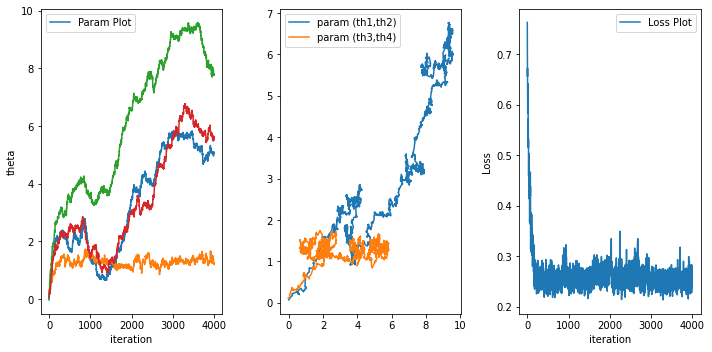

In [159]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()

### c1=0.01(small movement) delta=0+ (Large fluctuation)

In [160]:
progress=[];
theta=[0,0,0,0];
thdata=[];

c1=0.01   
delta=6
nshot=3000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(4000):
    delta=random.random()
    theta=theta-SPSA(1,theta,c1,delta,nshot)
    print(ep,"th iteration L=",lossCal2qubit(1,theta,nshot))
    progress.append(lossCal2qubit(1,theta,nshot))
    thdata.append(theta)

0 th iteration L= 0.8246666666666667
1 th iteration L= 0.79
2 th iteration L= 0.42600000000000005
3 th iteration L= 0.43133333333333335
4 th iteration L= 0.5426666666666666
5 th iteration L= 0.5046666666666666
6 th iteration L= 0.514
7 th iteration L= 0.49
8 th iteration L= 1.2306666666666666
9 th iteration L= 1.2306666666666666
10 th iteration L= 1.22
11 th iteration L= 1.2386666666666666
12 th iteration L= 1.2193333333333334
13 th iteration L= 1.218
14 th iteration L= 1.1873333333333334
15 th iteration L= 1.1806666666666668
16 th iteration L= 1.1946666666666665
17 th iteration L= 1.1233333333333333
18 th iteration L= 1.006
19 th iteration L= 1.0286666666666666
20 th iteration L= 0.986
21 th iteration L= 0.9633333333333334
22 th iteration L= 0.8733333333333333
23 th iteration L= 0.8353333333333334
24 th iteration L= 0.7826666666666666
25 th iteration L= 0.7453333333333334
26 th iteration L= 0.8026666666666666
27 th iteration L= 0.5586666666666666
28 th iteration L= 0.508
29 th iterati

232 th iteration L= 1.2173333333333334
233 th iteration L= 1.266
234 th iteration L= 1.2293333333333334
235 th iteration L= 0.348
236 th iteration L= 0.3493333333333334
237 th iteration L= 0.3506666666666667
238 th iteration L= 0.36
239 th iteration L= 0.398
240 th iteration L= 0.3746666666666667
241 th iteration L= 0.358
242 th iteration L= 0.388
243 th iteration L= 0.33599999999999997
244 th iteration L= 0.28733333333333333
245 th iteration L= 0.28
246 th iteration L= 0.2713333333333333
247 th iteration L= 0.384
248 th iteration L= 0.3426666666666667
249 th iteration L= 0.364
250 th iteration L= 0.3426666666666667
251 th iteration L= 0.28800000000000003
252 th iteration L= 0.2806666666666666
253 th iteration L= 0.31733333333333336
254 th iteration L= 0.30600000000000005
255 th iteration L= 0.30333333333333334
256 th iteration L= 0.29466666666666663
257 th iteration L= 0.30733333333333335
258 th iteration L= 0.30400000000000005
259 th iteration L= 0.2626666666666667
260 th iteration L

459 th iteration L= 0.22399999999999998
460 th iteration L= 0.2453333333333333
461 th iteration L= 0.2586666666666667
462 th iteration L= 0.25
463 th iteration L= 0.2426666666666667
464 th iteration L= 0.2573333333333333
465 th iteration L= 0.2553333333333333
466 th iteration L= 0.2733333333333333
467 th iteration L= 0.2626666666666667
468 th iteration L= 0.2573333333333333
469 th iteration L= 0.262
470 th iteration L= 0.254
471 th iteration L= 0.2506666666666667
472 th iteration L= 0.2673333333333333
473 th iteration L= 0.256
474 th iteration L= 0.2633333333333333
475 th iteration L= 0.2493333333333333
476 th iteration L= 0.2566666666666667
477 th iteration L= 0.2473333333333333
478 th iteration L= 0.2346666666666667
479 th iteration L= 0.2473333333333333
480 th iteration L= 0.2533333333333333
481 th iteration L= 0.2553333333333333
482 th iteration L= 0.2306666666666667
483 th iteration L= 0.26
484 th iteration L= 0.2446666666666667
485 th iteration L= 0.2573333333333333
486 th iterat

687 th iteration L= 0.5713333333333334
688 th iteration L= 0.5713333333333334
689 th iteration L= 0.8593333333333333
690 th iteration L= 0.8220000000000001
691 th iteration L= 0.7393333333333334
692 th iteration L= 0.8046666666666666
693 th iteration L= 0.772
694 th iteration L= 0.7486666666666666
695 th iteration L= 0.7393333333333334
696 th iteration L= 0.6833333333333333
697 th iteration L= 0.4753333333333334
698 th iteration L= 0.3753333333333333
699 th iteration L= 0.3493333333333334
700 th iteration L= 0.33266666666666667
701 th iteration L= 0.32866666666666666
702 th iteration L= 0.3446666666666667
703 th iteration L= 0.3406666666666667
704 th iteration L= 0.31799999999999995
705 th iteration L= 0.32266666666666666
706 th iteration L= 0.29600000000000004
707 th iteration L= 0.30066666666666664
708 th iteration L= 0.31533333333333335
709 th iteration L= 0.3473333333333334
710 th iteration L= 0.3446666666666667
711 th iteration L= 0.32466666666666666
712 th iteration L= 0.31266666

912 th iteration L= 0.52
913 th iteration L= 0.4973333333333333
914 th iteration L= 0.4786666666666667
915 th iteration L= 0.46199999999999997
916 th iteration L= 0.4693333333333334
917 th iteration L= 0.4926666666666667
918 th iteration L= 0.4866666666666667
919 th iteration L= 0.506
920 th iteration L= 0.4966666666666667
921 th iteration L= 0.5066666666666666
922 th iteration L= 0.4946666666666667
923 th iteration L= 0.45199999999999996
924 th iteration L= 0.3846666666666667
925 th iteration L= 0.382
926 th iteration L= 0.34199999999999997
927 th iteration L= 0.30400000000000005
928 th iteration L= 0.30000000000000004
929 th iteration L= 0.30800000000000005
930 th iteration L= 0.29600000000000004
931 th iteration L= 0.30666666666666664
932 th iteration L= 0.29533333333333334
933 th iteration L= 0.29200000000000004
934 th iteration L= 0.2806666666666666
935 th iteration L= 0.31000000000000005
936 th iteration L= 0.23533333333333328
937 th iteration L= 0.256
938 th iteration L= 0.25466

1134 th iteration L= 0.716
1135 th iteration L= 0.6766666666666667
1136 th iteration L= 0.6613333333333333
1137 th iteration L= 0.5993333333333333
1138 th iteration L= 0.5613333333333334
1139 th iteration L= 0.5640000000000001
1140 th iteration L= 0.42533333333333334
1141 th iteration L= 0.41800000000000004
1142 th iteration L= 0.396
1143 th iteration L= 0.3906666666666667
1144 th iteration L= 0.38
1145 th iteration L= 0.2626666666666667
1146 th iteration L= 0.264
1147 th iteration L= 0.2546666666666667
1148 th iteration L= 0.2433333333333333
1149 th iteration L= 0.3553333333333333
1150 th iteration L= 0.348
1151 th iteration L= 0.3633333333333333
1152 th iteration L= 0.32333333333333336
1153 th iteration L= 0.344
1154 th iteration L= 0.2413333333333333
1155 th iteration L= 0.7246666666666667
1156 th iteration L= 0.7713333333333333
1157 th iteration L= 0.7513333333333333
1158 th iteration L= 0.5313333333333333
1159 th iteration L= 0.4846666666666667
1160 th iteration L= 0.6386666666666

1356 th iteration L= 0.2713333333333333
1357 th iteration L= 0.2546666666666667
1358 th iteration L= 0.6753333333333333
1359 th iteration L= 0.5053333333333334
1360 th iteration L= 0.508
1361 th iteration L= 0.44866666666666666
1362 th iteration L= 0.43333333333333335
1363 th iteration L= 0.45466666666666666
1364 th iteration L= 0.43400000000000005
1365 th iteration L= 0.706
1366 th iteration L= 0.6699999999999999
1367 th iteration L= 0.6326666666666667
1368 th iteration L= 0.6006666666666667
1369 th iteration L= 0.6173333333333333
1370 th iteration L= 0.5920000000000001
1371 th iteration L= 0.6046666666666667
1372 th iteration L= 0.6173333333333333
1373 th iteration L= 0.556
1374 th iteration L= 0.5686666666666667
1375 th iteration L= 0.4946666666666667
1376 th iteration L= 0.51
1377 th iteration L= 0.5346666666666666
1378 th iteration L= 0.5053333333333334
1379 th iteration L= 0.5253333333333333
1380 th iteration L= 0.4706666666666667
1381 th iteration L= 0.472
1382 th iteration L= 0

1576 th iteration L= 0.77
1577 th iteration L= 0.7646666666666666
1578 th iteration L= 0.7293333333333334
1579 th iteration L= 0.6846666666666666
1580 th iteration L= 0.7126666666666667
1581 th iteration L= 0.6353333333333333
1582 th iteration L= 0.626
1583 th iteration L= 0.6393333333333333
1584 th iteration L= 0.5513333333333333
1585 th iteration L= 0.508
1586 th iteration L= 0.552
1587 th iteration L= 0.532
1588 th iteration L= 0.5813333333333333
1589 th iteration L= 0.5573333333333333
1590 th iteration L= 0.55
1591 th iteration L= 0.536
1592 th iteration L= 0.5393333333333333
1593 th iteration L= 0.5126666666666666
1594 th iteration L= 0.4886666666666667
1595 th iteration L= 0.512
1596 th iteration L= 0.49
1597 th iteration L= 0.46266666666666667
1598 th iteration L= 0.42866666666666664
1599 th iteration L= 0.4826666666666667
1600 th iteration L= 0.43999999999999995
1601 th iteration L= 0.45999999999999996
1602 th iteration L= 0.4666666666666667
1603 th iteration L= 0.488
1604 th i

1798 th iteration L= 0.2426666666666667
1799 th iteration L= 0.25
1800 th iteration L= 0.2726666666666666
1801 th iteration L= 0.278
1802 th iteration L= 0.246
1803 th iteration L= 0.28400000000000003
1804 th iteration L= 0.2573333333333333
1805 th iteration L= 0.258
1806 th iteration L= 0.266
1807 th iteration L= 0.268
1808 th iteration L= 0.2653333333333333
1809 th iteration L= 0.254
1810 th iteration L= 0.248
1811 th iteration L= 0.2393333333333333
1812 th iteration L= 0.2446666666666667
1813 th iteration L= 0.2566666666666667
1814 th iteration L= 0.248
1815 th iteration L= 0.252
1816 th iteration L= 0.252
1817 th iteration L= 0.242
1818 th iteration L= 0.254
1819 th iteration L= 0.2466666666666667
1820 th iteration L= 0.2553333333333333
1821 th iteration L= 0.2533333333333333
1822 th iteration L= 0.28
1823 th iteration L= 0.272
1824 th iteration L= 0.2613333333333333
1825 th iteration L= 0.2806666666666666
1826 th iteration L= 0.2566666666666667
1827 th iteration L= 0.2653333333333

2024 th iteration L= 0.45733333333333337
2025 th iteration L= 0.44066666666666665
2026 th iteration L= 0.41666666666666663
2027 th iteration L= 0.45799999999999996
2028 th iteration L= 0.42066666666666663
2029 th iteration L= 0.392
2030 th iteration L= 0.43066666666666664
2031 th iteration L= 0.42066666666666663
2032 th iteration L= 0.43000000000000005
2033 th iteration L= 0.394
2034 th iteration L= 0.384
2035 th iteration L= 0.3693333333333333
2036 th iteration L= 0.3793333333333333
2037 th iteration L= 0.354
2038 th iteration L= 0.3686666666666667
2039 th iteration L= 0.3553333333333333
2040 th iteration L= 0.3613333333333333
2041 th iteration L= 0.3426666666666667
2042 th iteration L= 0.33466666666666667
2043 th iteration L= 0.33599999999999997
2044 th iteration L= 0.32733333333333337
2045 th iteration L= 0.3373333333333334
2046 th iteration L= 0.33266666666666667
2047 th iteration L= 0.31666666666666665
2048 th iteration L= 0.2826666666666666
2049 th iteration L= 0.2820000000000000

2243 th iteration L= 0.2513333333333333
2244 th iteration L= 0.246
2245 th iteration L= 0.2553333333333333
2246 th iteration L= 0.2613333333333333
2247 th iteration L= 0.252
2248 th iteration L= 0.2666666666666667
2249 th iteration L= 0.2606666666666667
2250 th iteration L= 0.2533333333333333
2251 th iteration L= 0.264
2252 th iteration L= 0.26
2253 th iteration L= 0.26
2254 th iteration L= 0.2606666666666667
2255 th iteration L= 0.252
2256 th iteration L= 0.29400000000000004
2257 th iteration L= 0.2626666666666667
2258 th iteration L= 0.264
2259 th iteration L= 0.276
2260 th iteration L= 0.2493333333333333
2261 th iteration L= 0.278
2262 th iteration L= 0.2346666666666667
2263 th iteration L= 0.2393333333333333
2264 th iteration L= 0.24
2265 th iteration L= 0.254
2266 th iteration L= 0.2386666666666667
2267 th iteration L= 0.248
2268 th iteration L= 0.2566666666666667
2269 th iteration L= 0.242
2270 th iteration L= 0.252
2271 th iteration L= 0.2426666666666667
2272 th iteration L= 0.2

2469 th iteration L= 0.2546666666666667
2470 th iteration L= 0.2506666666666667
2471 th iteration L= 0.254
2472 th iteration L= 0.2433333333333333
2473 th iteration L= 0.28
2474 th iteration L= 0.28200000000000003
2475 th iteration L= 0.2453333333333333
2476 th iteration L= 0.258
2477 th iteration L= 0.2553333333333333
2478 th iteration L= 0.244
2479 th iteration L= 0.268
2480 th iteration L= 0.2806666666666666
2481 th iteration L= 0.2626666666666667
2482 th iteration L= 0.2786666666666666
2483 th iteration L= 0.276
2484 th iteration L= 0.2706666666666667
2485 th iteration L= 0.2513333333333333
2486 th iteration L= 0.262
2487 th iteration L= 0.26
2488 th iteration L= 0.26
2489 th iteration L= 0.2593333333333333
2490 th iteration L= 0.2713333333333333
2491 th iteration L= 0.2493333333333333
2492 th iteration L= 0.2433333333333333
2493 th iteration L= 0.2533333333333333
2494 th iteration L= 0.2513333333333333
2495 th iteration L= 0.256
2496 th iteration L= 0.26
2497 th iteration L= 0.264

2691 th iteration L= 0.3913333333333333
2692 th iteration L= 0.39
2693 th iteration L= 0.404
2694 th iteration L= 0.4053333333333333
2695 th iteration L= 0.394
2696 th iteration L= 0.41933333333333334
2697 th iteration L= 0.42600000000000005
2698 th iteration L= 0.472
2699 th iteration L= 0.42933333333333334
2700 th iteration L= 0.42400000000000004
2701 th iteration L= 0.41400000000000003
2702 th iteration L= 0.352
2703 th iteration L= 0.362
2704 th iteration L= 0.3593333333333333
2705 th iteration L= 0.3453333333333334
2706 th iteration L= 0.33466666666666667
2707 th iteration L= 0.3393333333333334
2708 th iteration L= 0.3553333333333333
2709 th iteration L= 0.33866666666666667
2710 th iteration L= 0.33666666666666667
2711 th iteration L= 0.30866666666666664
2712 th iteration L= 0.32799999999999996
2713 th iteration L= 0.31133333333333335
2714 th iteration L= 0.31733333333333336
2715 th iteration L= 0.31999999999999995
2716 th iteration L= 0.30600000000000005
2717 th iteration L= 0.29

2909 th iteration L= 0.3566666666666667
2910 th iteration L= 0.33599999999999997
2911 th iteration L= 0.32866666666666666
2912 th iteration L= 0.30933333333333335
2913 th iteration L= 0.29133333333333333
2914 th iteration L= 0.2666666666666667
2915 th iteration L= 0.2446666666666667
2916 th iteration L= 0.258
2917 th iteration L= 0.2706666666666667
2918 th iteration L= 0.2513333333333333
2919 th iteration L= 0.2586666666666667
2920 th iteration L= 0.256
2921 th iteration L= 0.2726666666666666
2922 th iteration L= 0.2646666666666667
2923 th iteration L= 0.2546666666666667
2924 th iteration L= 0.24
2925 th iteration L= 0.2473333333333333
2926 th iteration L= 0.2493333333333333
2927 th iteration L= 0.31066666666666665
2928 th iteration L= 0.27
2929 th iteration L= 0.2706666666666667
2930 th iteration L= 0.2686666666666667
2931 th iteration L= 0.2853333333333333
2932 th iteration L= 0.29266666666666663
2933 th iteration L= 0.33266666666666667
2934 th iteration L= 0.33533333333333337
2935 t

3132 th iteration L= 0.4813333333333333
3133 th iteration L= 0.4753333333333334
3134 th iteration L= 0.29800000000000004
3135 th iteration L= 0.2546666666666667
3136 th iteration L= 0.30133333333333334
3137 th iteration L= 0.31666666666666665
3138 th iteration L= 0.30933333333333335
3139 th iteration L= 0.3833333333333333
3140 th iteration L= 0.404
3141 th iteration L= 0.388
3142 th iteration L= 0.368
3143 th iteration L= 0.3633333333333333
3144 th iteration L= 0.3586666666666667
3145 th iteration L= 0.3433333333333334
3146 th iteration L= 0.35
3147 th iteration L= 0.3553333333333333
3148 th iteration L= 0.31333333333333335
3149 th iteration L= 0.31066666666666665
3150 th iteration L= 0.32133333333333336
3151 th iteration L= 0.30866666666666664
3152 th iteration L= 0.32799999999999996
3153 th iteration L= 0.29066666666666663
3154 th iteration L= 0.29333333333333333
3155 th iteration L= 0.31000000000000005
3156 th iteration L= 0.29400000000000004
3157 th iteration L= 0.30000000000000004

3353 th iteration L= 0.272
3354 th iteration L= 0.2566666666666667
3355 th iteration L= 0.2486666666666667
3356 th iteration L= 0.2533333333333333
3357 th iteration L= 0.2513333333333333
3358 th iteration L= 0.268
3359 th iteration L= 0.2773333333333333
3360 th iteration L= 0.29533333333333334
3361 th iteration L= 0.278
3362 th iteration L= 0.29400000000000004
3363 th iteration L= 0.2653333333333333
3364 th iteration L= 0.2646666666666667
3365 th iteration L= 0.2753333333333333
3366 th iteration L= 0.2573333333333333
3367 th iteration L= 0.2606666666666667
3368 th iteration L= 0.2426666666666667
3369 th iteration L= 0.2533333333333333
3370 th iteration L= 0.2486666666666667
3371 th iteration L= 0.256
3372 th iteration L= 0.2453333333333333
3373 th iteration L= 0.242
3374 th iteration L= 0.2466666666666667
3375 th iteration L= 0.2546666666666667
3376 th iteration L= 0.248
3377 th iteration L= 0.264
3378 th iteration L= 0.248
3379 th iteration L= 0.262
3380 th iteration L= 0.255333333333

3573 th iteration L= 0.404
3574 th iteration L= 0.3753333333333333
3575 th iteration L= 0.3753333333333333
3576 th iteration L= 0.41400000000000003
3577 th iteration L= 0.30600000000000005
3578 th iteration L= 0.30266666666666664
3579 th iteration L= 0.31200000000000006
3580 th iteration L= 0.31599999999999995
3581 th iteration L= 0.31000000000000005
3582 th iteration L= 0.31599999999999995
3583 th iteration L= 0.34199999999999997
3584 th iteration L= 0.31733333333333336
3585 th iteration L= 0.33666666666666667
3586 th iteration L= 0.33266666666666667
3587 th iteration L= 0.31399999999999995
3588 th iteration L= 0.31866666666666665
3589 th iteration L= 0.33399999999999996
3590 th iteration L= 0.30666666666666664
3591 th iteration L= 0.362
3592 th iteration L= 0.43266666666666664
3593 th iteration L= 0.3873333333333333
3594 th iteration L= 0.38
3595 th iteration L= 0.3693333333333333
3596 th iteration L= 0.3693333333333333
3597 th iteration L= 0.26
3598 th iteration L= 0.254
3599 th ite

3796 th iteration L= 0.23733333333333329
3797 th iteration L= 0.2606666666666667
3798 th iteration L= 0.23199999999999998
3799 th iteration L= 0.2486666666666667
3800 th iteration L= 0.28200000000000003
3801 th iteration L= 0.23133333333333328
3802 th iteration L= 0.2606666666666667
3803 th iteration L= 0.23733333333333329
3804 th iteration L= 0.2486666666666667
3805 th iteration L= 0.248
3806 th iteration L= 0.2693333333333333
3807 th iteration L= 0.248
3808 th iteration L= 0.2513333333333333
3809 th iteration L= 0.2593333333333333
3810 th iteration L= 0.2573333333333333
3811 th iteration L= 0.2426666666666667
3812 th iteration L= 0.2366666666666667
3813 th iteration L= 0.2853333333333333
3814 th iteration L= 0.2506666666666667
3815 th iteration L= 0.2486666666666667
3816 th iteration L= 0.2413333333333333
3817 th iteration L= 0.2746666666666666
3818 th iteration L= 0.28
3819 th iteration L= 0.30266666666666664
3820 th iteration L= 0.31599999999999995
3821 th iteration L= 0.3333333333

After 1000 iteration we have theta = [-103.50394433  -67.86694652 -292.62881376   39.36559293]


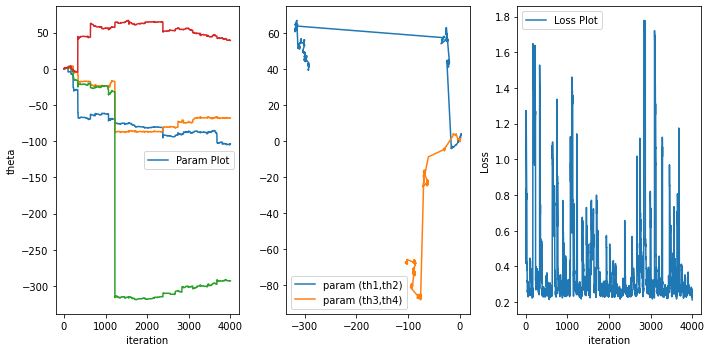

In [161]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()

### c1=0.05(Medium movement) delta=0.3+ (Small fluctuation)

In [162]:
progress=[];
theta=[0,0,0,0];
thdata=[];

c1=0.05
delta=6
nshot=3000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(4000):
    delta=random.random()+0.3
    theta=theta-SPSA(1,theta,c1,delta,nshot)
    print(ep,"th iteration L=",lossCal2qubit(1,theta,nshot))
    progress.append(lossCal2qubit(1,theta,nshot))
    thdata.append(theta)

0 th iteration L= 0.7973333333333333
1 th iteration L= 0.7066666666666667
2 th iteration L= 0.7106666666666667
3 th iteration L= 0.6839999999999999
4 th iteration L= 0.6193333333333333
5 th iteration L= 0.5453333333333333
6 th iteration L= 0.5373333333333333
7 th iteration L= 0.5486666666666666
8 th iteration L= 0.512
9 th iteration L= 0.5053333333333334
10 th iteration L= 0.474
11 th iteration L= 0.43333333333333335
12 th iteration L= 0.478
13 th iteration L= 0.44666666666666666
14 th iteration L= 0.45066666666666666
15 th iteration L= 0.42133333333333334
16 th iteration L= 0.406
17 th iteration L= 0.3613333333333333
18 th iteration L= 0.3646666666666667
19 th iteration L= 0.3706666666666667
20 th iteration L= 0.33999999999999997
21 th iteration L= 0.32933333333333337
22 th iteration L= 0.32799999999999996
23 th iteration L= 0.29466666666666663
24 th iteration L= 0.30800000000000005
25 th iteration L= 0.3393333333333334
26 th iteration L= 0.29266666666666663
27 th iteration L= 0.28866

230 th iteration L= 0.2473333333333333
231 th iteration L= 0.252
232 th iteration L= 0.2546666666666667
233 th iteration L= 0.2453333333333333
234 th iteration L= 0.2393333333333333
235 th iteration L= 0.2513333333333333
236 th iteration L= 0.2753333333333333
237 th iteration L= 0.23399999999999999
238 th iteration L= 0.2586666666666667
239 th iteration L= 0.2713333333333333
240 th iteration L= 0.2473333333333333
241 th iteration L= 0.2426666666666667
242 th iteration L= 0.258
243 th iteration L= 0.2433333333333333
244 th iteration L= 0.27
245 th iteration L= 0.2566666666666667
246 th iteration L= 0.2626666666666667
247 th iteration L= 0.2473333333333333
248 th iteration L= 0.2613333333333333
249 th iteration L= 0.2446666666666667
250 th iteration L= 0.2813333333333333
251 th iteration L= 0.25
252 th iteration L= 0.236
253 th iteration L= 0.25
254 th iteration L= 0.2593333333333333
255 th iteration L= 0.2426666666666667
256 th iteration L= 0.2506666666666667
257 th iteration L= 0.25533

464 th iteration L= 0.2553333333333333
465 th iteration L= 0.28600000000000003
466 th iteration L= 0.2553333333333333
467 th iteration L= 0.2646666666666667
468 th iteration L= 0.2486666666666667
469 th iteration L= 0.2513333333333333
470 th iteration L= 0.2426666666666667
471 th iteration L= 0.2646666666666667
472 th iteration L= 0.2406666666666667
473 th iteration L= 0.2533333333333333
474 th iteration L= 0.27
475 th iteration L= 0.2426666666666667
476 th iteration L= 0.2406666666666667
477 th iteration L= 0.2406666666666667
478 th iteration L= 0.2386666666666667
479 th iteration L= 0.2366666666666667
480 th iteration L= 0.2473333333333333
481 th iteration L= 0.23133333333333328
482 th iteration L= 0.24
483 th iteration L= 0.2553333333333333
484 th iteration L= 0.2573333333333333
485 th iteration L= 0.23399999999999999
486 th iteration L= 0.244
487 th iteration L= 0.2466666666666667
488 th iteration L= 0.258
489 th iteration L= 0.2546666666666667
490 th iteration L= 0.247333333333333

698 th iteration L= 0.2526666666666667
699 th iteration L= 0.23733333333333329
700 th iteration L= 0.2526666666666667
701 th iteration L= 0.2646666666666667
702 th iteration L= 0.2493333333333333
703 th iteration L= 0.2453333333333333
704 th iteration L= 0.22866666666666668
705 th iteration L= 0.256
706 th iteration L= 0.23533333333333328
707 th iteration L= 0.262
708 th iteration L= 0.2466666666666667
709 th iteration L= 0.2433333333333333
710 th iteration L= 0.25
711 th iteration L= 0.2746666666666666
712 th iteration L= 0.2433333333333333
713 th iteration L= 0.2433333333333333
714 th iteration L= 0.2466666666666667
715 th iteration L= 0.2386666666666667
716 th iteration L= 0.2613333333333333
717 th iteration L= 0.248
718 th iteration L= 0.2753333333333333
719 th iteration L= 0.2533333333333333
720 th iteration L= 0.23533333333333328
721 th iteration L= 0.2526666666666667
722 th iteration L= 0.248
723 th iteration L= 0.2393333333333333
724 th iteration L= 0.2406666666666667
725 th it

931 th iteration L= 0.2426666666666667
932 th iteration L= 0.2526666666666667
933 th iteration L= 0.252
934 th iteration L= 0.2486666666666667
935 th iteration L= 0.2493333333333333
936 th iteration L= 0.2586666666666667
937 th iteration L= 0.242
938 th iteration L= 0.2546666666666667
939 th iteration L= 0.2406666666666667
940 th iteration L= 0.268
941 th iteration L= 0.2686666666666667
942 th iteration L= 0.22666666666666668
943 th iteration L= 0.2546666666666667
944 th iteration L= 0.2386666666666667
945 th iteration L= 0.2653333333333333
946 th iteration L= 0.2546666666666667
947 th iteration L= 0.2533333333333333
948 th iteration L= 0.2326666666666667
949 th iteration L= 0.2506666666666667
950 th iteration L= 0.2726666666666666
951 th iteration L= 0.2553333333333333
952 th iteration L= 0.262
953 th iteration L= 0.2626666666666667
954 th iteration L= 0.2366666666666667
955 th iteration L= 0.244
956 th iteration L= 0.2586666666666667
957 th iteration L= 0.2406666666666667
958 th iter

1163 th iteration L= 0.2613333333333333
1164 th iteration L= 0.2486666666666667
1165 th iteration L= 0.2633333333333333
1166 th iteration L= 0.244
1167 th iteration L= 0.2453333333333333
1168 th iteration L= 0.2366666666666667
1169 th iteration L= 0.2453333333333333
1170 th iteration L= 0.22799999999999998
1171 th iteration L= 0.2626666666666667
1172 th iteration L= 0.266
1173 th iteration L= 0.248
1174 th iteration L= 0.2573333333333333
1175 th iteration L= 0.2466666666666667
1176 th iteration L= 0.258
1177 th iteration L= 0.252
1178 th iteration L= 0.2406666666666667
1179 th iteration L= 0.2513333333333333
1180 th iteration L= 0.272
1181 th iteration L= 0.2553333333333333
1182 th iteration L= 0.256
1183 th iteration L= 0.2846666666666666
1184 th iteration L= 0.2506666666666667
1185 th iteration L= 0.2433333333333333
1186 th iteration L= 0.25
1187 th iteration L= 0.22399999999999998
1188 th iteration L= 0.2553333333333333
1189 th iteration L= 0.2553333333333333
1190 th iteration L= 0.

1391 th iteration L= 0.262
1392 th iteration L= 0.2493333333333333
1393 th iteration L= 0.23133333333333328
1394 th iteration L= 0.2526666666666667
1395 th iteration L= 0.22266666666666668
1396 th iteration L= 0.2553333333333333
1397 th iteration L= 0.2513333333333333
1398 th iteration L= 0.248
1399 th iteration L= 0.2526666666666667
1400 th iteration L= 0.2526666666666667
1401 th iteration L= 0.25
1402 th iteration L= 0.254
1403 th iteration L= 0.2413333333333333
1404 th iteration L= 0.258
1405 th iteration L= 0.28200000000000003
1406 th iteration L= 0.266
1407 th iteration L= 0.268
1408 th iteration L= 0.252
1409 th iteration L= 0.2446666666666667
1410 th iteration L= 0.2413333333333333
1411 th iteration L= 0.2426666666666667
1412 th iteration L= 0.2426666666666667
1413 th iteration L= 0.2473333333333333
1414 th iteration L= 0.2426666666666667
1415 th iteration L= 0.2526666666666667
1416 th iteration L= 0.23133333333333328
1417 th iteration L= 0.2553333333333333
1418 th iteration L= 

1617 th iteration L= 0.2366666666666667
1618 th iteration L= 0.23333333333333328
1619 th iteration L= 0.252
1620 th iteration L= 0.24
1621 th iteration L= 0.2633333333333333
1622 th iteration L= 0.2453333333333333
1623 th iteration L= 0.244
1624 th iteration L= 0.246
1625 th iteration L= 0.2306666666666667
1626 th iteration L= 0.23399999999999999
1627 th iteration L= 0.21266666666666667
1628 th iteration L= 0.22999999999999998
1629 th iteration L= 0.2413333333333333
1630 th iteration L= 0.23733333333333329
1631 th iteration L= 0.2406666666666667
1632 th iteration L= 0.252
1633 th iteration L= 0.2646666666666667
1634 th iteration L= 0.256
1635 th iteration L= 0.2346666666666667
1636 th iteration L= 0.2473333333333333
1637 th iteration L= 0.22133333333333338
1638 th iteration L= 0.258
1639 th iteration L= 0.2513333333333333
1640 th iteration L= 0.2406666666666667
1641 th iteration L= 0.2546666666666667
1642 th iteration L= 0.2646666666666667
1643 th iteration L= 0.23733333333333329
1644 

1845 th iteration L= 0.2626666666666667
1846 th iteration L= 0.262
1847 th iteration L= 0.252
1848 th iteration L= 0.248
1849 th iteration L= 0.26
1850 th iteration L= 0.2273333333333334
1851 th iteration L= 0.2413333333333333
1852 th iteration L= 0.262
1853 th iteration L= 0.2566666666666667
1854 th iteration L= 0.238
1855 th iteration L= 0.2553333333333333
1856 th iteration L= 0.246
1857 th iteration L= 0.2446666666666667
1858 th iteration L= 0.2513333333333333
1859 th iteration L= 0.2446666666666667
1860 th iteration L= 0.23199999999999998
1861 th iteration L= 0.2546666666666667
1862 th iteration L= 0.2746666666666666
1863 th iteration L= 0.2493333333333333
1864 th iteration L= 0.2346666666666667
1865 th iteration L= 0.23399999999999999
1866 th iteration L= 0.2746666666666666
1867 th iteration L= 0.26
1868 th iteration L= 0.2553333333333333
1869 th iteration L= 0.2393333333333333
1870 th iteration L= 0.2506666666666667
1871 th iteration L= 0.2653333333333333
1872 th iteration L= 0.2

2075 th iteration L= 0.258
2076 th iteration L= 0.2746666666666666
2077 th iteration L= 0.2546666666666667
2078 th iteration L= 0.2586666666666667
2079 th iteration L= 0.2446666666666667
2080 th iteration L= 0.2366666666666667
2081 th iteration L= 0.246
2082 th iteration L= 0.22466666666666668
2083 th iteration L= 0.22466666666666668
2084 th iteration L= 0.2573333333333333
2085 th iteration L= 0.2433333333333333
2086 th iteration L= 0.2526666666666667
2087 th iteration L= 0.2393333333333333
2088 th iteration L= 0.21599999999999997
2089 th iteration L= 0.2686666666666667
2090 th iteration L= 0.266
2091 th iteration L= 0.2506666666666667
2092 th iteration L= 0.254
2093 th iteration L= 0.274
2094 th iteration L= 0.2406666666666667
2095 th iteration L= 0.2413333333333333
2096 th iteration L= 0.2613333333333333
2097 th iteration L= 0.248
2098 th iteration L= 0.23399999999999999
2099 th iteration L= 0.2593333333333333
2100 th iteration L= 0.2593333333333333
2101 th iteration L= 0.23666666666

2301 th iteration L= 0.24
2302 th iteration L= 0.2493333333333333
2303 th iteration L= 0.2506666666666667
2304 th iteration L= 0.2853333333333333
2305 th iteration L= 0.2586666666666667
2306 th iteration L= 0.2386666666666667
2307 th iteration L= 0.2606666666666667
2308 th iteration L= 0.254
2309 th iteration L= 0.2613333333333333
2310 th iteration L= 0.248
2311 th iteration L= 0.258
2312 th iteration L= 0.238
2313 th iteration L= 0.2273333333333334
2314 th iteration L= 0.2453333333333333
2315 th iteration L= 0.2386666666666667
2316 th iteration L= 0.2526666666666667
2317 th iteration L= 0.2566666666666667
2318 th iteration L= 0.254
2319 th iteration L= 0.246
2320 th iteration L= 0.2533333333333333
2321 th iteration L= 0.2493333333333333
2322 th iteration L= 0.2606666666666667
2323 th iteration L= 0.2533333333333333
2324 th iteration L= 0.238
2325 th iteration L= 0.256
2326 th iteration L= 0.246
2327 th iteration L= 0.2433333333333333
2328 th iteration L= 0.27
2329 th iteration L= 0.25

2528 th iteration L= 0.23399999999999999
2529 th iteration L= 0.254
2530 th iteration L= 0.2493333333333333
2531 th iteration L= 0.2606666666666667
2532 th iteration L= 0.2546666666666667
2533 th iteration L= 0.262
2534 th iteration L= 0.2486666666666667
2535 th iteration L= 0.2473333333333333
2536 th iteration L= 0.23733333333333329
2537 th iteration L= 0.2453333333333333
2538 th iteration L= 0.248
2539 th iteration L= 0.2453333333333333
2540 th iteration L= 0.25
2541 th iteration L= 0.2693333333333333
2542 th iteration L= 0.2673333333333333
2543 th iteration L= 0.2526666666666667
2544 th iteration L= 0.2466666666666667
2545 th iteration L= 0.2553333333333333
2546 th iteration L= 0.2573333333333333
2547 th iteration L= 0.22866666666666668
2548 th iteration L= 0.21533333333333338
2549 th iteration L= 0.258
2550 th iteration L= 0.2673333333333333
2551 th iteration L= 0.2433333333333333
2552 th iteration L= 0.266
2553 th iteration L= 0.2593333333333333
2554 th iteration L= 0.247333333333

2751 th iteration L= 0.256
2752 th iteration L= 0.256
2753 th iteration L= 0.2633333333333333
2754 th iteration L= 0.2586666666666667
2755 th iteration L= 0.252
2756 th iteration L= 0.25
2757 th iteration L= 0.2473333333333333
2758 th iteration L= 0.2626666666666667
2759 th iteration L= 0.2426666666666667
2760 th iteration L= 0.2473333333333333
2761 th iteration L= 0.2546666666666667
2762 th iteration L= 0.2566666666666667
2763 th iteration L= 0.2533333333333333
2764 th iteration L= 0.2566666666666667
2765 th iteration L= 0.2486666666666667
2766 th iteration L= 0.24
2767 th iteration L= 0.246
2768 th iteration L= 0.26
2769 th iteration L= 0.2426666666666667
2770 th iteration L= 0.244
2771 th iteration L= 0.2513333333333333
2772 th iteration L= 0.24
2773 th iteration L= 0.262
2774 th iteration L= 0.2406666666666667
2775 th iteration L= 0.2653333333333333
2776 th iteration L= 0.2606666666666667
2777 th iteration L= 0.2533333333333333
2778 th iteration L= 0.2446666666666667
2779 th iterat

2978 th iteration L= 0.2593333333333333
2979 th iteration L= 0.238
2980 th iteration L= 0.256
2981 th iteration L= 0.246
2982 th iteration L= 0.2593333333333333
2983 th iteration L= 0.246
2984 th iteration L= 0.26
2985 th iteration L= 0.236
2986 th iteration L= 0.22666666666666668
2987 th iteration L= 0.2433333333333333
2988 th iteration L= 0.2653333333333333
2989 th iteration L= 0.2606666666666667
2990 th iteration L= 0.2706666666666667
2991 th iteration L= 0.2686666666666667
2992 th iteration L= 0.2633333333333333
2993 th iteration L= 0.2433333333333333
2994 th iteration L= 0.22866666666666668
2995 th iteration L= 0.2473333333333333
2996 th iteration L= 0.2486666666666667
2997 th iteration L= 0.2426666666666667
2998 th iteration L= 0.2386666666666667
2999 th iteration L= 0.2486666666666667
3000 th iteration L= 0.2526666666666667
3001 th iteration L= 0.2826666666666666
3002 th iteration L= 0.2426666666666667
3003 th iteration L= 0.2426666666666667
3004 th iteration L= 0.23199999999999

3201 th iteration L= 0.25
3202 th iteration L= 0.2453333333333333
3203 th iteration L= 0.2553333333333333
3204 th iteration L= 0.2493333333333333
3205 th iteration L= 0.2493333333333333
3206 th iteration L= 0.23533333333333328
3207 th iteration L= 0.236
3208 th iteration L= 0.2453333333333333
3209 th iteration L= 0.256
3210 th iteration L= 0.244
3211 th iteration L= 0.2573333333333333
3212 th iteration L= 0.2586666666666667
3213 th iteration L= 0.2566666666666667
3214 th iteration L= 0.254
3215 th iteration L= 0.2346666666666667
3216 th iteration L= 0.2713333333333333
3217 th iteration L= 0.264
3218 th iteration L= 0.2773333333333333
3219 th iteration L= 0.2633333333333333
3220 th iteration L= 0.2426666666666667
3221 th iteration L= 0.256
3222 th iteration L= 0.256
3223 th iteration L= 0.2413333333333333
3224 th iteration L= 0.22399999999999998
3225 th iteration L= 0.22333333333333338
3226 th iteration L= 0.2506666666666667
3227 th iteration L= 0.254
3228 th iteration L= 0.231999999999

3427 th iteration L= 0.244
3428 th iteration L= 0.2626666666666667
3429 th iteration L= 0.22999999999999998
3430 th iteration L= 0.2493333333333333
3431 th iteration L= 0.2486666666666667
3432 th iteration L= 0.256
3433 th iteration L= 0.22933333333333328
3434 th iteration L= 0.264
3435 th iteration L= 0.246
3436 th iteration L= 0.2646666666666667
3437 th iteration L= 0.236
3438 th iteration L= 0.2406666666666667
3439 th iteration L= 0.2433333333333333
3440 th iteration L= 0.246
3441 th iteration L= 0.2586666666666667
3442 th iteration L= 0.2446666666666667
3443 th iteration L= 0.23533333333333328
3444 th iteration L= 0.2526666666666667
3445 th iteration L= 0.246
3446 th iteration L= 0.2633333333333333
3447 th iteration L= 0.2573333333333333
3448 th iteration L= 0.2446666666666667
3449 th iteration L= 0.2773333333333333
3450 th iteration L= 0.236
3451 th iteration L= 0.23199999999999998
3452 th iteration L= 0.2493333333333333
3453 th iteration L= 0.2506666666666667
3454 th iteration L=

3654 th iteration L= 0.2666666666666667
3655 th iteration L= 0.2573333333333333
3656 th iteration L= 0.2533333333333333
3657 th iteration L= 0.2606666666666667
3658 th iteration L= 0.248
3659 th iteration L= 0.2426666666666667
3660 th iteration L= 0.2606666666666667
3661 th iteration L= 0.22999999999999998
3662 th iteration L= 0.258
3663 th iteration L= 0.2726666666666666
3664 th iteration L= 0.246
3665 th iteration L= 0.24
3666 th iteration L= 0.2533333333333333
3667 th iteration L= 0.258
3668 th iteration L= 0.22066666666666668
3669 th iteration L= 0.23399999999999999
3670 th iteration L= 0.2533333333333333
3671 th iteration L= 0.242
3672 th iteration L= 0.2506666666666667
3673 th iteration L= 0.268
3674 th iteration L= 0.268
3675 th iteration L= 0.2473333333333333
3676 th iteration L= 0.2526666666666667
3677 th iteration L= 0.2533333333333333
3678 th iteration L= 0.2526666666666667
3679 th iteration L= 0.2486666666666667
3680 th iteration L= 0.258
3681 th iteration L= 0.254666666666

3882 th iteration L= 0.2493333333333333
3883 th iteration L= 0.254
3884 th iteration L= 0.23733333333333329
3885 th iteration L= 0.248
3886 th iteration L= 0.242
3887 th iteration L= 0.23733333333333329
3888 th iteration L= 0.252
3889 th iteration L= 0.2566666666666667
3890 th iteration L= 0.2733333333333333
3891 th iteration L= 0.22866666666666668
3892 th iteration L= 0.2533333333333333
3893 th iteration L= 0.23733333333333329
3894 th iteration L= 0.256
3895 th iteration L= 0.2453333333333333
3896 th iteration L= 0.23333333333333328
3897 th iteration L= 0.254
3898 th iteration L= 0.2326666666666667
3899 th iteration L= 0.22533333333333339
3900 th iteration L= 0.268
3901 th iteration L= 0.268
3902 th iteration L= 0.256
3903 th iteration L= 0.2426666666666667
3904 th iteration L= 0.2453333333333333
3905 th iteration L= 0.2453333333333333
3906 th iteration L= 0.2433333333333333
3907 th iteration L= 0.22999999999999998
3908 th iteration L= 0.23399999999999999
3909 th iteration L= 0.268666

After 1000 iteration we have theta = [-0.27287537  1.32845075 -0.29245554 -0.15003325]


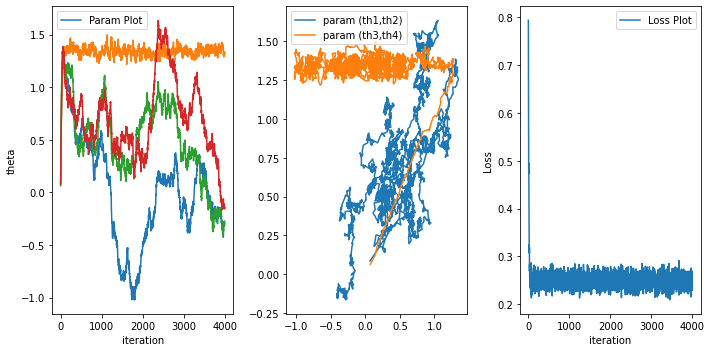

In [163]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()

### c1=0.05(Medium movement) delta=0.1+ (Medium fluctuation)

In [164]:
progress=[];
theta=[0,0,0,0];
thdata=[];

c1=0.05
delta=6
nshot=3000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(4000):
    delta=random.random()+0.1
    theta=theta-SPSA(1,theta,c1,delta,nshot)
    print(ep,"th iteration L=",lossCal2qubit(1,theta,nshot))
    progress.append(lossCal2qubit(1,theta,nshot))
    thdata.append(theta)

0 th iteration L= 0.7293333333333334
1 th iteration L= 0.75
2 th iteration L= 0.6993333333333334
3 th iteration L= 0.604
4 th iteration L= 0.5
5 th iteration L= 0.4946666666666667
6 th iteration L= 0.45466666666666666
7 th iteration L= 0.42000000000000004
8 th iteration L= 0.41533333333333333
9 th iteration L= 0.4086666666666666
10 th iteration L= 0.4013333333333333
11 th iteration L= 0.3966666666666666
12 th iteration L= 0.4066666666666666
13 th iteration L= 0.3786666666666667
14 th iteration L= 0.32799999999999996
15 th iteration L= 0.31799999999999995
16 th iteration L= 0.29200000000000004
17 th iteration L= 0.29666666666666663
18 th iteration L= 0.29066666666666663
19 th iteration L= 0.2553333333333333
20 th iteration L= 0.244
21 th iteration L= 0.2593333333333333
22 th iteration L= 0.258
23 th iteration L= 0.23533333333333328
24 th iteration L= 0.2593333333333333
25 th iteration L= 0.248
26 th iteration L= 0.2426666666666667
27 th iteration L= 0.2546666666666667
28 th iteration L=

241 th iteration L= 0.25
242 th iteration L= 0.242
243 th iteration L= 0.2366666666666667
244 th iteration L= 0.244
245 th iteration L= 0.2546666666666667
246 th iteration L= 0.2393333333333333
247 th iteration L= 0.2666666666666667
248 th iteration L= 0.26
249 th iteration L= 0.2546666666666667
250 th iteration L= 0.266
251 th iteration L= 0.26
252 th iteration L= 0.2573333333333333
253 th iteration L= 0.22399999999999998
254 th iteration L= 0.27
255 th iteration L= 0.22999999999999998
256 th iteration L= 0.242
257 th iteration L= 0.2393333333333333
258 th iteration L= 0.258
259 th iteration L= 0.278
260 th iteration L= 0.2513333333333333
261 th iteration L= 0.2533333333333333
262 th iteration L= 0.2673333333333333
263 th iteration L= 0.2733333333333333
264 th iteration L= 0.2466666666666667
265 th iteration L= 0.2606666666666667
266 th iteration L= 0.2546666666666667
267 th iteration L= 0.2413333333333333
268 th iteration L= 0.24
269 th iteration L= 0.256
270 th iteration L= 0.243333

478 th iteration L= 0.252
479 th iteration L= 0.2306666666666667
480 th iteration L= 0.2406666666666667
481 th iteration L= 0.2533333333333333
482 th iteration L= 0.246
483 th iteration L= 0.22333333333333338
484 th iteration L= 0.2433333333333333
485 th iteration L= 0.272
486 th iteration L= 0.2473333333333333
487 th iteration L= 0.256
488 th iteration L= 0.262
489 th iteration L= 0.258
490 th iteration L= 0.26
491 th iteration L= 0.2426666666666667
492 th iteration L= 0.2586666666666667
493 th iteration L= 0.2466666666666667
494 th iteration L= 0.2573333333333333
495 th iteration L= 0.23733333333333329
496 th iteration L= 0.23533333333333328
497 th iteration L= 0.248
498 th iteration L= 0.2666666666666667
499 th iteration L= 0.2453333333333333
500 th iteration L= 0.2466666666666667
501 th iteration L= 0.23399999999999999
502 th iteration L= 0.23333333333333328
503 th iteration L= 0.2386666666666667
504 th iteration L= 0.2526666666666667
505 th iteration L= 0.2586666666666667
506 th i

712 th iteration L= 0.2346666666666667
713 th iteration L= 0.2553333333333333
714 th iteration L= 0.24
715 th iteration L= 0.2506666666666667
716 th iteration L= 0.2433333333333333
717 th iteration L= 0.278
718 th iteration L= 0.2473333333333333
719 th iteration L= 0.22933333333333328
720 th iteration L= 0.242
721 th iteration L= 0.2526666666666667
722 th iteration L= 0.25
723 th iteration L= 0.2466666666666667
724 th iteration L= 0.266
725 th iteration L= 0.2393333333333333
726 th iteration L= 0.2733333333333333
727 th iteration L= 0.22199999999999998
728 th iteration L= 0.2526666666666667
729 th iteration L= 0.24
730 th iteration L= 0.2573333333333333
731 th iteration L= 0.2413333333333333
732 th iteration L= 0.22666666666666668
733 th iteration L= 0.2486666666666667
734 th iteration L= 0.22999999999999998
735 th iteration L= 0.22933333333333328
736 th iteration L= 0.2433333333333333
737 th iteration L= 0.2393333333333333
738 th iteration L= 0.252
739 th iteration L= 0.24266666666666

945 th iteration L= 0.2553333333333333
946 th iteration L= 0.2426666666666667
947 th iteration L= 0.2606666666666667
948 th iteration L= 0.2533333333333333
949 th iteration L= 0.23533333333333328
950 th iteration L= 0.2386666666666667
951 th iteration L= 0.2626666666666667
952 th iteration L= 0.2513333333333333
953 th iteration L= 0.2446666666666667
954 th iteration L= 0.2493333333333333
955 th iteration L= 0.2473333333333333
956 th iteration L= 0.252
957 th iteration L= 0.2526666666666667
958 th iteration L= 0.2586666666666667
959 th iteration L= 0.244
960 th iteration L= 0.2626666666666667
961 th iteration L= 0.2453333333333333
962 th iteration L= 0.23199999999999998
963 th iteration L= 0.272
964 th iteration L= 0.2433333333333333
965 th iteration L= 0.244
966 th iteration L= 0.22999999999999998
967 th iteration L= 0.2366666666666667
968 th iteration L= 0.25
969 th iteration L= 0.2713333333333333
970 th iteration L= 0.2306666666666667
971 th iteration L= 0.2673333333333333
972 th ite

1175 th iteration L= 0.2386666666666667
1176 th iteration L= 0.2673333333333333
1177 th iteration L= 0.2506666666666667
1178 th iteration L= 0.2426666666666667
1179 th iteration L= 0.238
1180 th iteration L= 0.248
1181 th iteration L= 0.2473333333333333
1182 th iteration L= 0.23733333333333329
1183 th iteration L= 0.248
1184 th iteration L= 0.23399999999999999
1185 th iteration L= 0.2606666666666667
1186 th iteration L= 0.2473333333333333
1187 th iteration L= 0.2553333333333333
1188 th iteration L= 0.2446666666666667
1189 th iteration L= 0.2533333333333333
1190 th iteration L= 0.2486666666666667
1191 th iteration L= 0.2586666666666667
1192 th iteration L= 0.242
1193 th iteration L= 0.24
1194 th iteration L= 0.2573333333333333
1195 th iteration L= 0.252
1196 th iteration L= 0.2433333333333333
1197 th iteration L= 0.2473333333333333
1198 th iteration L= 0.262
1199 th iteration L= 0.2453333333333333
1200 th iteration L= 0.21866666666666668
1201 th iteration L= 0.2306666666666667
1202 th i

1401 th iteration L= 0.2513333333333333
1402 th iteration L= 0.2486666666666667
1403 th iteration L= 0.2453333333333333
1404 th iteration L= 0.2733333333333333
1405 th iteration L= 0.252
1406 th iteration L= 0.2673333333333333
1407 th iteration L= 0.23533333333333328
1408 th iteration L= 0.2653333333333333
1409 th iteration L= 0.2706666666666667
1410 th iteration L= 0.2573333333333333
1411 th iteration L= 0.246
1412 th iteration L= 0.2613333333333333
1413 th iteration L= 0.26
1414 th iteration L= 0.23399999999999999
1415 th iteration L= 0.264
1416 th iteration L= 0.2526666666666667
1417 th iteration L= 0.2613333333333333
1418 th iteration L= 0.2566666666666667
1419 th iteration L= 0.2586666666666667
1420 th iteration L= 0.278
1421 th iteration L= 0.23533333333333328
1422 th iteration L= 0.2653333333333333
1423 th iteration L= 0.2433333333333333
1424 th iteration L= 0.25
1425 th iteration L= 0.27
1426 th iteration L= 0.2513333333333333
1427 th iteration L= 0.2726666666666666
1428 th ite

1635 th iteration L= 0.2433333333333333
1636 th iteration L= 0.2433333333333333
1637 th iteration L= 0.252
1638 th iteration L= 0.2733333333333333
1639 th iteration L= 0.23133333333333328
1640 th iteration L= 0.244
1641 th iteration L= 0.22866666666666668
1642 th iteration L= 0.246
1643 th iteration L= 0.2306666666666667
1644 th iteration L= 0.2566666666666667
1645 th iteration L= 0.2273333333333334
1646 th iteration L= 0.2493333333333333
1647 th iteration L= 0.2393333333333333
1648 th iteration L= 0.2566666666666667
1649 th iteration L= 0.2453333333333333
1650 th iteration L= 0.2306666666666667
1651 th iteration L= 0.2446666666666667
1652 th iteration L= 0.2273333333333334
1653 th iteration L= 0.2326666666666667
1654 th iteration L= 0.264
1655 th iteration L= 0.2546666666666667
1656 th iteration L= 0.2393333333333333
1657 th iteration L= 0.246
1658 th iteration L= 0.2433333333333333
1659 th iteration L= 0.2593333333333333
1660 th iteration L= 0.2573333333333333
1661 th iteration L= 0.

1862 th iteration L= 0.254
1863 th iteration L= 0.2493333333333333
1864 th iteration L= 0.2413333333333333
1865 th iteration L= 0.23733333333333329
1866 th iteration L= 0.242
1867 th iteration L= 0.2433333333333333
1868 th iteration L= 0.22399999999999998
1869 th iteration L= 0.2726666666666666
1870 th iteration L= 0.23733333333333329
1871 th iteration L= 0.2386666666666667
1872 th iteration L= 0.248
1873 th iteration L= 0.266
1874 th iteration L= 0.2553333333333333
1875 th iteration L= 0.23533333333333328
1876 th iteration L= 0.252
1877 th iteration L= 0.2553333333333333
1878 th iteration L= 0.2326666666666667
1879 th iteration L= 0.2406666666666667
1880 th iteration L= 0.2666666666666667
1881 th iteration L= 0.252
1882 th iteration L= 0.2546666666666667
1883 th iteration L= 0.244
1884 th iteration L= 0.2646666666666667
1885 th iteration L= 0.22266666666666668
1886 th iteration L= 0.2533333333333333
1887 th iteration L= 0.2453333333333333
1888 th iteration L= 0.2493333333333333
1889 t

2091 th iteration L= 0.2686666666666667
2092 th iteration L= 0.2406666666666667
2093 th iteration L= 0.2466666666666667
2094 th iteration L= 0.2366666666666667
2095 th iteration L= 0.254
2096 th iteration L= 0.264
2097 th iteration L= 0.236
2098 th iteration L= 0.266
2099 th iteration L= 0.2486666666666667
2100 th iteration L= 0.252
2101 th iteration L= 0.254
2102 th iteration L= 0.2506666666666667
2103 th iteration L= 0.254
2104 th iteration L= 0.2533333333333333
2105 th iteration L= 0.256
2106 th iteration L= 0.27
2107 th iteration L= 0.21866666666666668
2108 th iteration L= 0.28
2109 th iteration L= 0.2553333333333333
2110 th iteration L= 0.22266666666666668
2111 th iteration L= 0.2366666666666667
2112 th iteration L= 0.2426666666666667
2113 th iteration L= 0.262
2114 th iteration L= 0.2766666666666666
2115 th iteration L= 0.2466666666666667
2116 th iteration L= 0.236
2117 th iteration L= 0.2453333333333333
2118 th iteration L= 0.2613333333333333
2119 th iteration L= 0.2493333333333

2318 th iteration L= 0.2526666666666667
2319 th iteration L= 0.242
2320 th iteration L= 0.2573333333333333
2321 th iteration L= 0.25
2322 th iteration L= 0.252
2323 th iteration L= 0.2586666666666667
2324 th iteration L= 0.23399999999999999
2325 th iteration L= 0.2613333333333333
2326 th iteration L= 0.2446666666666667
2327 th iteration L= 0.22999999999999998
2328 th iteration L= 0.22999999999999998
2329 th iteration L= 0.2533333333333333
2330 th iteration L= 0.248
2331 th iteration L= 0.23133333333333328
2332 th iteration L= 0.22866666666666668
2333 th iteration L= 0.2493333333333333
2334 th iteration L= 0.2453333333333333
2335 th iteration L= 0.22533333333333339
2336 th iteration L= 0.2566666666666667
2337 th iteration L= 0.2386666666666667
2338 th iteration L= 0.2473333333333333
2339 th iteration L= 0.2306666666666667
2340 th iteration L= 0.2506666666666667
2341 th iteration L= 0.2553333333333333
2342 th iteration L= 0.2613333333333333
2343 th iteration L= 0.26
2344 th iteration L= 

2545 th iteration L= 0.2473333333333333
2546 th iteration L= 0.2806666666666666
2547 th iteration L= 0.2393333333333333
2548 th iteration L= 0.23133333333333328
2549 th iteration L= 0.2506666666666667
2550 th iteration L= 0.23399999999999999
2551 th iteration L= 0.2326666666666667
2552 th iteration L= 0.2466666666666667
2553 th iteration L= 0.2593333333333333
2554 th iteration L= 0.22866666666666668
2555 th iteration L= 0.2533333333333333
2556 th iteration L= 0.22866666666666668
2557 th iteration L= 0.2713333333333333
2558 th iteration L= 0.2453333333333333
2559 th iteration L= 0.2573333333333333
2560 th iteration L= 0.2526666666666667
2561 th iteration L= 0.2413333333333333
2562 th iteration L= 0.2413333333333333
2563 th iteration L= 0.246
2564 th iteration L= 0.2586666666666667
2565 th iteration L= 0.268
2566 th iteration L= 0.252
2567 th iteration L= 0.244
2568 th iteration L= 0.2633333333333333
2569 th iteration L= 0.2646666666666667
2570 th iteration L= 0.2493333333333333
2571 th 

2772 th iteration L= 0.2666666666666667
2773 th iteration L= 0.2646666666666667
2774 th iteration L= 0.2513333333333333
2775 th iteration L= 0.252
2776 th iteration L= 0.2386666666666667
2777 th iteration L= 0.2646666666666667
2778 th iteration L= 0.2553333333333333
2779 th iteration L= 0.268
2780 th iteration L= 0.2506666666666667
2781 th iteration L= 0.252
2782 th iteration L= 0.2553333333333333
2783 th iteration L= 0.2606666666666667
2784 th iteration L= 0.248
2785 th iteration L= 0.268
2786 th iteration L= 0.2526666666666667
2787 th iteration L= 0.2713333333333333
2788 th iteration L= 0.25
2789 th iteration L= 0.2546666666666667
2790 th iteration L= 0.2566666666666667
2791 th iteration L= 0.238
2792 th iteration L= 0.2326666666666667
2793 th iteration L= 0.2306666666666667
2794 th iteration L= 0.236
2795 th iteration L= 0.2406666666666667
2796 th iteration L= 0.2606666666666667
2797 th iteration L= 0.24
2798 th iteration L= 0.242
2799 th iteration L= 0.242
2800 th iteration L= 0.24

2998 th iteration L= 0.2493333333333333
2999 th iteration L= 0.2366666666666667
3000 th iteration L= 0.2413333333333333
3001 th iteration L= 0.2433333333333333
3002 th iteration L= 0.2673333333333333
3003 th iteration L= 0.252
3004 th iteration L= 0.2533333333333333
3005 th iteration L= 0.2406666666666667
3006 th iteration L= 0.28200000000000003
3007 th iteration L= 0.2686666666666667
3008 th iteration L= 0.2393333333333333
3009 th iteration L= 0.2493333333333333
3010 th iteration L= 0.2386666666666667
3011 th iteration L= 0.238
3012 th iteration L= 0.2553333333333333
3013 th iteration L= 0.23333333333333328
3014 th iteration L= 0.2613333333333333
3015 th iteration L= 0.2533333333333333
3016 th iteration L= 0.22199999999999998
3017 th iteration L= 0.2573333333333333
3018 th iteration L= 0.2413333333333333
3019 th iteration L= 0.2673333333333333
3020 th iteration L= 0.22999999999999998
3021 th iteration L= 0.2573333333333333
3022 th iteration L= 0.252
3023 th iteration L= 0.238666666666

3220 th iteration L= 0.2526666666666667
3221 th iteration L= 0.254
3222 th iteration L= 0.246
3223 th iteration L= 0.2473333333333333
3224 th iteration L= 0.2473333333333333
3225 th iteration L= 0.252
3226 th iteration L= 0.2573333333333333
3227 th iteration L= 0.254
3228 th iteration L= 0.23533333333333328
3229 th iteration L= 0.2446666666666667
3230 th iteration L= 0.268
3231 th iteration L= 0.2446666666666667
3232 th iteration L= 0.274
3233 th iteration L= 0.2713333333333333
3234 th iteration L= 0.2686666666666667
3235 th iteration L= 0.2513333333333333
3236 th iteration L= 0.2573333333333333
3237 th iteration L= 0.256
3238 th iteration L= 0.2493333333333333
3239 th iteration L= 0.2573333333333333
3240 th iteration L= 0.2466666666666667
3241 th iteration L= 0.26
3242 th iteration L= 0.272
3243 th iteration L= 0.2433333333333333
3244 th iteration L= 0.244
3245 th iteration L= 0.266
3246 th iteration L= 0.2713333333333333
3247 th iteration L= 0.26
3248 th iteration L= 0.262
3249 th it

3449 th iteration L= 0.22799999999999998
3450 th iteration L= 0.2346666666666667
3451 th iteration L= 0.242
3452 th iteration L= 0.23199999999999998
3453 th iteration L= 0.2626666666666667
3454 th iteration L= 0.2726666666666666
3455 th iteration L= 0.254
3456 th iteration L= 0.2533333333333333
3457 th iteration L= 0.2506666666666667
3458 th iteration L= 0.2846666666666666
3459 th iteration L= 0.254
3460 th iteration L= 0.27
3461 th iteration L= 0.2413333333333333
3462 th iteration L= 0.2606666666666667
3463 th iteration L= 0.238
3464 th iteration L= 0.2606666666666667
3465 th iteration L= 0.2486666666666667
3466 th iteration L= 0.2413333333333333
3467 th iteration L= 0.2473333333333333
3468 th iteration L= 0.2566666666666667
3469 th iteration L= 0.2433333333333333
3470 th iteration L= 0.244
3471 th iteration L= 0.262
3472 th iteration L= 0.2473333333333333
3473 th iteration L= 0.2626666666666667
3474 th iteration L= 0.2593333333333333
3475 th iteration L= 0.244
3476 th iteration L= 0.

3680 th iteration L= 0.2473333333333333
3681 th iteration L= 0.24
3682 th iteration L= 0.2613333333333333
3683 th iteration L= 0.2386666666666667
3684 th iteration L= 0.252
3685 th iteration L= 0.2593333333333333
3686 th iteration L= 0.2673333333333333
3687 th iteration L= 0.2406666666666667
3688 th iteration L= 0.2713333333333333
3689 th iteration L= 0.22933333333333328
3690 th iteration L= 0.264
3691 th iteration L= 0.23333333333333328
3692 th iteration L= 0.2393333333333333
3693 th iteration L= 0.2646666666666667
3694 th iteration L= 0.23199999999999998
3695 th iteration L= 0.2493333333333333
3696 th iteration L= 0.2553333333333333
3697 th iteration L= 0.2493333333333333
3698 th iteration L= 0.2546666666666667
3699 th iteration L= 0.2406666666666667
3700 th iteration L= 0.23133333333333328
3701 th iteration L= 0.2506666666666667
3702 th iteration L= 0.2613333333333333
3703 th iteration L= 0.2466666666666667
3704 th iteration L= 0.2633333333333333
3705 th iteration L= 0.272
3706 th i

3904 th iteration L= 0.23333333333333328
3905 th iteration L= 0.2326666666666667
3906 th iteration L= 0.2566666666666667
3907 th iteration L= 0.2326666666666667
3908 th iteration L= 0.2306666666666667
3909 th iteration L= 0.236
3910 th iteration L= 0.2466666666666667
3911 th iteration L= 0.23533333333333328
3912 th iteration L= 0.2433333333333333
3913 th iteration L= 0.246
3914 th iteration L= 0.252
3915 th iteration L= 0.2533333333333333
3916 th iteration L= 0.2653333333333333
3917 th iteration L= 0.236
3918 th iteration L= 0.2686666666666667
3919 th iteration L= 0.2646666666666667
3920 th iteration L= 0.2553333333333333
3921 th iteration L= 0.2406666666666667
3922 th iteration L= 0.244
3923 th iteration L= 0.2626666666666667
3924 th iteration L= 0.25
3925 th iteration L= 0.2773333333333333
3926 th iteration L= 0.2586666666666667
3927 th iteration L= 0.236
3928 th iteration L= 0.2413333333333333
3929 th iteration L= 0.22599999999999998
3930 th iteration L= 0.2573333333333333
3931 th i

After 1000 iteration we have theta = [4.883607   1.27858874 3.88082156 0.17275324]


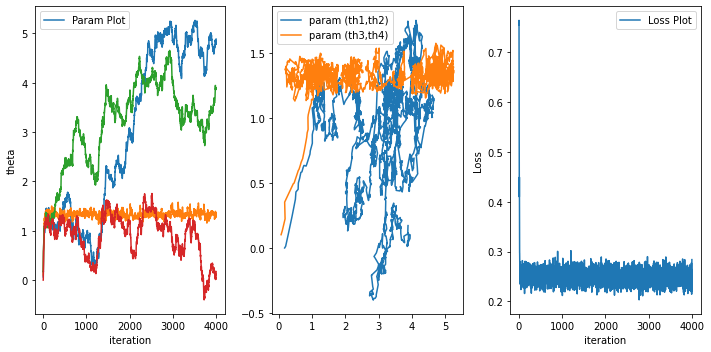

In [165]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()

### c1=0.05(Medium movement) delta=0+ (Large fluctuation)

In [166]:
progress=[];
theta=[0,0,0,0];
thdata=[];

c1=0.05
delta=6
nshot=3000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(4000):
    delta=random.random()
    theta=theta-SPSA(1,theta,c1,delta,nshot)
    print(ep,"th iteration L=",lossCal2qubit(1,theta,nshot))
    progress.append(lossCal2qubit(1,theta,nshot))
    thdata.append(theta)

0 th iteration L= 0.7386666666666667
1 th iteration L= 0.7146666666666667
2 th iteration L= 0.648
3 th iteration L= 0.6173333333333333
4 th iteration L= 0.626
5 th iteration L= 0.5626666666666666
6 th iteration L= 0.5226666666666666
7 th iteration L= 0.4973333333333333
8 th iteration L= 0.42400000000000004
9 th iteration L= 0.4073333333333333
10 th iteration L= 0.3806666666666667
11 th iteration L= 0.31733333333333336
12 th iteration L= 0.29600000000000004
13 th iteration L= 0.256
14 th iteration L= 0.2833333333333333
15 th iteration L= 0.252
16 th iteration L= 0.2506666666666667
17 th iteration L= 0.2406666666666667
18 th iteration L= 0.2613333333333333
19 th iteration L= 0.2673333333333333
20 th iteration L= 0.2646666666666667
21 th iteration L= 0.966
22 th iteration L= 0.8366666666666667
23 th iteration L= 0.8073333333333333
24 th iteration L= 0.7473333333333334
25 th iteration L= 0.44399999999999995
26 th iteration L= 0.4613333333333334
27 th iteration L= 0.46399999999999997
28 th 

233 th iteration L= 0.2593333333333333
234 th iteration L= 0.254
235 th iteration L= 0.2586666666666667
236 th iteration L= 0.22933333333333328
237 th iteration L= 0.23399999999999999
238 th iteration L= 0.2393333333333333
239 th iteration L= 0.2706666666666667
240 th iteration L= 0.26
241 th iteration L= 0.22999999999999998
242 th iteration L= 0.2626666666666667
243 th iteration L= 0.2473333333333333
244 th iteration L= 0.2393333333333333
245 th iteration L= 0.2433333333333333
246 th iteration L= 0.268
247 th iteration L= 0.2493333333333333
248 th iteration L= 0.2486666666666667
249 th iteration L= 0.2766666666666666
250 th iteration L= 0.236
251 th iteration L= 0.268
252 th iteration L= 0.272
253 th iteration L= 0.2473333333333333
254 th iteration L= 0.2453333333333333
255 th iteration L= 0.22799999999999998
256 th iteration L= 0.24
257 th iteration L= 0.2706666666666667
258 th iteration L= 0.2513333333333333
259 th iteration L= 0.2613333333333333
260 th iteration L= 0.26133333333333

467 th iteration L= 0.3546666666666667
468 th iteration L= 0.3393333333333334
469 th iteration L= 0.3533333333333334
470 th iteration L= 0.3473333333333334
471 th iteration L= 0.30466666666666664
472 th iteration L= 0.3393333333333334
473 th iteration L= 0.32066666666666666
474 th iteration L= 0.244
475 th iteration L= 0.2513333333333333
476 th iteration L= 0.2473333333333333
477 th iteration L= 0.266
478 th iteration L= 0.2506666666666667
479 th iteration L= 0.2473333333333333
480 th iteration L= 0.28200000000000003
481 th iteration L= 0.266
482 th iteration L= 0.2433333333333333
483 th iteration L= 0.2646666666666667
484 th iteration L= 0.2546666666666667
485 th iteration L= 0.2586666666666667
486 th iteration L= 0.2546666666666667
487 th iteration L= 0.25
488 th iteration L= 0.2473333333333333
489 th iteration L= 0.256
490 th iteration L= 0.2606666666666667
491 th iteration L= 0.2593333333333333
492 th iteration L= 0.2346666666666667
493 th iteration L= 0.2426666666666667
494 th ite

697 th iteration L= 0.2586666666666667
698 th iteration L= 0.2686666666666667
699 th iteration L= 0.2566666666666667
700 th iteration L= 0.2493333333333333
701 th iteration L= 0.2633333333333333
702 th iteration L= 0.2533333333333333
703 th iteration L= 0.2666666666666667
704 th iteration L= 0.2593333333333333
705 th iteration L= 0.23733333333333329
706 th iteration L= 0.242
707 th iteration L= 0.26
708 th iteration L= 0.2393333333333333
709 th iteration L= 0.2326666666666667
710 th iteration L= 0.22266666666666668
711 th iteration L= 0.23333333333333328
712 th iteration L= 0.22933333333333328
713 th iteration L= 0.2606666666666667
714 th iteration L= 0.23333333333333328
715 th iteration L= 0.252
716 th iteration L= 0.2566666666666667
717 th iteration L= 0.2573333333333333
718 th iteration L= 0.2446666666666667
719 th iteration L= 0.2533333333333333
720 th iteration L= 0.2393333333333333
721 th iteration L= 0.2473333333333333
722 th iteration L= 0.2673333333333333
723 th iteration L= 0

930 th iteration L= 0.2546666666666667
931 th iteration L= 0.2526666666666667
932 th iteration L= 0.2326666666666667
933 th iteration L= 0.264
934 th iteration L= 0.2626666666666667
935 th iteration L= 0.258
936 th iteration L= 0.266
937 th iteration L= 0.268
938 th iteration L= 0.2753333333333333
939 th iteration L= 0.262
940 th iteration L= 0.22533333333333339
941 th iteration L= 0.266
942 th iteration L= 0.23533333333333328
943 th iteration L= 0.2513333333333333
944 th iteration L= 0.2453333333333333
945 th iteration L= 0.2466666666666667
946 th iteration L= 0.248
947 th iteration L= 0.2586666666666667
948 th iteration L= 0.25
949 th iteration L= 0.244
950 th iteration L= 0.2546666666666667
951 th iteration L= 0.2426666666666667
952 th iteration L= 0.262
953 th iteration L= 0.986
954 th iteration L= 0.9286666666666666
955 th iteration L= 0.846
956 th iteration L= 0.8173333333333334
957 th iteration L= 0.792
958 th iteration L= 0.748
959 th iteration L= 0.5206666666666666
960 th iter

1160 th iteration L= 0.27
1161 th iteration L= 0.2473333333333333
1162 th iteration L= 0.2586666666666667
1163 th iteration L= 0.238
1164 th iteration L= 0.244
1165 th iteration L= 0.238
1166 th iteration L= 0.2546666666666667
1167 th iteration L= 0.2673333333333333
1168 th iteration L= 0.22266666666666668
1169 th iteration L= 0.2553333333333333
1170 th iteration L= 0.2593333333333333
1171 th iteration L= 0.22933333333333328
1172 th iteration L= 0.23399999999999999
1173 th iteration L= 0.2486666666666667
1174 th iteration L= 0.2653333333333333
1175 th iteration L= 0.2393333333333333
1176 th iteration L= 0.2666666666666667
1177 th iteration L= 0.2466666666666667
1178 th iteration L= 0.2593333333333333
1179 th iteration L= 0.2493333333333333
1180 th iteration L= 0.23199999999999998
1181 th iteration L= 0.2446666666666667
1182 th iteration L= 0.2453333333333333
1183 th iteration L= 0.2706666666666667
1184 th iteration L= 0.262
1185 th iteration L= 0.2406666666666667
1186 th iteration L= 0

1384 th iteration L= 0.236
1385 th iteration L= 0.23333333333333328
1386 th iteration L= 0.2526666666666667
1387 th iteration L= 0.2546666666666667
1388 th iteration L= 0.2673333333333333
1389 th iteration L= 0.2366666666666667
1390 th iteration L= 0.264
1391 th iteration L= 0.2506666666666667
1392 th iteration L= 0.2366666666666667
1393 th iteration L= 0.242
1394 th iteration L= 0.2406666666666667
1395 th iteration L= 0.2486666666666667
1396 th iteration L= 0.2653333333333333
1397 th iteration L= 0.24
1398 th iteration L= 0.2326666666666667
1399 th iteration L= 0.2546666666666667
1400 th iteration L= 0.2493333333333333
1401 th iteration L= 0.2713333333333333
1402 th iteration L= 0.2606666666666667
1403 th iteration L= 0.2426666666666667
1404 th iteration L= 0.242
1405 th iteration L= 0.2513333333333333
1406 th iteration L= 0.2366666666666667
1407 th iteration L= 0.2446666666666667
1408 th iteration L= 0.2466666666666667
1409 th iteration L= 0.22866666666666668
1410 th iteration L= 0.2

1612 th iteration L= 0.2553333333333333
1613 th iteration L= 0.25
1614 th iteration L= 0.23133333333333328
1615 th iteration L= 0.262
1616 th iteration L= 0.2526666666666667
1617 th iteration L= 0.22999999999999998
1618 th iteration L= 0.2433333333333333
1619 th iteration L= 0.2606666666666667
1620 th iteration L= 0.24
1621 th iteration L= 0.2613333333333333
1622 th iteration L= 0.258
1623 th iteration L= 0.2553333333333333
1624 th iteration L= 0.2773333333333333
1625 th iteration L= 0.2526666666666667
1626 th iteration L= 0.258
1627 th iteration L= 0.248
1628 th iteration L= 0.2666666666666667
1629 th iteration L= 0.2686666666666667
1630 th iteration L= 0.31333333333333335
1631 th iteration L= 0.32866666666666666
1632 th iteration L= 0.31399999999999995
1633 th iteration L= 0.2853333333333333
1634 th iteration L= 0.276
1635 th iteration L= 0.23399999999999999
1636 th iteration L= 0.2466666666666667
1637 th iteration L= 0.25
1638 th iteration L= 0.23333333333333328
1639 th iteration L=

1836 th iteration L= 0.2886666666666666
1837 th iteration L= 0.262
1838 th iteration L= 0.276
1839 th iteration L= 0.2726666666666666
1840 th iteration L= 0.22799999999999998
1841 th iteration L= 0.2513333333333333
1842 th iteration L= 0.248
1843 th iteration L= 0.2573333333333333
1844 th iteration L= 0.22599999999999998
1845 th iteration L= 0.22533333333333339
1846 th iteration L= 0.254
1847 th iteration L= 0.2466666666666667
1848 th iteration L= 0.25
1849 th iteration L= 0.2553333333333333
1850 th iteration L= 0.246
1851 th iteration L= 0.24
1852 th iteration L= 0.27
1853 th iteration L= 0.2493333333333333
1854 th iteration L= 0.2393333333333333
1855 th iteration L= 0.272
1856 th iteration L= 0.236
1857 th iteration L= 0.258
1858 th iteration L= 0.2406666666666667
1859 th iteration L= 0.2586666666666667
1860 th iteration L= 0.2593333333333333
1861 th iteration L= 0.252
1862 th iteration L= 0.2506666666666667
1863 th iteration L= 0.26
1864 th iteration L= 0.2593333333333333
1865 th it

2066 th iteration L= 1.0953333333333333
2067 th iteration L= 1.06
2068 th iteration L= 0.5
2069 th iteration L= 0.44399999999999995
2070 th iteration L= 0.8260000000000001
2071 th iteration L= 0.7933333333333333
2072 th iteration L= 0.774
2073 th iteration L= 0.56
2074 th iteration L= 0.5106666666666666
2075 th iteration L= 0.4886666666666667
2076 th iteration L= 0.3666666666666667
2077 th iteration L= 0.3413333333333334
2078 th iteration L= 0.32533333333333336
2079 th iteration L= 0.356
2080 th iteration L= 0.3406666666666667
2081 th iteration L= 0.30000000000000004
2082 th iteration L= 0.29533333333333334
2083 th iteration L= 0.32799999999999996
2084 th iteration L= 0.29133333333333333
2085 th iteration L= 0.252
2086 th iteration L= 0.2686666666666667
2087 th iteration L= 0.2813333333333333
2088 th iteration L= 0.31466666666666665
2089 th iteration L= 0.29000000000000004
2090 th iteration L= 0.4666666666666667
2091 th iteration L= 0.44733333333333336
2092 th iteration L= 0.2606666666

2292 th iteration L= 0.43600000000000005
2293 th iteration L= 0.396
2294 th iteration L= 0.396
2295 th iteration L= 0.3666666666666667
2296 th iteration L= 0.29533333333333334
2297 th iteration L= 0.29266666666666663
2298 th iteration L= 0.29800000000000004
2299 th iteration L= 0.2793333333333333
2300 th iteration L= 0.2806666666666666
2301 th iteration L= 0.2413333333333333
2302 th iteration L= 0.22199999999999998
2303 th iteration L= 0.246
2304 th iteration L= 0.244
2305 th iteration L= 0.22066666666666668
2306 th iteration L= 0.23199999999999998
2307 th iteration L= 0.2493333333333333
2308 th iteration L= 0.2626666666666667
2309 th iteration L= 0.2553333333333333
2310 th iteration L= 0.2526666666666667
2311 th iteration L= 0.25
2312 th iteration L= 0.2486666666666667
2313 th iteration L= 0.2606666666666667
2314 th iteration L= 0.2586666666666667
2315 th iteration L= 0.2626666666666667
2316 th iteration L= 0.2726666666666666
2317 th iteration L= 0.2753333333333333
2318 th iteration L

2517 th iteration L= 0.2606666666666667
2518 th iteration L= 0.23399999999999999
2519 th iteration L= 0.24
2520 th iteration L= 0.24
2521 th iteration L= 0.2486666666666667
2522 th iteration L= 0.2433333333333333
2523 th iteration L= 0.2546666666666667
2524 th iteration L= 0.2393333333333333
2525 th iteration L= 0.2526666666666667
2526 th iteration L= 0.2446666666666667
2527 th iteration L= 0.22799999999999998
2528 th iteration L= 0.2426666666666667
2529 th iteration L= 0.266
2530 th iteration L= 0.2653333333333333
2531 th iteration L= 0.22999999999999998
2532 th iteration L= 0.2513333333333333
2533 th iteration L= 0.2533333333333333
2534 th iteration L= 0.264
2535 th iteration L= 0.2526666666666667
2536 th iteration L= 0.2466666666666667
2537 th iteration L= 0.2393333333333333
2538 th iteration L= 0.258
2539 th iteration L= 0.2593333333333333
2540 th iteration L= 0.2386666666666667
2541 th iteration L= 0.266
2542 th iteration L= 0.2573333333333333
2543 th iteration L= 0.266
2544 th it

2746 th iteration L= 0.25
2747 th iteration L= 0.264
2748 th iteration L= 0.26
2749 th iteration L= 0.2446666666666667
2750 th iteration L= 0.2486666666666667
2751 th iteration L= 0.2433333333333333
2752 th iteration L= 0.2446666666666667
2753 th iteration L= 0.2666666666666667
2754 th iteration L= 0.268
2755 th iteration L= 0.2513333333333333
2756 th iteration L= 0.2466666666666667
2757 th iteration L= 0.256
2758 th iteration L= 0.28400000000000003
2759 th iteration L= 0.268
2760 th iteration L= 0.2506666666666667
2761 th iteration L= 0.2546666666666667
2762 th iteration L= 0.2706666666666667
2763 th iteration L= 0.244
2764 th iteration L= 0.278
2765 th iteration L= 0.256
2766 th iteration L= 0.2406666666666667
2767 th iteration L= 0.252
2768 th iteration L= 0.2506666666666667
2769 th iteration L= 0.2613333333333333
2770 th iteration L= 0.2466666666666667
2771 th iteration L= 0.2346666666666667
2772 th iteration L= 0.2526666666666667
2773 th iteration L= 0.28600000000000003
2774 th it

2971 th iteration L= 0.2513333333333333
2972 th iteration L= 0.2593333333333333
2973 th iteration L= 0.2473333333333333
2974 th iteration L= 0.2533333333333333
2975 th iteration L= 0.2446666666666667
2976 th iteration L= 0.2526666666666667
2977 th iteration L= 0.23733333333333329
2978 th iteration L= 0.238
2979 th iteration L= 0.2426666666666667
2980 th iteration L= 0.24
2981 th iteration L= 0.268
2982 th iteration L= 0.2553333333333333
2983 th iteration L= 0.3513333333333334
2984 th iteration L= 0.3433333333333334
2985 th iteration L= 0.33266666666666667
2986 th iteration L= 0.32066666666666666
2987 th iteration L= 0.33333333333333337
2988 th iteration L= 0.31666666666666665
2989 th iteration L= 0.3413333333333334
2990 th iteration L= 0.30400000000000005
2991 th iteration L= 0.30333333333333334
2992 th iteration L= 0.3426666666666667
2993 th iteration L= 0.32266666666666666
2994 th iteration L= 0.29466666666666663
2995 th iteration L= 0.30466666666666664
2996 th iteration L= 0.2940000

3198 th iteration L= 0.244
3199 th iteration L= 0.2486666666666667
3200 th iteration L= 0.21999999999999997
3201 th iteration L= 0.22999999999999998
3202 th iteration L= 0.23399999999999999
3203 th iteration L= 0.2506666666666667
3204 th iteration L= 0.256
3205 th iteration L= 0.2533333333333333
3206 th iteration L= 0.24
3207 th iteration L= 0.2546666666666667
3208 th iteration L= 0.2546666666666667
3209 th iteration L= 0.27
3210 th iteration L= 0.246
3211 th iteration L= 0.2706666666666667
3212 th iteration L= 0.2446666666666667
3213 th iteration L= 0.2546666666666667
3214 th iteration L= 0.2553333333333333
3215 th iteration L= 0.23133333333333328
3216 th iteration L= 0.2453333333333333
3217 th iteration L= 0.272
3218 th iteration L= 0.254
3219 th iteration L= 0.23733333333333329
3220 th iteration L= 1.0213333333333334
3221 th iteration L= 0.9606666666666667
3222 th iteration L= 0.8706666666666667
3223 th iteration L= 0.8706666666666667
3224 th iteration L= 0.772
3225 th iteration L= 

3419 th iteration L= 0.6853333333333333
3420 th iteration L= 0.6113333333333333
3421 th iteration L= 0.6026666666666667
3422 th iteration L= 0.5633333333333334
3423 th iteration L= 0.518
3424 th iteration L= 0.358
3425 th iteration L= 0.262
3426 th iteration L= 0.246
3427 th iteration L= 0.2453333333333333
3428 th iteration L= 0.2406666666666667
3429 th iteration L= 0.236
3430 th iteration L= 0.22799999999999998
3431 th iteration L= 0.24
3432 th iteration L= 0.2553333333333333
3433 th iteration L= 0.244
3434 th iteration L= 0.2566666666666667
3435 th iteration L= 0.2406666666666667
3436 th iteration L= 0.24
3437 th iteration L= 0.2306666666666667
3438 th iteration L= 0.242
3439 th iteration L= 0.2706666666666667
3440 th iteration L= 0.25
3441 th iteration L= 0.2853333333333333
3442 th iteration L= 0.2346666666666667
3443 th iteration L= 0.23333333333333328
3444 th iteration L= 0.25
3445 th iteration L= 0.22999999999999998
3446 th iteration L= 0.246
3447 th iteration L= 0.28400000000000

3643 th iteration L= 0.2666666666666667
3644 th iteration L= 0.2693333333333333
3645 th iteration L= 0.274
3646 th iteration L= 0.2393333333333333
3647 th iteration L= 0.246
3648 th iteration L= 0.2553333333333333
3649 th iteration L= 0.26
3650 th iteration L= 0.264
3651 th iteration L= 0.244
3652 th iteration L= 0.236
3653 th iteration L= 0.236
3654 th iteration L= 0.2433333333333333
3655 th iteration L= 0.2393333333333333
3656 th iteration L= 0.4033333333333333
3657 th iteration L= 0.352
3658 th iteration L= 0.3473333333333334
3659 th iteration L= 0.31000000000000005
3660 th iteration L= 0.2566666666666667
3661 th iteration L= 0.264
3662 th iteration L= 0.242
3663 th iteration L= 0.21933333333333338
3664 th iteration L= 0.2606666666666667
3665 th iteration L= 0.242
3666 th iteration L= 0.22999999999999998
3667 th iteration L= 0.2606666666666667
3668 th iteration L= 0.2513333333333333
3669 th iteration L= 0.2413333333333333
3670 th iteration L= 0.2486666666666667
3671 th iteration L= 

3872 th iteration L= 0.2493333333333333
3873 th iteration L= 0.252
3874 th iteration L= 0.2413333333333333
3875 th iteration L= 0.22933333333333328
3876 th iteration L= 0.2553333333333333
3877 th iteration L= 0.2473333333333333
3878 th iteration L= 0.262
3879 th iteration L= 0.2633333333333333
3880 th iteration L= 0.2493333333333333
3881 th iteration L= 0.2626666666666667
3882 th iteration L= 0.272
3883 th iteration L= 0.2446666666666667
3884 th iteration L= 0.264
3885 th iteration L= 0.2626666666666667
3886 th iteration L= 0.25
3887 th iteration L= 0.2346666666666667
3888 th iteration L= 0.244
3889 th iteration L= 0.244
3890 th iteration L= 0.242
3891 th iteration L= 0.2466666666666667
3892 th iteration L= 0.2633333333333333
3893 th iteration L= 0.24
3894 th iteration L= 0.2453333333333333
3895 th iteration L= 0.2646666666666667
3896 th iteration L= 0.22266666666666668
3897 th iteration L= 0.25
3898 th iteration L= 0.2666666666666667
3899 th iteration L= 0.2393333333333333
3900 th ite

After 1000 iteration we have theta = [-85.89708659 -29.9063399   30.46614035 -66.94292159]


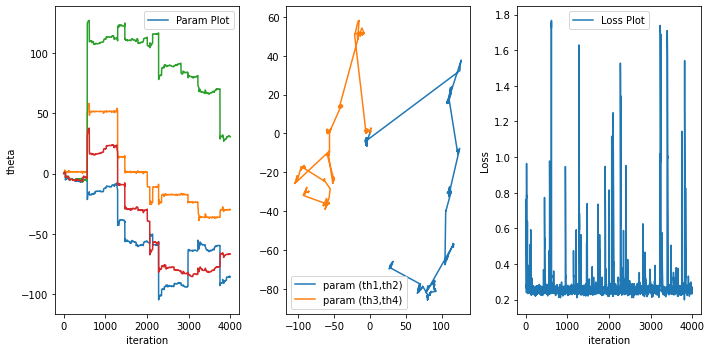

In [167]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()

### c1=0.1(Large movement) delta=0.3+ (Small fluctuation)

In [168]:
progress=[];
theta=[0,0,0,0];
thdata=[];

c1=0.1   
delta=6
nshot=3000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(4000):
    delta=random.random()+0.3
    theta=theta-SPSA(1,theta,c1,delta,nshot)
    print(ep,"th iteration L=",lossCal2qubit(1,theta,nshot))
    progress.append(lossCal2qubit(1,theta,nshot))
    thdata.append(theta)

0 th iteration L= 0.7853333333333333
1 th iteration L= 0.7473333333333334
2 th iteration L= 0.6493333333333333
3 th iteration L= 0.6799999999999999
4 th iteration L= 0.5106666666666666
5 th iteration L= 0.4746666666666667
6 th iteration L= 0.41200000000000003
7 th iteration L= 0.3713333333333333
8 th iteration L= 0.34199999999999997
9 th iteration L= 0.3546666666666667
10 th iteration L= 0.31999999999999995
11 th iteration L= 0.29333333333333333
12 th iteration L= 0.31200000000000006
13 th iteration L= 0.2833333333333333
14 th iteration L= 0.268
15 th iteration L= 0.27
16 th iteration L= 0.262
17 th iteration L= 0.274
18 th iteration L= 0.258
19 th iteration L= 0.2553333333333333
20 th iteration L= 0.2586666666666667
21 th iteration L= 0.28933333333333333
22 th iteration L= 0.254
23 th iteration L= 0.27
24 th iteration L= 0.2586666666666667
25 th iteration L= 0.2673333333333333
26 th iteration L= 0.22199999999999998
27 th iteration L= 0.24
28 th iteration L= 0.2493333333333333
29 th it

240 th iteration L= 0.256
241 th iteration L= 0.238
242 th iteration L= 0.244
243 th iteration L= 0.2633333333333333
244 th iteration L= 0.2506666666666667
245 th iteration L= 0.2386666666666667
246 th iteration L= 0.2486666666666667
247 th iteration L= 0.254
248 th iteration L= 0.22799999999999998
249 th iteration L= 0.2513333333333333
250 th iteration L= 0.22199999999999998
251 th iteration L= 0.244
252 th iteration L= 0.2526666666666667
253 th iteration L= 0.2473333333333333
254 th iteration L= 0.2493333333333333
255 th iteration L= 0.2533333333333333
256 th iteration L= 0.2653333333333333
257 th iteration L= 0.25
258 th iteration L= 0.264
259 th iteration L= 0.2413333333333333
260 th iteration L= 0.2406666666666667
261 th iteration L= 0.2486666666666667
262 th iteration L= 0.21599999999999997
263 th iteration L= 0.25
264 th iteration L= 0.2533333333333333
265 th iteration L= 0.2386666666666667
266 th iteration L= 0.2713333333333333
267 th iteration L= 0.256
268 th iteration L= 0.23

476 th iteration L= 0.236
477 th iteration L= 0.246
478 th iteration L= 0.2513333333333333
479 th iteration L= 0.2513333333333333
480 th iteration L= 0.266
481 th iteration L= 0.2453333333333333
482 th iteration L= 0.2533333333333333
483 th iteration L= 0.2553333333333333
484 th iteration L= 0.248
485 th iteration L= 0.262
486 th iteration L= 0.2606666666666667
487 th iteration L= 0.2446666666666667
488 th iteration L= 0.2633333333333333
489 th iteration L= 0.252
490 th iteration L= 0.22533333333333339
491 th iteration L= 0.23399999999999999
492 th iteration L= 0.2493333333333333
493 th iteration L= 0.21266666666666667
494 th iteration L= 0.2326666666666667
495 th iteration L= 0.2553333333333333
496 th iteration L= 0.2573333333333333
497 th iteration L= 0.2706666666666667
498 th iteration L= 0.2533333333333333
499 th iteration L= 0.22266666666666668
500 th iteration L= 0.22666666666666668
501 th iteration L= 0.2366666666666667
502 th iteration L= 0.2773333333333333
503 th iteration L= 

709 th iteration L= 0.2446666666666667
710 th iteration L= 0.2306666666666667
711 th iteration L= 0.264
712 th iteration L= 0.248
713 th iteration L= 0.2366666666666667
714 th iteration L= 0.26
715 th iteration L= 0.256
716 th iteration L= 0.23399999999999999
717 th iteration L= 0.2566666666666667
718 th iteration L= 0.2526666666666667
719 th iteration L= 0.2586666666666667
720 th iteration L= 0.22866666666666668
721 th iteration L= 0.23333333333333328
722 th iteration L= 0.2546666666666667
723 th iteration L= 0.2533333333333333
724 th iteration L= 0.23533333333333328
725 th iteration L= 0.2413333333333333
726 th iteration L= 0.2566666666666667
727 th iteration L= 0.2453333333333333
728 th iteration L= 0.236
729 th iteration L= 0.23399999999999999
730 th iteration L= 0.22866666666666668
731 th iteration L= 0.25
732 th iteration L= 0.242
733 th iteration L= 0.22999999999999998
734 th iteration L= 0.2426666666666667
735 th iteration L= 0.2626666666666667
736 th iteration L= 0.25533333333

943 th iteration L= 0.2426666666666667
944 th iteration L= 0.23733333333333329
945 th iteration L= 0.21399999999999997
946 th iteration L= 0.254
947 th iteration L= 0.242
948 th iteration L= 0.2593333333333333
949 th iteration L= 0.238
950 th iteration L= 0.2546666666666667
951 th iteration L= 0.2273333333333334
952 th iteration L= 0.2466666666666667
953 th iteration L= 0.262
954 th iteration L= 0.258
955 th iteration L= 0.2413333333333333
956 th iteration L= 0.244
957 th iteration L= 0.23333333333333328
958 th iteration L= 0.2606666666666667
959 th iteration L= 0.2486666666666667
960 th iteration L= 0.2786666666666666
961 th iteration L= 0.2493333333333333
962 th iteration L= 0.26
963 th iteration L= 0.244
964 th iteration L= 0.2413333333333333
965 th iteration L= 0.2553333333333333
966 th iteration L= 0.264
967 th iteration L= 0.2413333333333333
968 th iteration L= 0.238
969 th iteration L= 0.2366666666666667
970 th iteration L= 0.2433333333333333
971 th iteration L= 0.238
972 th ite

1172 th iteration L= 0.252
1173 th iteration L= 0.2566666666666667
1174 th iteration L= 0.2386666666666667
1175 th iteration L= 0.2486666666666667
1176 th iteration L= 0.2633333333333333
1177 th iteration L= 0.256
1178 th iteration L= 0.246
1179 th iteration L= 0.2426666666666667
1180 th iteration L= 0.238
1181 th iteration L= 0.2666666666666667
1182 th iteration L= 0.23399999999999999
1183 th iteration L= 0.2546666666666667
1184 th iteration L= 0.248
1185 th iteration L= 0.2366666666666667
1186 th iteration L= 0.238
1187 th iteration L= 0.2553333333333333
1188 th iteration L= 0.242
1189 th iteration L= 0.25
1190 th iteration L= 0.252
1191 th iteration L= 0.2606666666666667
1192 th iteration L= 0.2666666666666667
1193 th iteration L= 0.24
1194 th iteration L= 0.2426666666666667
1195 th iteration L= 0.2626666666666667
1196 th iteration L= 0.262
1197 th iteration L= 0.266
1198 th iteration L= 0.256
1199 th iteration L= 0.2393333333333333
1200 th iteration L= 0.2593333333333333
1201 th it

1399 th iteration L= 0.21533333333333338
1400 th iteration L= 0.2346666666666667
1401 th iteration L= 0.2366666666666667
1402 th iteration L= 0.2473333333333333
1403 th iteration L= 0.2586666666666667
1404 th iteration L= 0.23733333333333329
1405 th iteration L= 0.2633333333333333
1406 th iteration L= 0.27
1407 th iteration L= 0.23333333333333328
1408 th iteration L= 0.2586666666666667
1409 th iteration L= 0.24
1410 th iteration L= 0.2426666666666667
1411 th iteration L= 0.2433333333333333
1412 th iteration L= 0.2453333333333333
1413 th iteration L= 0.23333333333333328
1414 th iteration L= 0.2726666666666666
1415 th iteration L= 0.2413333333333333
1416 th iteration L= 0.2633333333333333
1417 th iteration L= 0.2686666666666667
1418 th iteration L= 0.2473333333333333
1419 th iteration L= 0.2526666666666667
1420 th iteration L= 0.2606666666666667
1421 th iteration L= 0.2326666666666667
1422 th iteration L= 0.2433333333333333
1423 th iteration L= 0.2473333333333333
1424 th iteration L= 0.2

1627 th iteration L= 0.24
1628 th iteration L= 0.26
1629 th iteration L= 0.2573333333333333
1630 th iteration L= 0.2453333333333333
1631 th iteration L= 0.2426666666666667
1632 th iteration L= 0.21333333333333337
1633 th iteration L= 0.2513333333333333
1634 th iteration L= 0.2626666666666667
1635 th iteration L= 0.24
1636 th iteration L= 0.238
1637 th iteration L= 0.2526666666666667
1638 th iteration L= 0.252
1639 th iteration L= 0.2646666666666667
1640 th iteration L= 0.21799999999999997
1641 th iteration L= 0.25
1642 th iteration L= 0.2486666666666667
1643 th iteration L= 0.274
1644 th iteration L= 0.252
1645 th iteration L= 0.2406666666666667
1646 th iteration L= 0.2453333333333333
1647 th iteration L= 0.248
1648 th iteration L= 0.2553333333333333
1649 th iteration L= 0.23733333333333329
1650 th iteration L= 0.2753333333333333
1651 th iteration L= 0.2526666666666667
1652 th iteration L= 0.2573333333333333
1653 th iteration L= 0.2606666666666667
1654 th iteration L= 0.256
1655 th ite

1856 th iteration L= 0.2473333333333333
1857 th iteration L= 0.2473333333333333
1858 th iteration L= 0.2633333333333333
1859 th iteration L= 0.2493333333333333
1860 th iteration L= 0.2486666666666667
1861 th iteration L= 0.246
1862 th iteration L= 0.2413333333333333
1863 th iteration L= 0.2673333333333333
1864 th iteration L= 0.242
1865 th iteration L= 0.2446666666666667
1866 th iteration L= 0.2646666666666667
1867 th iteration L= 0.2486666666666667
1868 th iteration L= 0.264
1869 th iteration L= 0.2493333333333333
1870 th iteration L= 0.2386666666666667
1871 th iteration L= 0.2346666666666667
1872 th iteration L= 0.2633333333333333
1873 th iteration L= 0.248
1874 th iteration L= 0.242
1875 th iteration L= 0.254
1876 th iteration L= 0.246
1877 th iteration L= 0.244
1878 th iteration L= 0.2626666666666667
1879 th iteration L= 0.2393333333333333
1880 th iteration L= 0.2746666666666666
1881 th iteration L= 0.2646666666666667
1882 th iteration L= 0.2533333333333333
1883 th iteration L= 0.2

2087 th iteration L= 0.258
2088 th iteration L= 0.2653333333333333
2089 th iteration L= 0.2626666666666667
2090 th iteration L= 0.22999999999999998
2091 th iteration L= 0.246
2092 th iteration L= 0.2486666666666667
2093 th iteration L= 0.2273333333333334
2094 th iteration L= 0.24
2095 th iteration L= 0.2666666666666667
2096 th iteration L= 0.2486666666666667
2097 th iteration L= 0.252
2098 th iteration L= 0.2386666666666667
2099 th iteration L= 0.2646666666666667
2100 th iteration L= 0.27
2101 th iteration L= 0.242
2102 th iteration L= 0.254
2103 th iteration L= 0.2473333333333333
2104 th iteration L= 0.2506666666666667
2105 th iteration L= 0.244
2106 th iteration L= 0.2473333333333333
2107 th iteration L= 0.22399999999999998
2108 th iteration L= 0.2526666666666667
2109 th iteration L= 0.2346666666666667
2110 th iteration L= 0.252
2111 th iteration L= 0.2646666666666667
2112 th iteration L= 0.2553333333333333
2113 th iteration L= 0.2413333333333333
2114 th iteration L= 0.266
2115 th it

2313 th iteration L= 0.2433333333333333
2314 th iteration L= 0.2366666666666667
2315 th iteration L= 0.256
2316 th iteration L= 0.2513333333333333
2317 th iteration L= 0.25
2318 th iteration L= 0.22933333333333328
2319 th iteration L= 0.2506666666666667
2320 th iteration L= 0.264
2321 th iteration L= 0.266
2322 th iteration L= 0.2473333333333333
2323 th iteration L= 0.246
2324 th iteration L= 0.2486666666666667
2325 th iteration L= 0.2606666666666667
2326 th iteration L= 0.2506666666666667
2327 th iteration L= 0.2546666666666667
2328 th iteration L= 0.2513333333333333
2329 th iteration L= 0.2706666666666667
2330 th iteration L= 0.2493333333333333
2331 th iteration L= 0.2686666666666667
2332 th iteration L= 0.2366666666666667
2333 th iteration L= 0.2446666666666667
2334 th iteration L= 0.23733333333333329
2335 th iteration L= 0.2326666666666667
2336 th iteration L= 0.21866666666666668
2337 th iteration L= 0.2506666666666667
2338 th iteration L= 0.2606666666666667
2339 th iteration L= 0.

2542 th iteration L= 0.2433333333333333
2543 th iteration L= 0.2433333333333333
2544 th iteration L= 0.2473333333333333
2545 th iteration L= 0.23533333333333328
2546 th iteration L= 0.23199999999999998
2547 th iteration L= 0.2553333333333333
2548 th iteration L= 0.264
2549 th iteration L= 0.2506666666666667
2550 th iteration L= 0.254
2551 th iteration L= 0.258
2552 th iteration L= 0.23533333333333328
2553 th iteration L= 0.242
2554 th iteration L= 0.2546666666666667
2555 th iteration L= 0.2526666666666667
2556 th iteration L= 0.236
2557 th iteration L= 0.2406666666666667
2558 th iteration L= 0.2493333333333333
2559 th iteration L= 0.2586666666666667
2560 th iteration L= 0.23399999999999999
2561 th iteration L= 0.2653333333333333
2562 th iteration L= 0.2433333333333333
2563 th iteration L= 0.26
2564 th iteration L= 0.2613333333333333
2565 th iteration L= 0.2626666666666667
2566 th iteration L= 0.238
2567 th iteration L= 0.25
2568 th iteration L= 0.254
2569 th iteration L= 0.262666666666

2772 th iteration L= 0.23533333333333328
2773 th iteration L= 0.2633333333333333
2774 th iteration L= 0.252
2775 th iteration L= 0.25
2776 th iteration L= 0.2453333333333333
2777 th iteration L= 0.272
2778 th iteration L= 0.244
2779 th iteration L= 0.2593333333333333
2780 th iteration L= 0.2486666666666667
2781 th iteration L= 0.2466666666666667
2782 th iteration L= 0.2746666666666666
2783 th iteration L= 0.22199999999999998
2784 th iteration L= 0.2566666666666667
2785 th iteration L= 0.26
2786 th iteration L= 0.2573333333333333
2787 th iteration L= 0.21866666666666668
2788 th iteration L= 0.2453333333333333
2789 th iteration L= 0.2653333333333333
2790 th iteration L= 0.252
2791 th iteration L= 0.2306666666666667
2792 th iteration L= 0.2566666666666667
2793 th iteration L= 0.2533333333333333
2794 th iteration L= 0.268
2795 th iteration L= 0.246
2796 th iteration L= 0.2413333333333333
2797 th iteration L= 0.262
2798 th iteration L= 0.2473333333333333
2799 th iteration L= 0.248
2800 th i

3000 th iteration L= 0.2393333333333333
3001 th iteration L= 0.2626666666666667
3002 th iteration L= 0.2706666666666667
3003 th iteration L= 0.272
3004 th iteration L= 0.2553333333333333
3005 th iteration L= 0.23199999999999998
3006 th iteration L= 0.2473333333333333
3007 th iteration L= 0.2433333333333333
3008 th iteration L= 0.23199999999999998
3009 th iteration L= 0.2466666666666667
3010 th iteration L= 0.242
3011 th iteration L= 0.2406666666666667
3012 th iteration L= 0.2413333333333333
3013 th iteration L= 0.266
3014 th iteration L= 0.23533333333333328
3015 th iteration L= 0.2406666666666667
3016 th iteration L= 0.24
3017 th iteration L= 0.258
3018 th iteration L= 0.2546666666666667
3019 th iteration L= 0.256
3020 th iteration L= 0.2386666666666667
3021 th iteration L= 0.256
3022 th iteration L= 0.256
3023 th iteration L= 0.2326666666666667
3024 th iteration L= 0.2446666666666667
3025 th iteration L= 0.2546666666666667
3026 th iteration L= 0.22666666666666668
3027 th iteration L= 

3228 th iteration L= 0.2493333333333333
3229 th iteration L= 0.254
3230 th iteration L= 0.2446666666666667
3231 th iteration L= 0.22666666666666668
3232 th iteration L= 0.2406666666666667
3233 th iteration L= 0.23199999999999998
3234 th iteration L= 0.2273333333333334
3235 th iteration L= 0.2446666666666667
3236 th iteration L= 0.2413333333333333
3237 th iteration L= 0.2486666666666667
3238 th iteration L= 0.2513333333333333
3239 th iteration L= 0.2546666666666667
3240 th iteration L= 0.22999999999999998
3241 th iteration L= 0.2306666666666667
3242 th iteration L= 0.2586666666666667
3243 th iteration L= 0.23733333333333329
3244 th iteration L= 0.2566666666666667
3245 th iteration L= 0.2526666666666667
3246 th iteration L= 0.2493333333333333
3247 th iteration L= 0.2586666666666667
3248 th iteration L= 0.2586666666666667
3249 th iteration L= 0.2733333333333333
3250 th iteration L= 0.2486666666666667
3251 th iteration L= 0.24
3252 th iteration L= 0.2446666666666667
3253 th iteration L= 0.

3457 th iteration L= 0.236
3458 th iteration L= 0.2466666666666667
3459 th iteration L= 0.23399999999999999
3460 th iteration L= 0.2393333333333333
3461 th iteration L= 0.2346666666666667
3462 th iteration L= 0.26
3463 th iteration L= 0.2433333333333333
3464 th iteration L= 0.258
3465 th iteration L= 0.26
3466 th iteration L= 0.23399999999999999
3467 th iteration L= 0.2393333333333333
3468 th iteration L= 0.254
3469 th iteration L= 0.2393333333333333
3470 th iteration L= 0.2466666666666667
3471 th iteration L= 0.276
3472 th iteration L= 0.2466666666666667
3473 th iteration L= 0.2406666666666667
3474 th iteration L= 0.2613333333333333
3475 th iteration L= 0.248
3476 th iteration L= 0.2566666666666667
3477 th iteration L= 0.2606666666666667
3478 th iteration L= 0.21933333333333338
3479 th iteration L= 0.2546666666666667
3480 th iteration L= 0.2553333333333333
3481 th iteration L= 0.2493333333333333
3482 th iteration L= 0.2326666666666667
3483 th iteration L= 0.2493333333333333
3484 th it

3685 th iteration L= 0.2653333333333333
3686 th iteration L= 0.22333333333333338
3687 th iteration L= 0.2573333333333333
3688 th iteration L= 0.24
3689 th iteration L= 0.2633333333333333
3690 th iteration L= 0.242
3691 th iteration L= 0.2773333333333333
3692 th iteration L= 0.2613333333333333
3693 th iteration L= 0.2486666666666667
3694 th iteration L= 0.2506666666666667
3695 th iteration L= 0.2413333333333333
3696 th iteration L= 0.24
3697 th iteration L= 0.2593333333333333
3698 th iteration L= 0.2493333333333333
3699 th iteration L= 0.23199999999999998
3700 th iteration L= 0.24
3701 th iteration L= 0.2486666666666667
3702 th iteration L= 0.2426666666666667
3703 th iteration L= 0.2413333333333333
3704 th iteration L= 0.252
3705 th iteration L= 0.25
3706 th iteration L= 0.2326666666666667
3707 th iteration L= 0.238
3708 th iteration L= 0.252
3709 th iteration L= 0.2506666666666667
3710 th iteration L= 0.2433333333333333
3711 th iteration L= 0.2346666666666667
3712 th iteration L= 0.256

3908 th iteration L= 0.2533333333333333
3909 th iteration L= 0.2433333333333333
3910 th iteration L= 0.2553333333333333
3911 th iteration L= 0.2726666666666666
3912 th iteration L= 0.254
3913 th iteration L= 0.21533333333333338
3914 th iteration L= 0.23133333333333328
3915 th iteration L= 0.22999999999999998
3916 th iteration L= 0.23333333333333328
3917 th iteration L= 0.24
3918 th iteration L= 0.252
3919 th iteration L= 0.268
3920 th iteration L= 0.2513333333333333
3921 th iteration L= 0.2613333333333333
3922 th iteration L= 0.2726666666666666
3923 th iteration L= 0.2526666666666667
3924 th iteration L= 0.2486666666666667
3925 th iteration L= 0.248
3926 th iteration L= 0.2566666666666667
3927 th iteration L= 0.2526666666666667
3928 th iteration L= 0.23733333333333329
3929 th iteration L= 0.242
3930 th iteration L= 0.2366666666666667
3931 th iteration L= 0.2426666666666667
3932 th iteration L= 0.2473333333333333
3933 th iteration L= 0.22466666666666668
3934 th iteration L= 0.2533333333

After 1000 iteration we have theta = [2.1032868  1.355357   3.10501598 2.07021219]


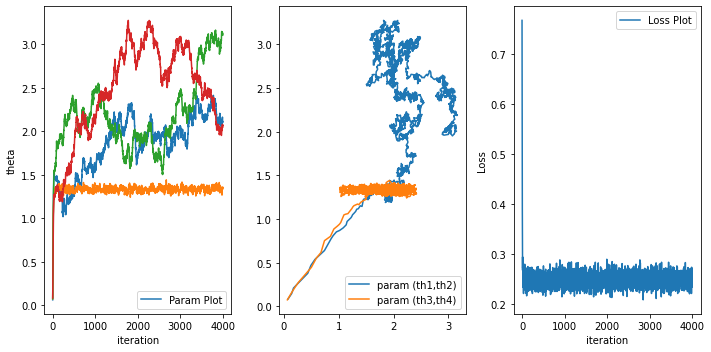

In [169]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()

### c1=0.1(Large movement) delta=0.1+ (Medium fluctuation)

In [170]:
progress=[];
theta=[0,0,0,0];
thdata=[];

c1=0.1   
delta=6
nshot=3000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(4000):
    delta=random.random()+0.1
    theta=theta-SPSA(1,theta,c1,delta,nshot)
    print(ep,"th iteration L=",lossCal2qubit(1,theta,nshot))
    progress.append(lossCal2qubit(1,theta,nshot))
    thdata.append(theta)

0 th iteration L= 0.808
1 th iteration L= 0.546
2 th iteration L= 0.31733333333333336
3 th iteration L= 0.2666666666666667
4 th iteration L= 0.2586666666666667
5 th iteration L= 0.2613333333333333
6 th iteration L= 0.2546666666666667
7 th iteration L= 0.2653333333333333
8 th iteration L= 0.2553333333333333
9 th iteration L= 0.262
10 th iteration L= 0.2453333333333333
11 th iteration L= 0.2513333333333333
12 th iteration L= 0.2453333333333333
13 th iteration L= 0.2566666666666667
14 th iteration L= 0.2573333333333333
15 th iteration L= 0.236
16 th iteration L= 0.2326666666666667
17 th iteration L= 0.23399999999999999
18 th iteration L= 0.2566666666666667
19 th iteration L= 0.246
20 th iteration L= 0.2573333333333333
21 th iteration L= 0.2506666666666667
22 th iteration L= 0.278
23 th iteration L= 0.2413333333333333
24 th iteration L= 0.236
25 th iteration L= 0.2493333333333333
26 th iteration L= 0.23733333333333329
27 th iteration L= 0.2513333333333333
28 th iteration L= 0.2339999999999

236 th iteration L= 0.248
237 th iteration L= 0.2473333333333333
238 th iteration L= 0.256
239 th iteration L= 0.23733333333333329
240 th iteration L= 0.2493333333333333
241 th iteration L= 0.2466666666666667
242 th iteration L= 0.25
243 th iteration L= 0.2533333333333333
244 th iteration L= 0.2693333333333333
245 th iteration L= 0.2473333333333333
246 th iteration L= 0.2546666666666667
247 th iteration L= 0.254
248 th iteration L= 0.2466666666666667
249 th iteration L= 0.2393333333333333
250 th iteration L= 0.22333333333333338
251 th iteration L= 0.27
252 th iteration L= 0.258
253 th iteration L= 0.252
254 th iteration L= 0.2646666666666667
255 th iteration L= 0.2553333333333333
256 th iteration L= 0.2453333333333333
257 th iteration L= 0.2546666666666667
258 th iteration L= 0.2453333333333333
259 th iteration L= 0.264
260 th iteration L= 0.262
261 th iteration L= 0.2506666666666667
262 th iteration L= 0.268
263 th iteration L= 0.2493333333333333
264 th iteration L= 0.2626666666666667

472 th iteration L= 0.24
473 th iteration L= 0.2593333333333333
474 th iteration L= 0.24
475 th iteration L= 0.2586666666666667
476 th iteration L= 0.2406666666666667
477 th iteration L= 0.244
478 th iteration L= 0.28
479 th iteration L= 0.278
480 th iteration L= 0.254
481 th iteration L= 0.2666666666666667
482 th iteration L= 0.2386666666666667
483 th iteration L= 0.2453333333333333
484 th iteration L= 0.26
485 th iteration L= 0.24
486 th iteration L= 0.254
487 th iteration L= 0.264
488 th iteration L= 0.272
489 th iteration L= 0.236
490 th iteration L= 0.266
491 th iteration L= 0.2386666666666667
492 th iteration L= 0.24
493 th iteration L= 0.22133333333333338
494 th iteration L= 0.254
495 th iteration L= 0.23533333333333328
496 th iteration L= 0.2413333333333333
497 th iteration L= 0.26
498 th iteration L= 0.2366666666666667
499 th iteration L= 0.276
500 th iteration L= 0.264
501 th iteration L= 0.2306666666666667
502 th iteration L= 0.21399999999999997
503 th iteration L= 0.252
504

712 th iteration L= 0.244
713 th iteration L= 0.2433333333333333
714 th iteration L= 0.238
715 th iteration L= 0.244
716 th iteration L= 0.2653333333333333
717 th iteration L= 0.2513333333333333
718 th iteration L= 0.236
719 th iteration L= 0.2446666666666667
720 th iteration L= 0.2426666666666667
721 th iteration L= 0.2533333333333333
722 th iteration L= 0.23733333333333329
723 th iteration L= 0.2413333333333333
724 th iteration L= 0.2533333333333333
725 th iteration L= 0.2686666666666667
726 th iteration L= 0.2786666666666666
727 th iteration L= 0.248
728 th iteration L= 0.2493333333333333
729 th iteration L= 0.274
730 th iteration L= 0.2553333333333333
731 th iteration L= 0.236
732 th iteration L= 0.2346666666666667
733 th iteration L= 0.252
734 th iteration L= 0.23199999999999998
735 th iteration L= 0.256
736 th iteration L= 0.242
737 th iteration L= 0.238
738 th iteration L= 0.2546666666666667
739 th iteration L= 0.2446666666666667
740 th iteration L= 0.23199999999999998
741 th it

942 th iteration L= 0.2486666666666667
943 th iteration L= 0.25
944 th iteration L= 0.2386666666666667
945 th iteration L= 0.2433333333333333
946 th iteration L= 0.2393333333333333
947 th iteration L= 0.254
948 th iteration L= 0.2433333333333333
949 th iteration L= 0.254
950 th iteration L= 0.2426666666666667
951 th iteration L= 0.22999999999999998
952 th iteration L= 0.22533333333333339
953 th iteration L= 0.27
954 th iteration L= 0.2426666666666667
955 th iteration L= 0.22599999999999998
956 th iteration L= 0.28400000000000003
957 th iteration L= 0.2466666666666667
958 th iteration L= 0.256
959 th iteration L= 0.2306666666666667
960 th iteration L= 0.2433333333333333
961 th iteration L= 0.2553333333333333
962 th iteration L= 0.2453333333333333
963 th iteration L= 0.2646666666666667
964 th iteration L= 0.2506666666666667
965 th iteration L= 0.258
966 th iteration L= 0.256
967 th iteration L= 0.2673333333333333
968 th iteration L= 0.244
969 th iteration L= 0.2546666666666667
970 th ite

1175 th iteration L= 0.2513333333333333
1176 th iteration L= 0.21866666666666668
1177 th iteration L= 0.2533333333333333
1178 th iteration L= 0.22466666666666668
1179 th iteration L= 0.2493333333333333
1180 th iteration L= 0.2473333333333333
1181 th iteration L= 0.2553333333333333
1182 th iteration L= 0.25
1183 th iteration L= 0.2446666666666667
1184 th iteration L= 0.2426666666666667
1185 th iteration L= 0.2606666666666667
1186 th iteration L= 0.254
1187 th iteration L= 0.2406666666666667
1188 th iteration L= 0.2513333333333333
1189 th iteration L= 0.2693333333333333
1190 th iteration L= 0.2546666666666667
1191 th iteration L= 0.2533333333333333
1192 th iteration L= 0.244
1193 th iteration L= 0.23333333333333328
1194 th iteration L= 0.2306666666666667
1195 th iteration L= 0.2666666666666667
1196 th iteration L= 0.25
1197 th iteration L= 0.2446666666666667
1198 th iteration L= 0.23733333333333329
1199 th iteration L= 0.2613333333333333
1200 th iteration L= 0.244
1201 th iteration L= 0.

1400 th iteration L= 0.2433333333333333
1401 th iteration L= 0.238
1402 th iteration L= 0.23399999999999999
1403 th iteration L= 0.2573333333333333
1404 th iteration L= 0.2426666666666667
1405 th iteration L= 0.2533333333333333
1406 th iteration L= 0.2473333333333333
1407 th iteration L= 0.22799999999999998
1408 th iteration L= 0.2566666666666667
1409 th iteration L= 0.2613333333333333
1410 th iteration L= 0.23533333333333328
1411 th iteration L= 0.2626666666666667
1412 th iteration L= 0.2513333333333333
1413 th iteration L= 0.2573333333333333
1414 th iteration L= 0.252
1415 th iteration L= 0.236
1416 th iteration L= 0.2506666666666667
1417 th iteration L= 0.2453333333333333
1418 th iteration L= 0.2513333333333333
1419 th iteration L= 0.252
1420 th iteration L= 0.2673333333333333
1421 th iteration L= 0.2526666666666667
1422 th iteration L= 0.2446666666666667
1423 th iteration L= 0.26
1424 th iteration L= 0.2726666666666666
1425 th iteration L= 0.2433333333333333
1426 th iteration L= 0.

1623 th iteration L= 0.264
1624 th iteration L= 0.2446666666666667
1625 th iteration L= 0.242
1626 th iteration L= 0.2306666666666667
1627 th iteration L= 0.29000000000000004
1628 th iteration L= 0.2733333333333333
1629 th iteration L= 0.2426666666666667
1630 th iteration L= 0.262
1631 th iteration L= 0.2406666666666667
1632 th iteration L= 0.26
1633 th iteration L= 0.2326666666666667
1634 th iteration L= 0.2506666666666667
1635 th iteration L= 0.2506666666666667
1636 th iteration L= 0.26
1637 th iteration L= 0.2506666666666667
1638 th iteration L= 0.258
1639 th iteration L= 0.24
1640 th iteration L= 0.23199999999999998
1641 th iteration L= 0.2593333333333333
1642 th iteration L= 0.272
1643 th iteration L= 0.254
1644 th iteration L= 0.244
1645 th iteration L= 0.2766666666666666
1646 th iteration L= 0.2586666666666667
1647 th iteration L= 0.2446666666666667
1648 th iteration L= 0.23399999999999999
1649 th iteration L= 0.2446666666666667
1650 th iteration L= 0.2613333333333333
1651 th it

1853 th iteration L= 0.22599999999999998
1854 th iteration L= 0.2413333333333333
1855 th iteration L= 0.2393333333333333
1856 th iteration L= 0.25
1857 th iteration L= 0.2593333333333333
1858 th iteration L= 0.2426666666666667
1859 th iteration L= 0.242
1860 th iteration L= 0.242
1861 th iteration L= 0.2686666666666667
1862 th iteration L= 0.2326666666666667
1863 th iteration L= 0.2486666666666667
1864 th iteration L= 0.246
1865 th iteration L= 0.268
1866 th iteration L= 0.2566666666666667
1867 th iteration L= 0.2533333333333333
1868 th iteration L= 0.2666666666666667
1869 th iteration L= 0.23733333333333329
1870 th iteration L= 0.2413333333333333
1871 th iteration L= 0.2626666666666667
1872 th iteration L= 0.266
1873 th iteration L= 0.2653333333333333
1874 th iteration L= 0.2513333333333333
1875 th iteration L= 0.23333333333333328
1876 th iteration L= 0.258
1877 th iteration L= 0.2633333333333333
1878 th iteration L= 0.2473333333333333
1879 th iteration L= 0.26
1880 th iteration L= 0.

2083 th iteration L= 0.2406666666666667
2084 th iteration L= 0.2526666666666667
2085 th iteration L= 0.21999999999999997
2086 th iteration L= 0.2573333333333333
2087 th iteration L= 0.2593333333333333
2088 th iteration L= 0.2553333333333333
2089 th iteration L= 0.2506666666666667
2090 th iteration L= 0.2613333333333333
2091 th iteration L= 0.2573333333333333
2092 th iteration L= 0.2473333333333333
2093 th iteration L= 0.2493333333333333
2094 th iteration L= 0.2566666666666667
2095 th iteration L= 0.23333333333333328
2096 th iteration L= 0.2626666666666667
2097 th iteration L= 0.2446666666666667
2098 th iteration L= 0.238
2099 th iteration L= 0.2566666666666667
2100 th iteration L= 0.26
2101 th iteration L= 0.2346666666666667
2102 th iteration L= 0.2573333333333333
2103 th iteration L= 0.2546666666666667
2104 th iteration L= 0.2633333333333333
2105 th iteration L= 0.244
2106 th iteration L= 0.2513333333333333
2107 th iteration L= 0.22866666666666668
2108 th iteration L= 0.25866666666666

2309 th iteration L= 0.244
2310 th iteration L= 0.23733333333333329
2311 th iteration L= 0.23733333333333329
2312 th iteration L= 0.2613333333333333
2313 th iteration L= 0.2626666666666667
2314 th iteration L= 0.2466666666666667
2315 th iteration L= 0.244
2316 th iteration L= 0.2586666666666667
2317 th iteration L= 0.2613333333333333
2318 th iteration L= 0.2433333333333333
2319 th iteration L= 0.25
2320 th iteration L= 0.2486666666666667
2321 th iteration L= 0.25
2322 th iteration L= 0.2346666666666667
2323 th iteration L= 0.23399999999999999
2324 th iteration L= 0.2433333333333333
2325 th iteration L= 0.244
2326 th iteration L= 0.2466666666666667
2327 th iteration L= 0.2506666666666667
2328 th iteration L= 0.2506666666666667
2329 th iteration L= 0.2413333333333333
2330 th iteration L= 0.2646666666666667
2331 th iteration L= 0.2526666666666667
2332 th iteration L= 0.2486666666666667
2333 th iteration L= 0.2533333333333333
2334 th iteration L= 0.28
2335 th iteration L= 0.232666666666666

2537 th iteration L= 0.2526666666666667
2538 th iteration L= 0.2406666666666667
2539 th iteration L= 0.256
2540 th iteration L= 0.2426666666666667
2541 th iteration L= 0.2466666666666667
2542 th iteration L= 0.2613333333333333
2543 th iteration L= 0.236
2544 th iteration L= 0.242
2545 th iteration L= 0.2406666666666667
2546 th iteration L= 0.2533333333333333
2547 th iteration L= 0.2406666666666667
2548 th iteration L= 0.236
2549 th iteration L= 0.2593333333333333
2550 th iteration L= 0.22399999999999998
2551 th iteration L= 0.2706666666666667
2552 th iteration L= 0.2646666666666667
2553 th iteration L= 0.2466666666666667
2554 th iteration L= 0.2366666666666667
2555 th iteration L= 0.2553333333333333
2556 th iteration L= 0.2646666666666667
2557 th iteration L= 0.23399999999999999
2558 th iteration L= 0.246
2559 th iteration L= 0.2593333333333333
2560 th iteration L= 0.268
2561 th iteration L= 0.254
2562 th iteration L= 0.2386666666666667
2563 th iteration L= 0.2453333333333333
2564 th i

2759 th iteration L= 0.2653333333333333
2760 th iteration L= 0.2626666666666667
2761 th iteration L= 0.244
2762 th iteration L= 0.2533333333333333
2763 th iteration L= 0.242
2764 th iteration L= 0.248
2765 th iteration L= 0.2526666666666667
2766 th iteration L= 0.2546666666666667
2767 th iteration L= 0.2446666666666667
2768 th iteration L= 0.2633333333333333
2769 th iteration L= 0.2566666666666667
2770 th iteration L= 0.2553333333333333
2771 th iteration L= 0.2633333333333333
2772 th iteration L= 0.2566666666666667
2773 th iteration L= 0.21999999999999997
2774 th iteration L= 0.2346666666666667
2775 th iteration L= 0.244
2776 th iteration L= 0.2433333333333333
2777 th iteration L= 0.22866666666666668
2778 th iteration L= 0.264
2779 th iteration L= 0.242
2780 th iteration L= 0.2573333333333333
2781 th iteration L= 0.23133333333333328
2782 th iteration L= 0.26
2783 th iteration L= 0.2406666666666667
2784 th iteration L= 0.2486666666666667
2785 th iteration L= 0.26
2786 th iteration L= 0.

2986 th iteration L= 0.2566666666666667
2987 th iteration L= 0.256
2988 th iteration L= 0.2346666666666667
2989 th iteration L= 0.2626666666666667
2990 th iteration L= 0.256
2991 th iteration L= 0.258
2992 th iteration L= 0.2386666666666667
2993 th iteration L= 0.2466666666666667
2994 th iteration L= 0.2626666666666667
2995 th iteration L= 0.24
2996 th iteration L= 0.2613333333333333
2997 th iteration L= 0.2346666666666667
2998 th iteration L= 0.2586666666666667
2999 th iteration L= 0.2366666666666667
3000 th iteration L= 0.21933333333333338
3001 th iteration L= 0.25
3002 th iteration L= 0.242
3003 th iteration L= 0.2526666666666667
3004 th iteration L= 0.2606666666666667
3005 th iteration L= 0.23533333333333328
3006 th iteration L= 0.242
3007 th iteration L= 0.2406666666666667
3008 th iteration L= 0.244
3009 th iteration L= 0.2526666666666667
3010 th iteration L= 0.2393333333333333
3011 th iteration L= 0.2653333333333333
3012 th iteration L= 0.2673333333333333
3013 th iteration L= 0.2

3213 th iteration L= 0.2326666666666667
3214 th iteration L= 0.2566666666666667
3215 th iteration L= 0.2533333333333333
3216 th iteration L= 0.2446666666666667
3217 th iteration L= 0.266
3218 th iteration L= 0.2613333333333333
3219 th iteration L= 0.2493333333333333
3220 th iteration L= 0.23533333333333328
3221 th iteration L= 0.22666666666666668
3222 th iteration L= 0.2486666666666667
3223 th iteration L= 0.2493333333333333
3224 th iteration L= 0.2526666666666667
3225 th iteration L= 0.264
3226 th iteration L= 0.2673333333333333
3227 th iteration L= 0.2413333333333333
3228 th iteration L= 0.2433333333333333
3229 th iteration L= 0.254
3230 th iteration L= 0.23133333333333328
3231 th iteration L= 0.2586666666666667
3232 th iteration L= 0.2626666666666667
3233 th iteration L= 0.2486666666666667
3234 th iteration L= 0.2393333333333333
3235 th iteration L= 0.2626666666666667
3236 th iteration L= 0.2566666666666667
3237 th iteration L= 0.23733333333333329
3238 th iteration L= 0.236
3239 th 

3438 th iteration L= 0.252
3439 th iteration L= 0.2406666666666667
3440 th iteration L= 0.2366666666666667
3441 th iteration L= 0.264
3442 th iteration L= 0.23199999999999998
3443 th iteration L= 0.2473333333333333
3444 th iteration L= 0.2426666666666667
3445 th iteration L= 0.2593333333333333
3446 th iteration L= 0.2626666666666667
3447 th iteration L= 0.2433333333333333
3448 th iteration L= 0.2593333333333333
3449 th iteration L= 0.266
3450 th iteration L= 0.22466666666666668
3451 th iteration L= 0.2493333333333333
3452 th iteration L= 0.2533333333333333
3453 th iteration L= 0.2366666666666667
3454 th iteration L= 0.2553333333333333
3455 th iteration L= 0.252
3456 th iteration L= 0.236
3457 th iteration L= 0.2386666666666667
3458 th iteration L= 0.23533333333333328
3459 th iteration L= 0.2486666666666667
3460 th iteration L= 0.2326666666666667
3461 th iteration L= 0.256
3462 th iteration L= 0.2553333333333333
3463 th iteration L= 0.2446666666666667
3464 th iteration L= 0.238
3465 th 

3667 th iteration L= 0.236
3668 th iteration L= 0.2646666666666667
3669 th iteration L= 0.22266666666666668
3670 th iteration L= 0.23133333333333328
3671 th iteration L= 0.242
3672 th iteration L= 0.254
3673 th iteration L= 0.28600000000000003
3674 th iteration L= 0.23533333333333328
3675 th iteration L= 0.2413333333333333
3676 th iteration L= 0.2486666666666667
3677 th iteration L= 0.256
3678 th iteration L= 0.262
3679 th iteration L= 0.22066666666666668
3680 th iteration L= 0.2526666666666667
3681 th iteration L= 0.254
3682 th iteration L= 0.2486666666666667
3683 th iteration L= 0.254
3684 th iteration L= 0.252
3685 th iteration L= 0.2586666666666667
3686 th iteration L= 0.23333333333333328
3687 th iteration L= 0.2366666666666667
3688 th iteration L= 0.2506666666666667
3689 th iteration L= 0.2326666666666667
3690 th iteration L= 0.2453333333333333
3691 th iteration L= 0.254
3692 th iteration L= 0.2866666666666666
3693 th iteration L= 0.23733333333333329
3694 th iteration L= 0.2566666

3897 th iteration L= 0.2546666666666667
3898 th iteration L= 0.258
3899 th iteration L= 0.2713333333333333
3900 th iteration L= 0.2606666666666667
3901 th iteration L= 0.256
3902 th iteration L= 0.26
3903 th iteration L= 0.2486666666666667
3904 th iteration L= 0.22999999999999998
3905 th iteration L= 0.2366666666666667
3906 th iteration L= 0.2533333333333333
3907 th iteration L= 0.25
3908 th iteration L= 0.264
3909 th iteration L= 0.2606666666666667
3910 th iteration L= 0.2626666666666667
3911 th iteration L= 0.2406666666666667
3912 th iteration L= 0.27
3913 th iteration L= 0.262
3914 th iteration L= 0.2506666666666667
3915 th iteration L= 0.2466666666666667
3916 th iteration L= 0.2713333333333333
3917 th iteration L= 0.2433333333333333
3918 th iteration L= 0.2706666666666667
3919 th iteration L= 0.254
3920 th iteration L= 0.252
3921 th iteration L= 0.2646666666666667
3922 th iteration L= 0.2706666666666667
3923 th iteration L= 0.246
3924 th iteration L= 0.2273333333333334
3925 th iter

After 1000 iteration we have theta = [-1.54399813  1.32190506 -2.63828868 -3.1967109 ]


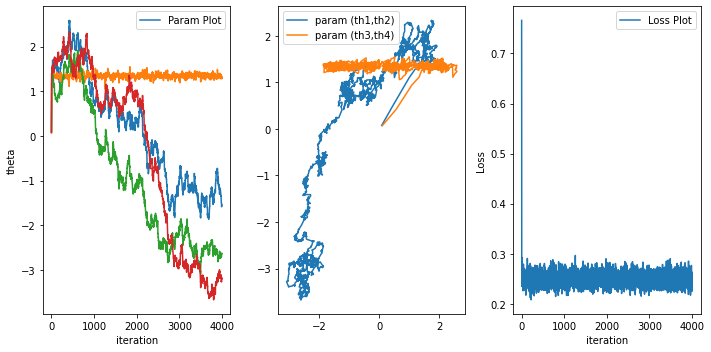

In [171]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()

### c1=0.1(Large movement) delta=0+ (Large fluctuation)

In [172]:
progress=[];
theta=[0,0,0,0];
thdata=[];

c1=0.1   
delta=6
nshot=3000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(4000):
    delta=random.random()
    theta=theta-SPSA(1,theta,c1,delta,nshot)
    print(ep,"th iteration L=",lossCal2qubit(1,theta,nshot))
    progress.append(lossCal2qubit(1,theta,nshot))
    thdata.append(theta)

0 th iteration L= 0.6386666666666667
1 th iteration L= 0.5866666666666667
2 th iteration L= 0.43533333333333335
3 th iteration L= 0.3866666666666667
4 th iteration L= 0.3833333333333333
5 th iteration L= 0.346
6 th iteration L= 0.32399999999999995
7 th iteration L= 0.31000000000000005
8 th iteration L= 0.2853333333333333
9 th iteration L= 0.28933333333333333
10 th iteration L= 0.28400000000000003
11 th iteration L= 0.24
12 th iteration L= 0.246
13 th iteration L= 0.2386666666666667
14 th iteration L= 0.268
15 th iteration L= 0.2513333333333333
16 th iteration L= 0.23399999999999999
17 th iteration L= 0.264
18 th iteration L= 0.2386666666666667
19 th iteration L= 0.246
20 th iteration L= 0.2366666666666667
21 th iteration L= 0.2606666666666667
22 th iteration L= 0.2553333333333333
23 th iteration L= 0.22799999999999998
24 th iteration L= 0.26
25 th iteration L= 0.2306666666666667
26 th iteration L= 0.256
27 th iteration L= 0.2633333333333333
28 th iteration L= 0.2393333333333333
29 th i

232 th iteration L= 0.2806666666666666
233 th iteration L= 0.258
234 th iteration L= 0.276
235 th iteration L= 1.242
236 th iteration L= 1.1886666666666668
237 th iteration L= 1.0766666666666667
238 th iteration L= 0.9653333333333334
239 th iteration L= 0.8666666666666667
240 th iteration L= 0.552
241 th iteration L= 0.4806666666666667
242 th iteration L= 0.3866666666666667
243 th iteration L= 0.33666666666666667
244 th iteration L= 0.2513333333333333
245 th iteration L= 0.2513333333333333
246 th iteration L= 0.278
247 th iteration L= 0.2733333333333333
248 th iteration L= 0.264
249 th iteration L= 0.2486666666666667
250 th iteration L= 0.2646666666666667
251 th iteration L= 0.2653333333333333
252 th iteration L= 0.2606666666666667
253 th iteration L= 1.3693333333333333
254 th iteration L= 1.3473333333333333
255 th iteration L= 1.224
256 th iteration L= 1.2333333333333334
257 th iteration L= 1.15
258 th iteration L= 0.9053333333333333
259 th iteration L= 0.8013333333333333
260 th itera

469 th iteration L= 0.248
470 th iteration L= 0.2533333333333333
471 th iteration L= 0.2426666666666667
472 th iteration L= 0.2546666666666667
473 th iteration L= 0.2446666666666667
474 th iteration L= 0.238
475 th iteration L= 0.256
476 th iteration L= 0.2546666666666667
477 th iteration L= 0.2546666666666667
478 th iteration L= 0.2853333333333333
479 th iteration L= 0.2433333333333333
480 th iteration L= 0.254
481 th iteration L= 0.2486666666666667
482 th iteration L= 0.2686666666666667
483 th iteration L= 0.2346666666666667
484 th iteration L= 0.2673333333333333
485 th iteration L= 0.2573333333333333
486 th iteration L= 0.258
487 th iteration L= 0.238
488 th iteration L= 0.2533333333333333
489 th iteration L= 0.238
490 th iteration L= 0.22333333333333338
491 th iteration L= 0.248
492 th iteration L= 0.2473333333333333
493 th iteration L= 0.23533333333333328
494 th iteration L= 0.246
495 th iteration L= 0.2426666666666667
496 th iteration L= 0.238
497 th iteration L= 0.256
498 th ite

700 th iteration L= 0.22666666666666668
701 th iteration L= 0.2486666666666667
702 th iteration L= 0.244
703 th iteration L= 0.23199999999999998
704 th iteration L= 0.266
705 th iteration L= 0.2473333333333333
706 th iteration L= 0.2366666666666667
707 th iteration L= 0.2453333333333333
708 th iteration L= 0.2673333333333333
709 th iteration L= 0.2546666666666667
710 th iteration L= 0.2566666666666667
711 th iteration L= 0.2846666666666666
712 th iteration L= 0.2513333333333333
713 th iteration L= 0.2273333333333334
714 th iteration L= 0.23533333333333328
715 th iteration L= 0.2686666666666667
716 th iteration L= 0.21866666666666668
717 th iteration L= 0.252
718 th iteration L= 0.258
719 th iteration L= 0.2433333333333333
720 th iteration L= 0.2346666666666667
721 th iteration L= 0.246
722 th iteration L= 0.2573333333333333
723 th iteration L= 0.2386666666666667
724 th iteration L= 0.2646666666666667
725 th iteration L= 0.2566666666666667
726 th iteration L= 0.278
727 th iteration L= 0

936 th iteration L= 0.2566666666666667
937 th iteration L= 0.2406666666666667
938 th iteration L= 0.264
939 th iteration L= 0.238
940 th iteration L= 0.2433333333333333
941 th iteration L= 0.23399999999999999
942 th iteration L= 0.22133333333333338
943 th iteration L= 0.2653333333333333
944 th iteration L= 0.2426666666666667
945 th iteration L= 0.2486666666666667
946 th iteration L= 0.23333333333333328
947 th iteration L= 0.2506666666666667
948 th iteration L= 0.236
949 th iteration L= 0.272
950 th iteration L= 0.24
951 th iteration L= 0.2573333333333333
952 th iteration L= 0.2526666666666667
953 th iteration L= 0.2726666666666666
954 th iteration L= 0.242
955 th iteration L= 0.2413333333333333
956 th iteration L= 0.2746666666666666
957 th iteration L= 0.2566666666666667
958 th iteration L= 0.23399999999999999
959 th iteration L= 0.2386666666666667
960 th iteration L= 0.262
961 th iteration L= 0.2433333333333333
962 th iteration L= 0.2533333333333333
963 th iteration L= 0.2306666666666

1162 th iteration L= 0.348
1163 th iteration L= 0.29333333333333333
1164 th iteration L= 0.29933333333333334
1165 th iteration L= 0.2706666666666667
1166 th iteration L= 0.2573333333333333
1167 th iteration L= 0.246
1168 th iteration L= 0.2693333333333333
1169 th iteration L= 0.2673333333333333
1170 th iteration L= 0.2453333333333333
1171 th iteration L= 0.2553333333333333
1172 th iteration L= 0.256
1173 th iteration L= 0.2366666666666667
1174 th iteration L= 0.268
1175 th iteration L= 0.2446666666666667
1176 th iteration L= 0.26
1177 th iteration L= 0.276
1178 th iteration L= 0.2626666666666667
1179 th iteration L= 0.2626666666666667
1180 th iteration L= 0.24
1181 th iteration L= 0.2533333333333333
1182 th iteration L= 0.2593333333333333
1183 th iteration L= 0.2573333333333333
1184 th iteration L= 0.2786666666666666
1185 th iteration L= 0.2513333333333333
1186 th iteration L= 0.2726666666666666
1187 th iteration L= 0.276
1188 th iteration L= 0.268
1189 th iteration L= 0.26866666666666

1390 th iteration L= 0.24
1391 th iteration L= 0.2453333333333333
1392 th iteration L= 0.24
1393 th iteration L= 0.27
1394 th iteration L= 0.2573333333333333
1395 th iteration L= 0.2726666666666666
1396 th iteration L= 0.2393333333333333
1397 th iteration L= 0.2533333333333333
1398 th iteration L= 0.2466666666666667
1399 th iteration L= 0.22866666666666668
1400 th iteration L= 0.248
1401 th iteration L= 0.2593333333333333
1402 th iteration L= 0.2326666666666667
1403 th iteration L= 0.2446666666666667
1404 th iteration L= 0.23133333333333328
1405 th iteration L= 0.23733333333333329
1406 th iteration L= 0.23199999999999998
1407 th iteration L= 0.23333333333333328
1408 th iteration L= 0.2346666666666667
1409 th iteration L= 0.2493333333333333
1410 th iteration L= 0.2446666666666667
1411 th iteration L= 0.2433333333333333
1412 th iteration L= 0.2366666666666667
1413 th iteration L= 0.2506666666666667
1414 th iteration L= 0.23533333333333328
1415 th iteration L= 0.256
1416 th iteration L= 0

1617 th iteration L= 0.248
1618 th iteration L= 0.2386666666666667
1619 th iteration L= 0.2606666666666667
1620 th iteration L= 0.244
1621 th iteration L= 0.2486666666666667
1622 th iteration L= 0.24
1623 th iteration L= 0.2546666666666667
1624 th iteration L= 0.6599999999999999
1625 th iteration L= 0.30000000000000004
1626 th iteration L= 0.2586666666666667
1627 th iteration L= 0.2626666666666667
1628 th iteration L= 0.2606666666666667
1629 th iteration L= 0.2526666666666667
1630 th iteration L= 0.23199999999999998
1631 th iteration L= 0.2433333333333333
1632 th iteration L= 0.248
1633 th iteration L= 0.2786666666666666
1634 th iteration L= 0.244
1635 th iteration L= 0.2513333333333333
1636 th iteration L= 0.21866666666666668
1637 th iteration L= 0.23733333333333329
1638 th iteration L= 0.238
1639 th iteration L= 0.248
1640 th iteration L= 0.248
1641 th iteration L= 0.2493333333333333
1642 th iteration L= 0.23733333333333329
1643 th iteration L= 0.2733333333333333
1644 th iteration L=

1842 th iteration L= 0.244
1843 th iteration L= 0.2466666666666667
1844 th iteration L= 0.2413333333333333
1845 th iteration L= 0.2453333333333333
1846 th iteration L= 0.2426666666666667
1847 th iteration L= 0.23733333333333329
1848 th iteration L= 0.2573333333333333
1849 th iteration L= 0.2786666666666666
1850 th iteration L= 0.2566666666666667
1851 th iteration L= 0.2646666666666667
1852 th iteration L= 0.2626666666666667
1853 th iteration L= 0.236
1854 th iteration L= 0.272
1855 th iteration L= 0.262
1856 th iteration L= 0.264
1857 th iteration L= 0.2626666666666667
1858 th iteration L= 0.2473333333333333
1859 th iteration L= 0.248
1860 th iteration L= 0.23733333333333329
1861 th iteration L= 0.2386666666666667
1862 th iteration L= 0.256
1863 th iteration L= 0.262
1864 th iteration L= 0.2493333333333333
1865 th iteration L= 0.3486666666666667
1866 th iteration L= 0.33199999999999996
1867 th iteration L= 0.2886666666666666
1868 th iteration L= 0.28733333333333333
1869 th iteration L=

2063 th iteration L= 0.246
2064 th iteration L= 0.25
2065 th iteration L= 0.262
2066 th iteration L= 0.2726666666666666
2067 th iteration L= 0.2773333333333333
2068 th iteration L= 0.2573333333333333
2069 th iteration L= 0.2386666666666667
2070 th iteration L= 0.23733333333333329
2071 th iteration L= 0.2526666666666667
2072 th iteration L= 0.2386666666666667
2073 th iteration L= 0.242
2074 th iteration L= 0.2446666666666667
2075 th iteration L= 0.22599999999999998
2076 th iteration L= 0.2453333333333333
2077 th iteration L= 0.2593333333333333
2078 th iteration L= 0.2386666666666667
2079 th iteration L= 0.268
2080 th iteration L= 0.2613333333333333
2081 th iteration L= 0.24
2082 th iteration L= 0.2506666666666667
2083 th iteration L= 0.2533333333333333
2084 th iteration L= 0.2366666666666667
2085 th iteration L= 0.238
2086 th iteration L= 0.2673333333333333
2087 th iteration L= 0.23733333333333329
2088 th iteration L= 0.2446666666666667
2089 th iteration L= 0.2493333333333333
2090 th it

2291 th iteration L= 1.498
2292 th iteration L= 0.7626666666666666
2293 th iteration L= 0.6893333333333334
2294 th iteration L= 0.5926666666666667
2295 th iteration L= 0.45266666666666666
2296 th iteration L= 0.42066666666666663
2297 th iteration L= 0.3486666666666667
2298 th iteration L= 0.31266666666666665
2299 th iteration L= 0.28
2300 th iteration L= 0.2533333333333333
2301 th iteration L= 0.266
2302 th iteration L= 0.2653333333333333
2303 th iteration L= 0.22533333333333339
2304 th iteration L= 0.258
2305 th iteration L= 0.2846666666666666
2306 th iteration L= 0.246
2307 th iteration L= 0.24
2308 th iteration L= 0.2473333333333333
2309 th iteration L= 0.2466666666666667
2310 th iteration L= 0.252
2311 th iteration L= 0.23199999999999998
2312 th iteration L= 0.256
2313 th iteration L= 0.242
2314 th iteration L= 0.238
2315 th iteration L= 0.22999999999999998
2316 th iteration L= 0.22599999999999998
2317 th iteration L= 0.262
2318 th iteration L= 0.3966666666666666
2319 th iteration 

2524 th iteration L= 0.2433333333333333
2525 th iteration L= 0.2566666666666667
2526 th iteration L= 0.2386666666666667
2527 th iteration L= 1.488
2528 th iteration L= 0.9286666666666666
2529 th iteration L= 0.8513333333333333
2530 th iteration L= 0.6806666666666666
2531 th iteration L= 0.6293333333333333
2532 th iteration L= 0.2806666666666666
2533 th iteration L= 0.28200000000000003
2534 th iteration L= 0.2733333333333333
2535 th iteration L= 0.248
2536 th iteration L= 0.238
2537 th iteration L= 0.2546666666666667
2538 th iteration L= 0.2633333333333333
2539 th iteration L= 0.2606666666666667
2540 th iteration L= 0.2493333333333333
2541 th iteration L= 0.23333333333333328
2542 th iteration L= 0.246
2543 th iteration L= 0.2446666666666667
2544 th iteration L= 0.2473333333333333
2545 th iteration L= 0.2593333333333333
2546 th iteration L= 0.2566666666666667
2547 th iteration L= 0.22599999999999998
2548 th iteration L= 0.2306666666666667
2549 th iteration L= 0.242
2550 th iteration L= 0

2750 th iteration L= 0.2393333333333333
2751 th iteration L= 0.2466666666666667
2752 th iteration L= 0.2746666666666666
2753 th iteration L= 0.23533333333333328
2754 th iteration L= 0.2346666666666667
2755 th iteration L= 0.2833333333333333
2756 th iteration L= 0.246
2757 th iteration L= 0.256
2758 th iteration L= 0.2433333333333333
2759 th iteration L= 0.23733333333333329
2760 th iteration L= 0.2713333333333333
2761 th iteration L= 0.2326666666666667
2762 th iteration L= 0.266
2763 th iteration L= 0.2526666666666667
2764 th iteration L= 0.2466666666666667
2765 th iteration L= 0.242
2766 th iteration L= 0.2566666666666667
2767 th iteration L= 0.2673333333333333
2768 th iteration L= 0.2486666666666667
2769 th iteration L= 0.2426666666666667
2770 th iteration L= 0.2533333333333333
2771 th iteration L= 0.272
2772 th iteration L= 0.2766666666666666
2773 th iteration L= 0.2626666666666667
2774 th iteration L= 0.2626666666666667
2775 th iteration L= 0.23133333333333328
2776 th iteration L= 0

2977 th iteration L= 0.2506666666666667
2978 th iteration L= 0.2586666666666667
2979 th iteration L= 0.2633333333333333
2980 th iteration L= 0.2386666666666667
2981 th iteration L= 0.2386666666666667
2982 th iteration L= 0.26
2983 th iteration L= 0.2393333333333333
2984 th iteration L= 0.242
2985 th iteration L= 0.276
2986 th iteration L= 0.2866666666666666
2987 th iteration L= 0.2793333333333333
2988 th iteration L= 0.2653333333333333
2989 th iteration L= 0.248
2990 th iteration L= 0.2506666666666667
2991 th iteration L= 0.2586666666666667
2992 th iteration L= 0.25
2993 th iteration L= 0.2606666666666667
2994 th iteration L= 0.2413333333333333
2995 th iteration L= 0.2466666666666667
2996 th iteration L= 0.2393333333333333
2997 th iteration L= 0.2566666666666667
2998 th iteration L= 0.2686666666666667
2999 th iteration L= 0.2506666666666667
3000 th iteration L= 0.2326666666666667
3001 th iteration L= 0.23133333333333328
3002 th iteration L= 0.2606666666666667
3003 th iteration L= 0.256

3201 th iteration L= 0.29666666666666663
3202 th iteration L= 0.29400000000000004
3203 th iteration L= 0.29800000000000004
3204 th iteration L= 0.2553333333333333
3205 th iteration L= 0.2626666666666667
3206 th iteration L= 0.266
3207 th iteration L= 0.266
3208 th iteration L= 0.2586666666666667
3209 th iteration L= 0.2513333333333333
3210 th iteration L= 0.254
3211 th iteration L= 0.2466666666666667
3212 th iteration L= 0.23733333333333329
3213 th iteration L= 0.28200000000000003
3214 th iteration L= 0.2673333333333333
3215 th iteration L= 0.2726666666666666
3216 th iteration L= 0.2566666666666667
3217 th iteration L= 0.2553333333333333
3218 th iteration L= 0.242
3219 th iteration L= 0.258
3220 th iteration L= 0.2593333333333333
3221 th iteration L= 0.2586666666666667
3222 th iteration L= 0.2573333333333333
3223 th iteration L= 0.2306666666666667
3224 th iteration L= 0.2573333333333333
3225 th iteration L= 0.264
3226 th iteration L= 0.2486666666666667
3227 th iteration L= 0.3273333333

3428 th iteration L= 0.2446666666666667
3429 th iteration L= 0.256
3430 th iteration L= 0.24
3431 th iteration L= 0.2586666666666667
3432 th iteration L= 0.242
3433 th iteration L= 0.262
3434 th iteration L= 0.252
3435 th iteration L= 0.2466666666666667
3436 th iteration L= 0.2413333333333333
3437 th iteration L= 0.23733333333333329
3438 th iteration L= 0.2606666666666667
3439 th iteration L= 0.268
3440 th iteration L= 0.2393333333333333
3441 th iteration L= 0.2553333333333333
3442 th iteration L= 0.2346666666666667
3443 th iteration L= 0.2453333333333333
3444 th iteration L= 0.2426666666666667
3445 th iteration L= 0.242
3446 th iteration L= 0.2606666666666667
3447 th iteration L= 0.2433333333333333
3448 th iteration L= 0.2506666666666667
3449 th iteration L= 0.252
3450 th iteration L= 0.246
3451 th iteration L= 0.2433333333333333
3452 th iteration L= 0.262
3453 th iteration L= 0.2606666666666667
3454 th iteration L= 0.256
3455 th iteration L= 0.26
3456 th iteration L= 0.22666666666666

3656 th iteration L= 0.22999999999999998
3657 th iteration L= 0.256
3658 th iteration L= 0.2633333333333333
3659 th iteration L= 0.2466666666666667
3660 th iteration L= 0.2646666666666667
3661 th iteration L= 0.2393333333333333
3662 th iteration L= 0.2606666666666667
3663 th iteration L= 0.244
3664 th iteration L= 0.2506666666666667
3665 th iteration L= 0.238
3666 th iteration L= 0.25
3667 th iteration L= 0.244
3668 th iteration L= 0.2446666666666667
3669 th iteration L= 0.2366666666666667
3670 th iteration L= 0.2526666666666667
3671 th iteration L= 0.2393333333333333
3672 th iteration L= 0.262
3673 th iteration L= 0.2693333333333333
3674 th iteration L= 0.24
3675 th iteration L= 1.6506666666666665
3676 th iteration L= 1.608
3677 th iteration L= 1.558
3678 th iteration L= 1.544
3679 th iteration L= 1.518
3680 th iteration L= 0.8213333333333334
3681 th iteration L= 0.7286666666666667
3682 th iteration L= 0.5686666666666667
3683 th iteration L= 0.5393333333333333
3684 th iteration L= 0.2

3883 th iteration L= 0.9586666666666667
3884 th iteration L= 0.272
3885 th iteration L= 1.064
3886 th iteration L= 0.9633333333333334
3887 th iteration L= 0.71
3888 th iteration L= 0.5293333333333333
3889 th iteration L= 0.5633333333333334
3890 th iteration L= 0.364
3891 th iteration L= 0.33333333333333337
3892 th iteration L= 0.31933333333333336
3893 th iteration L= 0.2786666666666666
3894 th iteration L= 0.29866666666666664
3895 th iteration L= 0.2713333333333333
3896 th iteration L= 0.264
3897 th iteration L= 0.6686666666666667
3898 th iteration L= 0.6006666666666667
3899 th iteration L= 0.4986666666666667
3900 th iteration L= 0.43933333333333335
3901 th iteration L= 0.42466666666666664
3902 th iteration L= 0.3613333333333333
3903 th iteration L= 0.33266666666666667
3904 th iteration L= 0.29466666666666663
3905 th iteration L= 0.31200000000000006
3906 th iteration L= 0.27
3907 th iteration L= 0.2793333333333333
3908 th iteration L= 0.2673333333333333
3909 th iteration L= 0.258
3910 

After 1000 iteration we have theta = [ 219.67275745 -111.79903853  207.63707668  173.36309088]


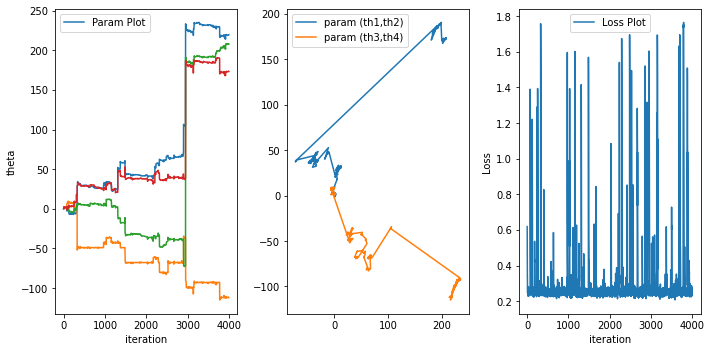

In [173]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()

In [ ]:
from qiskit.providers.aer import QasmSimulator, StatevectorSimulator, UnitarySimulator


backend = Aer.get_backend('qasm_simulator')
def lossCal2qubit(i,theta,nshot):    
    #i th data
    #parameter
    #return loss

    qr = QuantumRegister(2)
    cr = ClassicalRegister(2)
    qc = QuantumCircuit(qr,cr)

    qc.rx(a_shuffled[i][0],qr[0])
    qc.rx(a_shuffled[i][1],qr[1])
    
    qc.ry(pi/4,qr[:])
    qc.rz(pi/4,qr[:])
    
    qc.cz(qr[0],qr[1])
    qc.ry(pi/4,qr[:])
    qc.rz(pi/4,qr[:])
    
    count=0;
    for i in range(2):
        qc.rx(theta[count],qr[i])
        count=count+1
    for i in range(2):
        qc.rz(theta[count],qr[i])
        count=count+1   

    qc.measure(qr[:],cr[:])
    job = execute(qc, backend, shots=nshot)
    result = job.result()
    count =result.get_counts()
    lm=-1*(cN(count,'00')+cN(count,'01'))
    lp=1*(cN(count,'10')+cN(count,'11'))

    loss1=abs(
        (lm+lp)/nshot
        -2*(b_shuffled[i]-0.5)
    )
    loss2=((lm+lp)/nshot-2*(b_shuffled[i]-0.5))**2

    return loss1
lossCal2qubit(8,[1,1,1,1],10)

[0, 0, 0, 0]

In [58]:
#
def SPSA(i,th,c1,delta,nshot):
    sp=[];
    c2=[[0,0,0,c1],[0,0,c1,0],[0,c1,0,0],[c1,0,0,0]]
    for x1 in range(4):
        sp.append((lossCal2qubit(i,th+np.array(c2[x1]),nshot)-lossCal2qubit(i,th-np.array(c2[x1]),nshot))/(2*delta))
    return sp

SPSA(1,theta,0.5,6,100)

[0.006666666666666664,
 0.001666666666666668,
 0.006666666666666672,
 0.008333333333333331]

## Two Qubit iteration with 100 data

### c1=0.01(small movement) delta=0.3+ (small fluctuation)

In [36]:
progress=[];

thdata=[];
theta=[0,0,0,0];
c1=0.01   
delta=6

l1p=[];
l1m=[];
l1t=[];
l1=[];
c=[];
for x1 in range(4):
    c.append(c1)
    
    
ndata=2;
nshot=1000;

for ep in range(1000):
    delta=random.random()+0.3
    
    for i in range(ndata):
        for x1 in range(4):
            l1p.append(lossCal2qubit(i,theta+np.array(c),nshot))
            l1m.append(lossCal2qubit(i,theta-np.array(c),nshot))
    
    for j in range(ndata):
        l1t.append((l1p[j]-l1m[j])/(2*delta))
    
    l=sum(l1t);
    l1.append(l)    
    print(ep,"th iteration L=",l,l1t)        
    
    theta=theta-l
    thdata.append(theta)
        

0 th iteration L= 0.004500790282804771 [0.006751185424207156, -0.002250395141402385]
1 th iteration L= 0.008968065912654278 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532]
2 th iteration L= 0.013926553936756639 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181]
3 th iteration L= 0.017806035282592923 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426]
4 th iteration L= 0.02304027167881061 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434]
5 th iteration L= 0.027119335021378435 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.00223363

19 th iteration L= 0.11533049637973808 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264]
20 th iteration L= 0.12128034279043207 [0.00675118542

28 th iteration L= 0.18495171526862694 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

37 th iteration L= 0.23983558244961864 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

46 th iteration L= 0.2910017551448028 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

55 th iteration L= 0.34463531845224005 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

64 th iteration L= 0.40242552962439593 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

73 th iteration L= 0.45568647200725776 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

82 th iteration L= 0.5083068336152567 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

91 th iteration L= 0.5596509689044317 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

100 th iteration L= 0.612190170038377 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

109 th iteration L= 0.6680376041414654 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

118 th iteration L= 0.7183463025108289 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

128 th iteration L= 0.768560216909811 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

137 th iteration L= 0.821606202704536 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

147 th iteration L= 0.8733928288021324 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

156 th iteration L= 0.9202626865219299 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

165 th iteration L= 0.9738044338313729 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

174 th iteration L= 1.0216434889307222 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

183 th iteration L= 1.0552948591011513 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

192 th iteration L= 1.0975121203052463 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

201 th iteration L= 1.158059120751986 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

210 th iteration L= 1.2047561108174805 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

219 th iteration L= 1.2578188728962019 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

228 th iteration L= 1.309608178632191 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

237 th iteration L= 1.3572943973075788 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

246 th iteration L= 1.4017734845424958 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

256 th iteration L= 1.4662507436411505 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

265 th iteration L= 1.533022819101297 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

274 th iteration L= 1.5832286032574567 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

283 th iteration L= 1.6336690887288523 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

292 th iteration L= 1.672626607366793 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

301 th iteration L= 1.7213424298641629 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

310 th iteration L= 1.7769656559727471 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

319 th iteration L= 1.8332161160936258 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

328 th iteration L= 1.8835064560724009 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

337 th iteration L= 1.940346308593533 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

346 th iteration L= 2.015818948630653 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

356 th iteration L= 2.0807218257983684 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

364 th iteration L= 2.1186428724830324 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

373 th iteration L= 2.173836773775418 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

382 th iteration L= 2.2240442351525065 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

391 th iteration L= 2.2831321073872086 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

400 th iteration L= 2.3325522005938484 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

409 th iteration L= 2.39014109327169 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.0095217

418 th iteration L= 2.447089727096418 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

427 th iteration L= 2.499482595156286 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

436 th iteration L= 2.5448119490227015 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

445 th iteration L= 2.60010247869139 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.0095217

454 th iteration L= 2.6437714546378235 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

463 th iteration L= 2.695909697490064 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

473 th iteration L= 2.7386529627437937 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

482 th iteration L= 2.796460336351773 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

491 th iteration L= 2.8461270387309625 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

500 th iteration L= 2.8987609145076254 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

509 th iteration L= 2.937129032682581 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 th iteration L= 3.2157689514422145 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952173

563 th iteration L= 3.268196563732197 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

572 th iteration L= 3.3264223484812367 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

580 th iteration L= 3.3878086709400055 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

589 th iteration L= 3.4390816796607284 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.00952

598 th iteration L= 3.492744470689331 [0.006751185424207156, -0.002250395141402385, 0.006700913444774259, -0.0022336378149247532, 0.007437732036153543, -0.002479244012051181, 0.0058192220187544275, -0.0019397406729181426, 0.00785135459432653, -0.0026171181981088434, 0.00611859501385174, -0.0020395316712839137, 0.006912724638746178, -0.0023042415462487258, 0.012593992130250087, -0.004197997376750029, 0.008516106657751838, -0.0028387022192506127, 0.008621557740134006, -0.0028738525800446686, 0.005670927463018035, -0.0018903091543393449, 0.005824541681433965, -0.0019415138938113218, 0.00865774059066861, -0.0028859135302228703, 0.010732120617676309, -0.003577373539225436, 0.012836346318011196, -0.004278782106003732, 0.015980846051604856, -0.005326948683868285, 0.00777209527496484, -0.00259069842498828, 0.014711678500414997, -0.004903892833471666, 0.008862288955375776, -0.0029540963184585918, 0.004623775417488792, -0.001541258472496264, 0.008924769616041002, -0.0029749232053470007, 0.009521

KeyboardInterrupt: 

After 1000 iteration we have theta = [-94905.46356567 -94905.46356567 -94905.46356567 -94905.46356567]


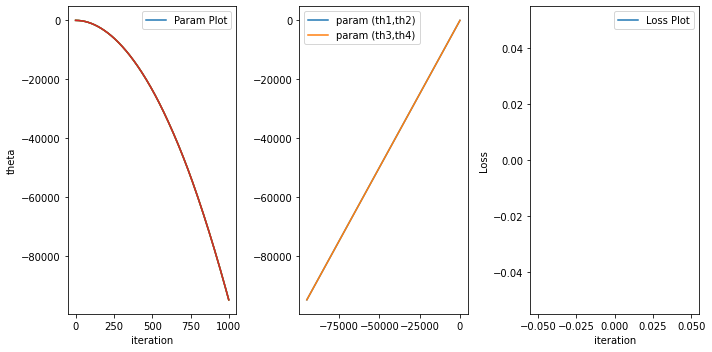

In [35]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()

### c1=0.01(small movement) delta=0.1+ (medium fluctuation)

In [ ]:
progress=[];
theta=[0,0,0,0];
thdata=[];

c1=0.01   
delta=6
nshot=3000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(1000):
    for i in range(400):
        delta=random.random()+0.1
        theta=theta-SPSA(i,theta,c1,delta,nshot)
        print(ep,"th iteration L=",lossCal2qubit(i,theta,nshot))
        progress.append(lossCal2qubit(i,theta,nshot))
        thdata.append(theta)

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()

### c1=0.01(small movement) delta=0+ (Large fluctuation)

In [ ]:
progress=[];
theta=[0,0,0,0];
thdata=[];

c1=0.01   
delta=6
nshot=3000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(1000):
    for i in range(400):
        delta=random.random()+0
        theta=theta-SPSA(i,theta,c1,delta,nshot)
        print(ep,"th iteration L=",lossCal2qubit(i,theta,nshot))
        progress.append(lossCal2qubit(i,theta,nshot))
        thdata.append(theta)

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()

c1=0.05(Medium movement) delta=0.3 (small fluctuation)

In [ ]:
progress=[];
theta=[0,0,0,0];
thdata=[];

c1=0.05  
delta=6
nshot=3000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(1000):
    for i in range(400):
        delta=random.random()+0.3
        theta=theta-SPSA(i,theta,c1,delta,nshot)
        print(ep,"th iteration L=",lossCal2qubit(i,theta,nshot))
        progress.append(lossCal2qubit(i,theta,nshot))
        thdata.append(theta)

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()

c1=0.05(Medium movement) delta=0.1 (Medium fluctuation)

In [ ]:
progress=[];
theta=[0,0,0,0];
thdata=[];

c1=0.05  
delta=6
nshot=3000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(1000):
    for i in range(400):
        delta=random.random()+0.1
        theta=theta-SPSA(i,theta,c1,delta,nshot)
        print(ep,"th iteration L=",lossCal2qubit(i,theta,nshot))
        progress.append(lossCal2qubit(i,theta,nshot))
        thdata.append(theta)

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()

In [ ]:
c1=0.05(Medium movement) delta=0. (Large fluctuation)

In [ ]:
progress=[];
theta=[0,0,0,0];
thdata=[];

c1=0.05  
delta=6
nshot=3000;
theta=np.array(theta)-SPSA(1,theta,c1,delta,nshot)
for ep in range(1000):
    for i in range(400):
        delta=random.random()
        theta=theta-SPSA(i,theta,c1,delta,nshot)
        print(ep,"th iteration L=",lossCal2qubit(i,theta,nshot))
        progress.append(lossCal2qubit(i,theta,nshot))
        thdata.append(theta)

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
print('After 1000 iteration we have theta =',theta)
axes[0].plot(thdata)
axes[0].set_ylabel('theta')
axes[0].legend(['Param Plot'])
axes[0].set_xlabel('iteration')
axes[1].plot([item[2] for item in thdata],[item[3] for item in thdata],[item[0] for item in thdata],[item[1] for item in thdata])
axes[1].legend(['param (th1,th2)','param (th3,th4)'])

axes[2].plot(progress)
axes[2].legend(['Loss Plot'])
axes[2].set_ylabel('Loss')
axes[2].set_xlabel('iteration')
fig.tight_layout()